In [1]:
import pandas as pd  # 导入各类模块
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.optimize import curve_fit

%config InlineBackend.figure_format = 'retina' # 设置图像清晰度

In [2]:
import csv

In [3]:
plt.rc('font', family='SimHei', size=7)  ##显示中文

In [4]:
import time
import string
data_diff = pd.read_excel('data/data_diff.xlsx')
change_date = []
for diff in data_diff['timestamp']:
    change_date.append(int(diff))
    timeStamp = int(diff)
    timeArray = time.localtime(timeStamp)
    diff = time.strftime("%Y--%m--%d %H:%M:%S", timeArray)
data_diff['timestamp']=change_date
print (data_diff.head(3))

   height   timestamp  diff  change        bits  average_time(seconds)  \
0    2016  1233063531     1     0.0  0x1d00ffff                   1020   
1    4032  1234466190     1     0.0  0x1d00ffff                    696   
2    6048  1235966513     1     0.0  0x1d00ffff                    744   

   average_hashrate  
0         4209307.0  
1         6173028.0  
2         5771193.0  


In [83]:
year = time.strptime('2019', "%Y",).tm_year
print(year)

2019


In [18]:
import time
import string
data_diff = '1231006505'
timeStamp = int(data_diff)
timeArray = time.localtime(timeStamp)
diff = time.strftime("%Y--%m--%d %H:%M:%S", timeArray)
print (diff)

2009--01--04 02:15:05


[2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]


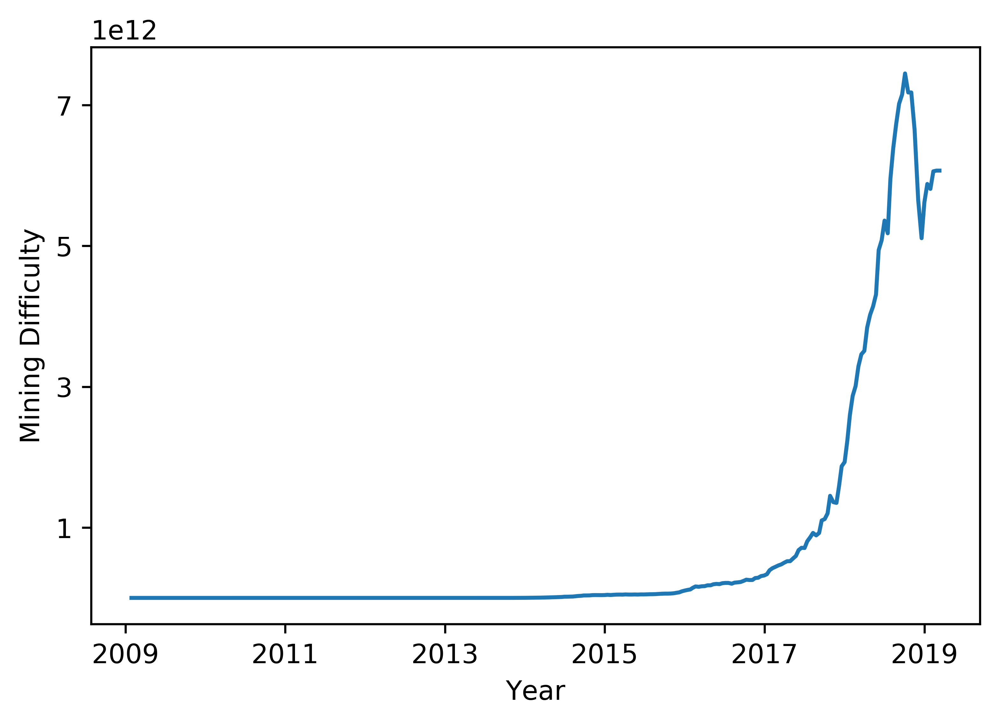

In [5]:
year_all = []
i_year = 2009
for i in range(0,11):
    year_all.append(time.strptime(str(i_year), "%Y").tm_year)
    i_year = i_year + 1
print(year_all)
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.plot(data_diff['timestamp'],data_diff['diff'])
plt.xticks(np.array([int(time.mktime(time.strptime('2009--01--01 00:00:01', "%Y--%m--%d %H:%M:%S"))), int(time.mktime(time.strptime('2011--01--01 00:00:01', "%Y--%m--%d %H:%M:%S"))), int(time.mktime(time.strptime('2013--01--01 00:00:01', "%Y--%m--%d %H:%M:%S"))), int(time.mktime(time.strptime('2015--01--01 00:00:01', "%Y--%m--%d %H:%M:%S"))), int(time.mktime(time.strptime('2017--01--01 00:00:01', "%Y--%m--%d %H:%M:%S"))), int(time.mktime(time.strptime('2019--01--01 00:00:01', "%Y--%m--%d %H:%M:%S")))]),(2009,2011,2013,2015,2017,2019))
plt.yticks([1e12,3e12,5e12,7e12])
plt.xlabel('Year')
plt.ylabel('Mining Difficulty')
#plt.title('Mining difficulty trends')
plt.savefig('./figure/diff.png')
plt.show()

In [44]:
data_pool = pd.read_excel('data/data_pool.xlsx')
print (data_pool.head(3))


   rank       name  number
0     1    BTC.com  0.1742
1     2    AntPool  0.1237
2     3  SlushPool  0.1079


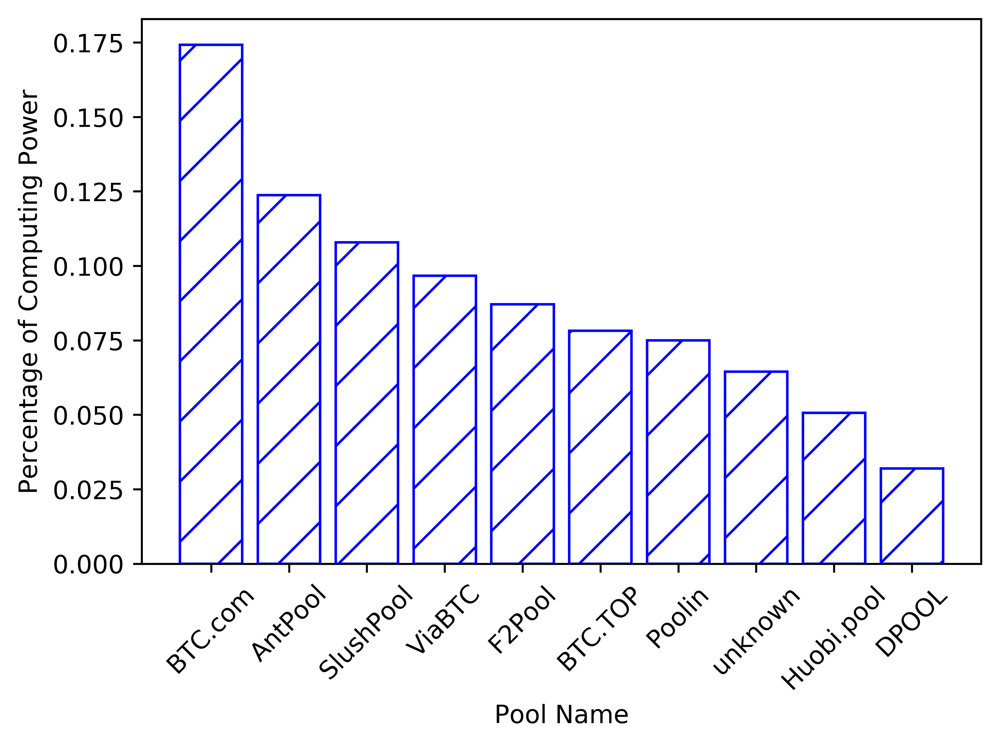

In [47]:
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.bar(data_pool['name'],data_pool['number'],hatch='/', color='white', edgecolor='blue')
plt.xlabel('Pool Name')
plt.ylabel('Percentage of Computing Power')
plt.xticks(rotation = 45)
plt.savefig('./figure/top-10_pool.png', bbox_inches= 'tight')
plt.show()

In [3]:
wing_num = pd.read_excel('data/k-wing.xlsx')
print (wing_num)

   name  nums
0    AM   224
1  Act.   477
2    KC   104
3    KI   512
4  Mar.  1761
5    OC    63


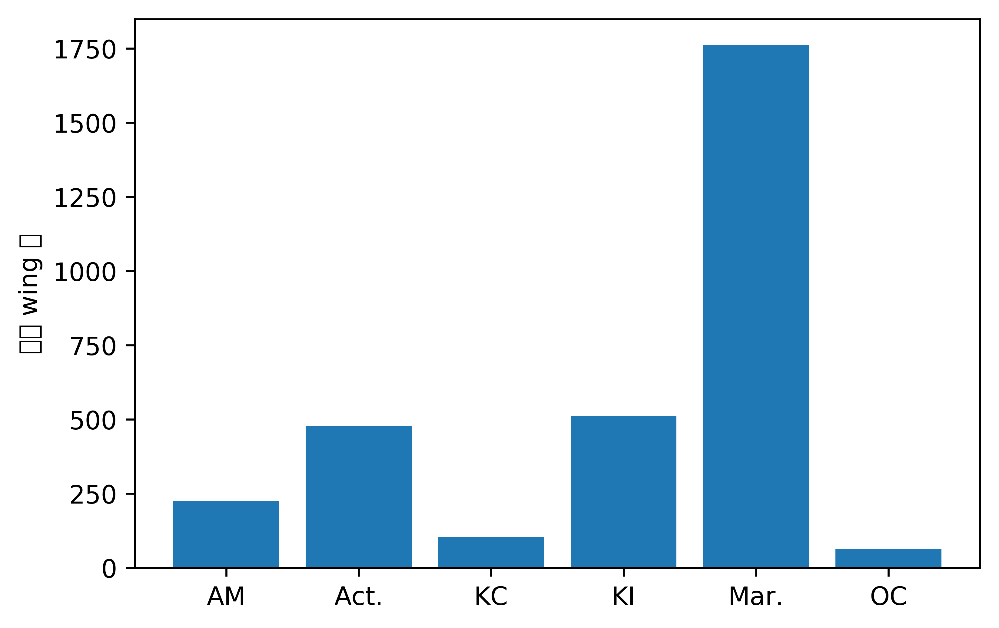

In [4]:
# plt.figure(figsize=(5,5))
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.bar(wing_num['name'],wing_num['nums'])
plt.ylabel('the Max Number of Wing')
plt.savefig('./figure/wing_number.png')
plt.show()

In [2]:
data_miner_num = pd.read_excel('data/data_miner_num.xlsx')
print (data_miner_num)

   year    num
0  2009  32490
1  2010  67911
2  2011  57294
3  2012  29928
4  2013   4728
5  2014   2190
6  2015    675
7  2016    288
8  2017    171
9  2018    186


In [9]:
miner_number = []
for miner in data_miner_num['num']:
    miner_number.append(miner)

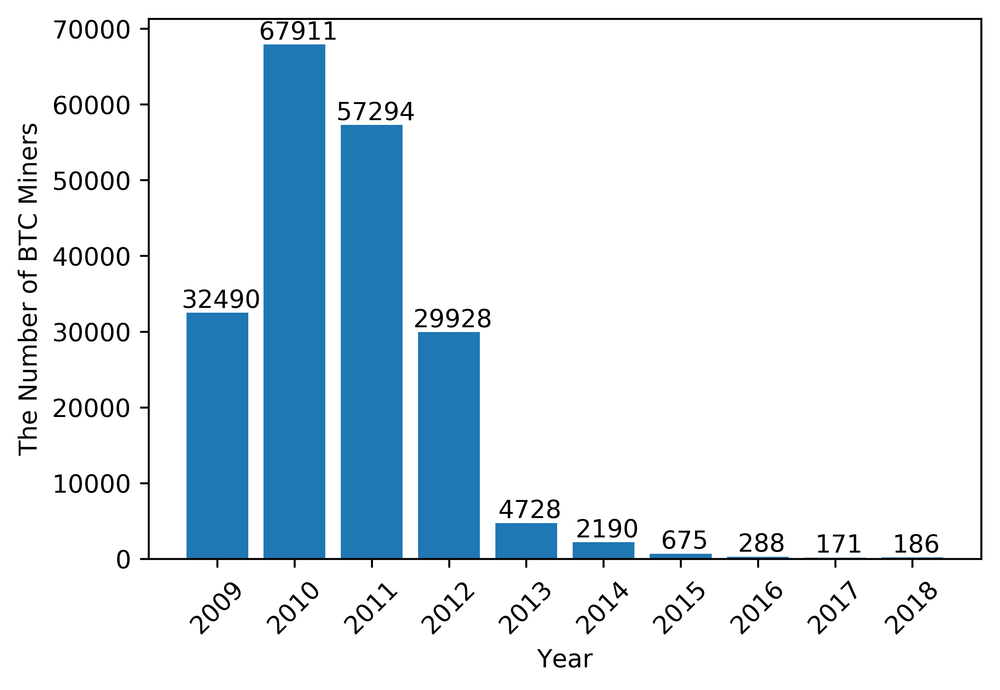

In [103]:
# plt.figure(figsize=(5,5))
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.bar(np.arange(len(data_miner_num['year'])),data_miner_num['num'])
for x,y in zip(np.arange(len(data_miner_num['year'])),data_miner_num['num']):
    plt.text(x+0.05,y+0.05,y, ha='center',va='bottom')
plt.xlabel('Year')
plt.ylabel('The Number of BTC Miners')
plt.xticks(np.arange(len(data_miner_num['year'])),['2009','2010','2011','2012','2013','2014','2015','2016','2017','2018'],rotation = 45)
plt.savefig('./figure/miner_number.png')
plt.show()

KeyError: 'Miner'

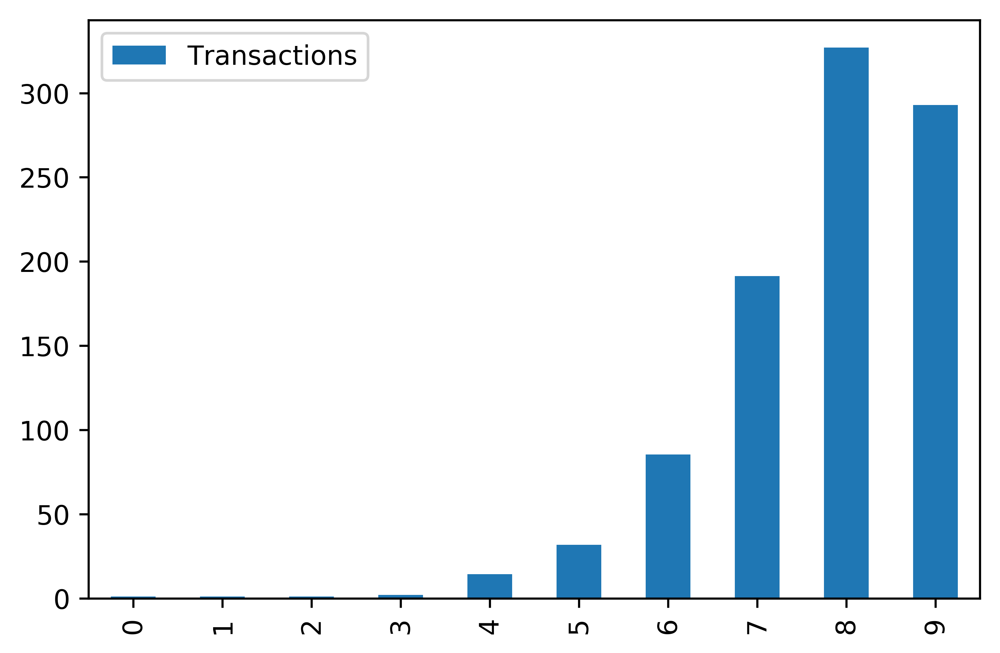

In [21]:
df=pd.DataFrame({'Miner':miner_number,'Transactions':data_average_mining_degree})
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
df.plot(kind='bar').get_figure()
plt.xticks(np.arange(len(df['Miner'])),['2009','2010','2011','2012','2013','2014','2015','2016','2017'])
plt.xlabel('Year')
plt.ylabel('Percentage(%)')
plt.savefig('./figure/1.jpg', bbox_inches= 'tight')
 

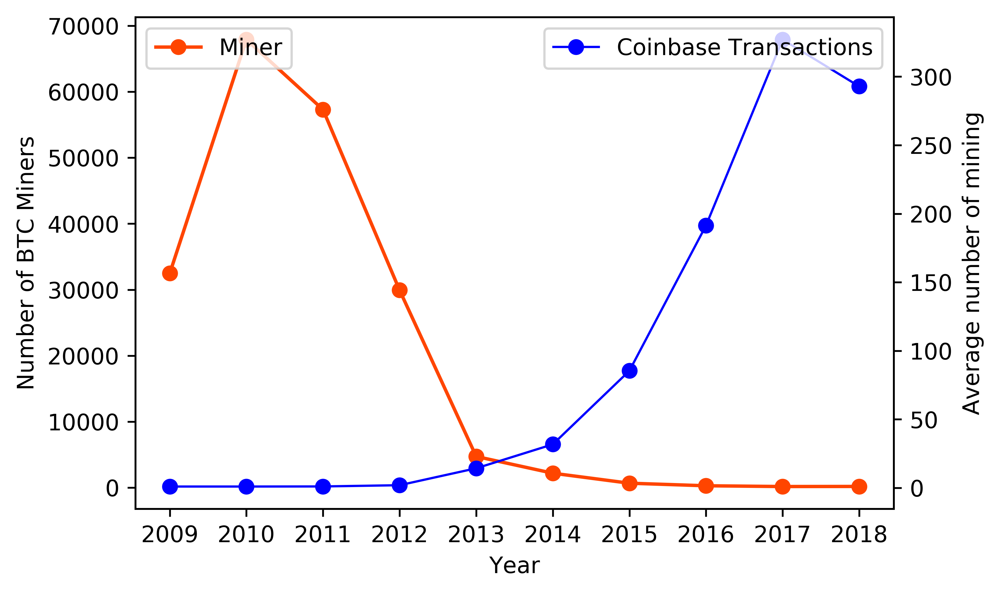

In [31]:
fig = plt.figure()
ax1 = fig.add_subplot(111)
ax2 =ax1.twinx()
x = ['2009','2010','2011','2012','2013','2014','2015','2016','2017','2018']
y1 = miner_number
y2 = data_average_mining_degree
ax1.plot(x,y1,'o-', c='orangered',label = 'Miner')# 折线 1 x 2 y 3 color
ax1.legend(loc=2)
ax2.plot(x,y2,'o-', c='blue',lw=1, label = 'Coinbase Transactions')# 4 line w
ax2.legend(loc=1)
ax1.set_ylabel('Number of BTC Miners')
ax1.set_xlabel('Year')
ax2.set_ylabel('Average number of mining')

plt.savefig('./figure/11.jpg', bbox_inches= 'tight')

In [3]:
list_dir = ['data/miner_information/information/2009/miner_information.csv','data/miner_information/information/2010/miner_information.csv','data/miner_information/information/2011/miner_information.csv','data/miner_information/information/2012/miner_information.csv','data/miner_information/information/2013/miner_information.csv','data/miner_information/information/2014/miner_information.csv','data/miner_information/information/2015/miner_information.csv','data/miner_information/information/2016/miner_information.csv','data/miner_information/information/2017/miner_information.csv']
outputfile = 'data/miner_info_all2.csv'
#header = [['id'],['indegree'],['income'],['outdegree'],['pay'],['miningdegree'],['miningincome'],['mining_time'],['in_time'],['out_time']]
#df = pd.DataFrame(headdata_miner_info_2009 = pd.read_csv('data/miner_information/information/2009/miner_information.csv',header = None,names = ['id','indegree','income','outdegree','pay','miningdegree','miningincome','mining_time','in_time','out_time'])
#df.to_csv(outputfile, mode='a', index=False, header=False)
for inputfile in list_dir:
    in_info = pd.read_csv(inputfile, header=None)
    df = pd.DataFrame(in_info, columns = None)
    df.to_csv(outputfile, mode='a', index=False, header=False)

C:\Users\21133\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2785: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [4]:
data_miner_info = pd.read_csv('data/miner_info_all.csv',header = None,names = ['id','indegree','income','outdegree','pay','miningdegree','miningincome','mining_time','in_time','out_time'])
str_to_int(data_miner_info)
print(data_miner_info.head(5))

      id  indegree  income  outdegree  pay  miningdegree  miningincome  \
0  17839         1      50          0    0             1            50   
1  12021         1      50          0    0             1            50   
2  30068         1      50          0    0             1            50   
3  14528         1      50          0    0             1            50   
4  17824         1      50          0    0             1            50   

  mining_time     in_time out_time  
0  1245648718  1245648718        0  
1  1240466390  1240466390        0  
2  1260982403  1260982403        0  
3  1242335081  1242335081        0  
4  1245630252  1245630252        0  


In [3]:
def str_to_int(data_miner_info):
    data_list = []
    for data in data_miner_info['indegree']:
        data = int(data)
        data_list.append(data)
    data_miner_info['indegree'] = data_list
    data_list = []
    for data in data_miner_info['income']:
        data = int(int(data)/100000000)
        data_list.append(data)
    data_miner_info['income'] = data_list
    data_list = []
    for data in data_miner_info['outdegree']:
        data = int(data)
        data_list.append(data)
    data_miner_info['outdegree'] = data_list
    data_list = []
    for data in data_miner_info['pay']:
        data = int(int(data)/100000000)
        data_list.append(data)
    data_miner_info['pay'] = data_list
    data_list = []
    for data in data_miner_info['miningdegree']:
        data = int(data)
        data_list.append(data)
    data_miner_info['miningdegree'] = data_list
    data_list = []
    for data in data_miner_info['miningincome']:
        data = int(int(data)/100000000)
        data_list.append(data)
    data_miner_info['miningincome'] = data_list

In [16]:
data_miner_info_2009 = pd.read_csv('data/miner_information/information/2009/miner_information.csv',header = None,names = ['id','indegree','income','outdegree','pay','miningdegree','miningincome','mining_time','in_time','out_time'])
str_to_int(data_miner_info_2009)
data_miner_info_2010 = pd.read_csv('data/miner_information/information/2010/miner_information.csv',header = None,names = ['id','indegree','income','outdegree','pay','miningdegree','miningincome','mining_time','in_time','out_time'])
str_to_int(data_miner_info_2010)
data_miner_info_2011 = pd.read_csv('data/miner_information/information/2011/miner_information.csv',header = None,names = ['id','indegree','income','outdegree','pay','miningdegree','miningincome','mining_time','in_time','out_time'])
str_to_int(data_miner_info_2011)
data_miner_info_2012 = pd.read_csv('data/miner_information/information/2012/miner_information.csv',header = None,names = ['id','indegree','income','outdegree','pay','miningdegree','miningincome','mining_time','in_time','out_time'])
str_to_int(data_miner_info_2012)
data_miner_info_2013 = pd.read_csv('data/miner_information/information/2013/miner_information.csv',header = None,names = ['id','indegree','income','outdegree','pay','miningdegree','miningincome','mining_time','in_time','out_time'])
str_to_int(data_miner_info_2013)
data_miner_info_2014 = pd.read_csv('data/miner_information/information/2014/miner_information.csv',header = None,names = ['id','indegree','income','outdegree','pay','miningdegree','miningincome','mining_time','in_time','out_time'])
str_to_int(data_miner_info_2014)
data_miner_info_2015 = pd.read_csv('data/miner_information/information/2015/miner_information.csv',header = None,names = ['id','indegree','income','outdegree','pay','miningdegree','miningincome','mining_time','in_time','out_time'])
str_to_int(data_miner_info_2015)
data_miner_info_2016 = pd.read_csv('data/miner_information/information/2016/miner_information.csv',header = None,names = ['id','indegree','income','outdegree','pay','miningdegree','miningincome','mining_time','in_time','out_time'])
str_to_int(data_miner_info_2016)
data_miner_info_2017 = pd.read_csv('data/miner_information/information/2017/miner_information.csv',header = None,names = ['id','indegree','income','outdegree','pay','miningdegree','miningincome','mining_time','in_time','out_time'])
str_to_int(data_miner_info_2017)

C:\Users\21133\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2785: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [17]:
data_miner_info_2009['all_degree'] = data_miner_info_2009['indegree'] + data_miner_info_2009['outdegree']
data_miner_info_2010['all_degree'] = data_miner_info_2010['indegree'] + data_miner_info_2010['outdegree']
data_miner_info_2011['all_degree'] = data_miner_info_2011['indegree'] + data_miner_info_2011['outdegree']
data_miner_info_2012['all_degree'] = data_miner_info_2012['indegree'] + data_miner_info_2012['outdegree']
data_miner_info_2013['all_degree'] = data_miner_info_2013['indegree'] + data_miner_info_2013['outdegree']
data_miner_info_2014['all_degree'] = data_miner_info_2014['indegree'] + data_miner_info_2014['outdegree']
data_miner_info_2015['all_degree'] = data_miner_info_2015['indegree'] + data_miner_info_2015['outdegree']
data_miner_info_2016['all_degree'] = data_miner_info_2016['indegree'] + data_miner_info_2016['outdegree']
data_miner_info_2017['all_degree'] = data_miner_info_2017['indegree'] + data_miner_info_2017['outdegree']

In [18]:
 data_info_2018 = pd.read_csv('miner_info_2018_3.csv',header = None, names=['id','miningdegree','income','all_degree'])

求平均度数

In [8]:
data_average_degree = []
data_average_mining_degree = []
data_average_oridinary_degree = []
list_miner_info= [data_miner_info_2009, data_miner_info_2010, data_miner_info_2011, data_miner_info_2012, data_miner_info_2013, data_miner_info_2014, data_miner_info_2015, data_miner_info_2016, data_miner_info_2017, data_info_2018]
i = 1
for miner_info in list_miner_info:
    i = i +1
    length = len(miner_info['id'])
    all_num = 0.0
    mining_num = 0.0
    for degree in miner_info['all_degree']:
        all_num = all_num + degree  
    for degree_mining in miner_info['miningdegree']:
        mining_num = mining_num + degree_mining
    print(all_num)
    print(mining_num)
    data_average_degree.append(all_num/length)
    data_average_mining_degree.append(mining_num/length)
    data_average_oridinary_degree.append((all_num - mining_num)/length)
print(i)

35314.0
32490.0
110507.0
67917.0
119785.0
61194.0
118606.0
59009.0
123409.0
67676.0
120126.0
69588.0
98270.0
57659.0
96419.0
55123.0
85107.0
55930.0
68975.0
54479.0
11


In [45]:
print(data_average_degree)
print(data_average_mining_degree)
print(data_average_oridinary_degree)

[1.086919052016005, 1.6272327016241845, 2.0907075784549867, 3.9630446404704625, 26.10173434856176, 54.85205479452055, 145.5851851851852, 334.78819444444446, 497.70175438596493, 370.71505376344084]
[1.0, 1.0000883509298935, 1.0680699549691066, 1.9716987436514302, 14.313874788494077, 31.775342465753425, 85.42074074074074, 191.39930555555554, 327.07602339181284, 292.89784946236557]
[0.08691905201600493, 0.6271443506942911, 1.0226376234858798, 1.9913458968190323, 11.787859560067682, 23.076712328767123, 60.16444444444444, 143.38888888888889, 170.62573099415204, 77.81720430107526]


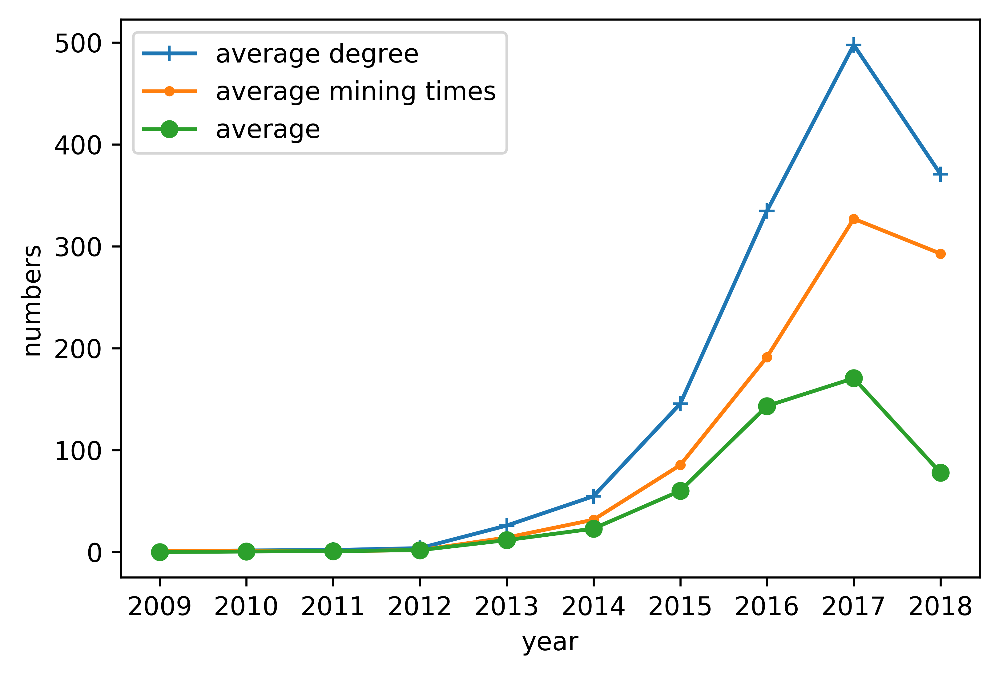

In [21]:
x_axix = [0,1,2,3,4,5,6,7,8,9]
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.plot(x_axix,data_average_degree,marker='+',label = 'average degree')
plt.plot(x_axix,data_average_mining_degree,marker='.',label = 'average mining times')
plt.plot(x_axix,data_average_oridinary_degree,marker='o',label = 'average')
plt.legend()
plt.xticks(x_axix,['2009','2010','2011','2012','2013','2014','2015','2016','2017','2018'])
plt.xlabel('Year')
plt.ylabel('Numbers')
plt.savefig('./figure/miner_average_degree_no_color.png', bbox_inches= 'tight')
plt.show()

In [5]:
 data_miner_info['mining_time'] = data_miner_info['mining_time'].apply(lambda x:':'+ str(x))
data_miner_info['in_time'] = data_miner_info['in_time'].apply(lambda x:':'+str( x))
data_miner_info['out_time'] = data_miner_info['out_time'].apply(lambda x:':'+str( x))

In [6]:
list_indegree = data_miner_info.groupby(by='id')['indegree'].sum()
list_indegree = pd.DataFrame({'indegree':list_indegree})
list_income = data_miner_info.groupby(by='id')['income'].sum()
list_income = pd.DataFrame({'income':list_income})
regroup =  list_indegree.merge(list_income,left_index=True,right_index=True, how='left')
list_outdegree = data_miner_info.groupby(by='id')['outdegree'].sum()
list_outdegree = pd.DataFrame({'outdegree':list_outdegree})
regroup =  regroup.merge(list_outdegree,left_index=True,right_index=True, how='left')
list_pay = data_miner_info.groupby(by='id')['pay'].sum()
list_pay = pd.DataFrame({'pay':list_pay})
regroup =  regroup.merge(list_pay,left_index=True,right_index=True, how='left')
list_miningdegree = data_miner_info.groupby(by='id')['miningdegree'].sum()
list_miningdegree = pd.DataFrame({'miningdegree':list_miningdegree})
regroup =  regroup.merge(list_miningdegree,left_index=True,right_index=True, how='left')
list_miningincome = data_miner_info.groupby(by='id')['miningincome'].sum()
list_miningincome = pd.DataFrame({'miningincome':list_miningincome})
regroup =  regroup.merge(list_miningincome,left_index=True,right_index=True, how='left')
list_mining_time = data_miner_info.groupby(by='id')['mining_time'].sum()
list_mining_time = pd.DataFrame({'mining_time':list_mining_time})
regroup =  regroup.merge(list_mining_time,left_index=True,right_index=True, how='left')
list_in_time = data_miner_info.groupby(by='id')['in_time'].sum()
list_in_time = pd.DataFrame({'in_time':list_in_time})
regroup =  regroup.merge(list_in_time,left_index=True,right_index=True, how='left')
list_out_time = data_miner_info.groupby(by='id')['out_time'].sum()
list_out_time  = pd.DataFrame({'out_time':list_out_time })
regroup =  regroup.merge(list_out_time ,left_index=True,right_index=True, how='left')
#miner_info = pd.DataFrame(data_miner_info1)
regroup.reset_index(inplace=True)
#miner_info = pd.DataFrame({'id':data_miner_info3['id'],'indegree':list_indegree,'income':list_income})
print(regroup.head(5))

   id  indegree  income  outdegree  pay  miningdegree  miningincome  \
0   1         1      50          0    0             1            50   
1   2         1      50          0    0             1            50   
2   3         1      50          0    0             1            50   
3   4         1      50          0    0             1            50   
4   5         1      50          0    0             1            50   

   mining_time      in_time out_time  
0  :1231006505  :1231006505       :0  
1  :1231469665  :1231469665       :0  
2  :1231469744  :1231469744       :0  
3  :1231470173  :1231470173       :0  
4  :1231470988  :1231470988       :0  


In [7]:
miner_info = regroup
miner_info['mining_time'] = miner_info['mining_time'].apply(lambda x :x[1:])
miner_info['in_time'] = miner_info['in_time'].apply(lambda x :x[1:])
miner_info['out_time'] = miner_info['out_time'].apply(lambda x :x[1:])
print(miner_info.head(5))

   id  indegree  income  outdegree  pay  miningdegree  miningincome  \
0   1         1      50          0    0             1            50   
1   2         1      50          0    0             1            50   
2   3         1      50          0    0             1            50   
3   4         1      50          0    0             1            50   
4   5         1      50          0    0             1            50   

  mining_time     in_time out_time  
0  1231006505  1231006505        0  
1  1231469665  1231469665        0  
2  1231469744  1231469744        0  
3  1231470173  1231470173        0  
4  1231470988  1231470988        0  


In [8]:
miner_info['all_degree'] = miner_info['indegree'] + miner_info['outdegree']
miner_info['all_time'] = miner_info['in_time'] + ':' + miner_info['out_time']
miner_info['hoard'] = miner_info['income'] - miner_info['pay']

In [17]:
import time
import string
import datetime
get_time = []
max_year = []
min_year = []
max_date = []
for index, miner in miner_info.iterrows():
    all_time = []
    all_time.append(miner['all_time'].split(':'))
    for i in range(0,len(all_time[0])):
        timeStamp = int(all_time[0][i])
        timeArray = time.localtime(timeStamp)
        diff = time.strftime("%Y--%m--%d %H:%M:%S", timeArray)
        all_time[0][i] = diff
    temp_time = []
    every_time = []
    for i in range(0,len(all_time[0])):
        date = time.strptime(all_time[0][i],"%Y--%m--%d %H:%M:%S")
        if date.tm_year != 1970:
            every_time.append(time.strftime("%Y--%m--%d %H:%M:%S", date))
            month = date.tm_mon
            m = str(date.tm_year)
            if month < 10:
                m = m + '0' + str(month)
            else:
                m = m + str(month)
            if date.tm_mday < 10:
                m = m + '0' + str(date.tm_mday)
            else:
                m = m + str(date.tm_mday)
            temp_time.append(m)
    date2 = time.strptime(min(every_time),"%Y--%m--%d %H:%M:%S")
    min_year.append(date2.tm_year)
    date1 = time.strptime(max(every_time),"%Y--%m--%d %H:%M:%S")
    max_year.append(date1.tm_year)
    max_date.append(max(every_time))
    temp = temp_time[0]
    for i in range(1,len(temp_time)):
        temp = temp + ';'+temp_time[i]
    get_time.append(temp)
miner_info['e_time'] = get_time
miner_info['max_year'] = max_year
miner_info['max_date'] = max_date
miner_info['min_year'] = min_year
print(miner_info.head(5))

   id  indegree  income  outdegree  pay  miningdegree  miningincome  \
0   1         1      50          0    0             1            50   
1   2         1      50          0    0             1            50   
2   3         1      50          0    0             1            50   
3   4         1      50          0    0             1            50   
4   5         1      50          0    0             1            50   

  mining_time     in_time out_time  all_degree      all_time  hoard    e_time  \
0  1231006505  1231006505        0           1  1231006505:0     50  20090104   
1  1231469665  1231469665        0           1  1231469665:0     50  20090109   
2  1231469744  1231469744        0           1  1231469744:0     50  20090109   
3  1231470173  1231470173        0           1  1231470173:0     50  20090109   
4  1231470988  1231470988        0           1  1231470988:0     50  20090109   

   max_year               max_date  min_year  
0      2009  2009--01--04 02:15:05     

In [86]:
import time
import string
import datetime
max_year = []
for index, miner in data_lost.iterrows():
    if miner['date'] != miner['date']:
        max_year.append(2018)
        continue 
    
    all_time = miner['date'].split(';')
        #timeArray = time.localtime(timeStamp)
        #diff = time.strftime("%Y--%m--%d %H:%M:%S", timeArray)
        #all_time[0][i] = diff
    every_time = []
    for i in range(0,len(all_time)-1):
        date = time.strptime(all_time[i],"%Y%m%d")
        if date.tm_year != 1970:
            every_time.append(time.strftime("%Y%m%d", date))
    date1 = time.strptime(min(every_time),"%Y%m%d")
    max_year.append(date1.tm_year)
data_lost['min_year'] = max_year
print(data_lost.head(5))

                                   id  miningdegree  income  \
0  1134jVdutTZpDfsPjLu4U1vE3UURdWeFui            15     189   
1  122Z63d9uRgYaAugxawaB79o12fRNYwFc8            79     976   
2  12s697aJ4bauc4eQG4MMZKwPUfgAFYeMcF             2      32   
3  13TEThZNnKPk34HYAuo1QqYMwDdjF3qeHx           707    8908   
4  13hQVEstgo4iPQZv9C7VELnLWF7UWtF4Q3           419    5454   

                                                date      money  min_year  
0                                                NaN   0.000000      2018  
1  20171218;20171217;20171203;20171202;20171105;2...   0.000000      2017  
2                                                NaN   0.000000      2018  
3                                          20171231;   0.001070      2017  
4  20180101;20180101;20171231;20171231;20171230;2...  94.363786      2017  


In [15]:
data_lost = pd.read_csv('miner_info_2018_2.csv',header = None, names = ['id','miningdegree','income','date','money'])
print(data_lost.head(5))

                                   id  miningdegree  income  \
0  1134jVdutTZpDfsPjLu4U1vE3UURdWeFui            15     189   
1  122Z63d9uRgYaAugxawaB79o12fRNYwFc8            79     976   
2  12s697aJ4bauc4eQG4MMZKwPUfgAFYeMcF             2      32   
3  13TEThZNnKPk34HYAuo1QqYMwDdjF3qeHx           707    8908   
4  13hQVEstgo4iPQZv9C7VELnLWF7UWtF4Q3           419    5454   

                                                date      money  
0                                                NaN   0.000000  
1  20171218;20171217;20171203;20171202;20171105;2...   0.000000  
2                                                NaN   0.000000  
3                                          20171231;   0.001070  
4  20180101;20180101;20171231;20171231;20171230;2...  94.363786  


In [11]:
miner_info.to_csv('miner_info_2009_2017.csv',index = False, header = 0)

In [28]:
miner_may_change = miner_info[miner_info['max_year']>2016]
miner_change_id = []
miner_change_address = []
miner_time_before = []
miner_time_after = []
miner_change_year = []
miner_money = []
print(len(miner_may_change['max_year']))
num = 0
for index, miner in miner_may_change.iterrows():
    all_time=miner['e_time'].split(';')
    is_change = False    
    for index2, miner2 in data_lost.iterrows():
        same_num =0
        if miner2['date'] != miner2['date']:
            continue   
        if miner['min_year'] != miner2['min_year']:
            continue
        for temp in all_time:
            if str(temp) in miner2['date']:
                same_num = same_num + 1
            if same_num == len(all_time):
                is_change = True
                miner_change_address.append(miner2['id'])
                miner_change_id.append(miner['id'])
                miner_time_before.append(miner['e_time'])
                miner_time_after.append(miner2['date'])
                miner_change_year.append(2018)
                miner_money.append(miner2['money'])
                break
        if is_change:
            break
    if is_change:
        num = num + 1
print(num)        

176
143


In [22]:
change = pd.DataFrame({'id':miner_change_id, 'address':miner_change_address,'before':miner_time_before,'after':miner_time_after,'max_year':miner_change_year,'money':miner_money})
change.to_csv('change.csv',index = False, header = 0)

In [15]:
change = pd.read_csv('change.csv',header = None, names = ['id','address','before','after','max_year','money'])

In [18]:
end_max_year = miner_info['max_year']
miner_money = miner_info['hoard']
num = 0
for index, miner in change.iterrows():
    for index1, miner1 in miner_info.iterrows():
        if miner1['id'] == miner['id']:
            num = num + 1
            end_max_year[index1] = miner['max_year']
            miner_money[index1] = miner['money']
            break
miner_info['max_year'] = end_max_year
miner_info['hoard'] = miner_money
print(num)

C:\Users\21133\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Users\21133\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


143


In [19]:
miner_info.to_csv('miner_info_change.csv',index = False, header = 0)

In [20]:
print(miner_info.head(5))

   id  indegree  income  outdegree  pay  miningdegree  miningincome  \
0   1         1      50          0    0             1            50   
1   2         1      50          0    0             1            50   
2   3         1      50          0    0             1            50   
3   4         1      50          0    0             1            50   
4   5         1      50          0    0             1            50   

  mining_time     in_time out_time  all_degree      all_time  hoard    e_time  \
0  1231006505  1231006505        0           1  1231006505:0     50  20090104   
1  1231469665  1231469665        0           1  1231469665:0     50  20090109   
2  1231469744  1231469744        0           1  1231469744:0     50  20090109   
3  1231470173  1231470173        0           1  1231470173:0     50  20090109   
4  1231470988  1231470988        0           1  1231470988:0     50  20090109   

   max_year               max_date  min_year  
0      2009  2009--01--04 02:15:05     

In [29]:
miner_change_id = []
miner_change_address = []
#miner_may_change = miner_info[miner_info['max_year']>2016]
miner_change_year = miner_info['max_year']
miner_money = miner_info['hoard']
num = 0
#miner_may_change = miner_info[miner_info['max_year']>2016]
for index, miner in miner_info.iterrows():
    all_time=miner['e_time'].split(';')
    is_change = False 
    same_miner = None
    money = None
    for index2, miner2 in data_lost.iterrows():
        same_num =0
        if miner2['date'] != miner2['date']:
            continue
        for temp in all_time:
            if str(temp) in miner2['date']:
                same_num = same_num + 1
            if same_num == len(all_time):
                is_change = True
                break
        if is_change:
            same_miner = miner2['id']
            money = miner2['money']
            break
    if is_change:
        num = num + 1
        miner_change_id.append(miner['id'])
        miner_change_address.append(same_miner)
        miner_change_year[index] = 2018
        miner_money[index] = money
miner_info['max_year'] = miner_change_year
miner_info['hoard'] = miner_money
print(num)        

C:\Users\21133\Anaconda3\lib\site-packages\ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Users\21133\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


38271


In [108]:
import time
import string
import datetime
degree_mining = []
duration_mining = []
interval_mining = []
for index, miner in miner_info.iterrows():
    degree_mining.append(int(miner['miningdegree']))
    if int(miner['miningdegree'])<=1:
        duration_mining.append(0)
        interval_mining.append(0)
    if int(miner['miningdegree'])>1:
        all_time = []
        all_time.append(miner['mining_time'].split(':'))
        for i in range(0,len(all_time[0])):
            timeStamp = int(all_time[0][i])
            timeArray = time.localtime(timeStamp)
            diff = time.strftime("%Y--%m--%d %H:%M:%S", timeArray)
            all_time[0][i] = diff
        temp_time = []
        for i in range(0,len(all_time[0])):
            date = time.strptime(all_time[0][i],"%Y--%m--%d %H:%M:%S")
            if date.tm_year != 1970:
                temp_time.append(time.strftime("%Y--%m--%d %H:%M:%S", date))
        
        date1 = time.strptime(max(temp_time),"%Y--%m--%d %H:%M:%S")
        date_min = min(temp_time)
        date2 = time.strptime(min(temp_time),"%Y--%m--%d %H:%M:%S") 
        date_max=datetime.datetime(date1[0],date1[1],date1[2],date1[3],date1[4],date1[5]) 
        date_min=datetime.datetime(date2[0],date2[1],date2[2],date2[3],date2[4],date2[5]) 
        duration_mining.append(int((date_max - date_min).total_seconds()))
        interval_mining.append(int((date_max - date_min).total_seconds())/(int(miner['miningdegree'])-1))
        if int((date_max - date_min).total_seconds()) > 31536000:
            print(date1)
            print(date_min)
            print(date_max - date_min)
mining_duration = pd.DataFrame({'mining_degree':degree_mining,'mining_duration':duration_mining})
mining_interval = pd.DataFrame({'mining_degree':degree_mining, 'interval':interval_mining})
mining_interval.sort_values("interval",inplace=True)
mining_duration.sort_values("mining_duration",inplace=True)

time.struct_time(tm_year=2012, tm_mon=12, tm_mday=7, tm_hour=0, tm_min=0, tm_sec=36, tm_wday=4, tm_yday=342, tm_isdst=-1)
2011-08-08 09:48:48
486 days, 14:11:48
time.struct_time(tm_year=2012, tm_mon=10, tm_mday=3, tm_hour=5, tm_min=54, tm_sec=55, tm_wday=2, tm_yday=277, tm_isdst=-1)
2011-07-21 05:27:17
440 days, 0:27:38
time.struct_time(tm_year=2012, tm_mon=12, tm_mday=30, tm_hour=10, tm_min=49, tm_sec=9, tm_wday=6, tm_yday=365, tm_isdst=-1)
2011-07-24 05:11:08
525 days, 5:38:01
time.struct_time(tm_year=2012, tm_mon=12, tm_mday=9, tm_hour=15, tm_min=42, tm_sec=29, tm_wday=6, tm_yday=344, tm_isdst=-1)
2011-08-16 18:46:18
480 days, 20:56:11
time.struct_time(tm_year=2012, tm_mon=12, tm_mday=28, tm_hour=0, tm_min=3, tm_sec=49, tm_wday=4, tm_yday=363, tm_isdst=-1)
2011-08-14 03:30:36
501 days, 20:33:13
time.struct_time(tm_year=2012, tm_mon=10, tm_mday=25, tm_hour=18, tm_min=58, tm_sec=29, tm_wday=3, tm_yday=299, tm_isdst=-1)
2011-08-17 13:59:10
435 days, 4:59:19
time.struct_time(tm_year=201

time.struct_time(tm_year=2015, tm_mon=12, tm_mday=15, tm_hour=0, tm_min=0, tm_sec=18, tm_wday=1, tm_yday=349, tm_isdst=-1)
2014-08-06 11:30:55
495 days, 12:29:23
time.struct_time(tm_year=2015, tm_mon=12, tm_mday=13, tm_hour=0, tm_min=15, tm_sec=0, tm_wday=6, tm_yday=347, tm_isdst=-1)
2014-08-13 18:19:53
486 days, 5:55:07
time.struct_time(tm_year=2015, tm_mon=8, tm_mday=22, tm_hour=15, tm_min=18, tm_sec=53, tm_wday=5, tm_yday=234, tm_isdst=-1)
2014-08-17 03:42:37
370 days, 11:36:16
time.struct_time(tm_year=2018, tm_mon=1, tm_mday=1, tm_hour=7, tm_min=43, tm_sec=42, tm_wday=0, tm_yday=1, tm_isdst=-1)
2014-09-30 07:43:15
1189 days, 0:00:27
time.struct_time(tm_year=2016, tm_mon=9, tm_mday=25, tm_hour=15, tm_min=55, tm_sec=6, tm_wday=6, tm_yday=269, tm_isdst=-1)
2014-10-08 21:30:23
717 days, 18:24:43
time.struct_time(tm_year=2018, tm_mon=1, tm_mday=1, tm_hour=7, tm_min=33, tm_sec=35, tm_wday=0, tm_yday=1, tm_isdst=-1)
2014-10-22 05:15:40
1167 days, 2:17:55
time.struct_time(tm_year=2016, tm_

In [70]:
miner_info = pd.read_csv('miner_info_change.csv',header = None, names = ['id', 'indegree', 'income','outdegree','pay','miningdegree','miningincome','mining_time','in_time','out_time','all_degree','all_time','hoard','e_time','max_year','max_date','min_year'])

C:\Users\21133\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2785: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [71]:
import time
import string
import datetime
date1 = time.strptime('2019--01--01 00:00:01', "%Y--%m--%d %H:%M:%S")
date_2019=datetime.datetime(date1[0],date1[1],date1[2],date1[3],date1[4],date1[5]) 
hoard_time=[]
for index, miner in miner_info.iterrows():
    if miner['max_year'] != 2018:
        date2 = time.strptime(miner['max_date'],"%Y--%m--%d %H:%M:%S")
        date_max=datetime.datetime(date2[0],date2[1],date2[2],date2[3],date2[4],date2[5])
        hoard_time.append(int((date_2019-date_max).total_seconds()))
print(len(hoard_time))

195264


In [65]:
graph_act = pd.read_csv('data_yan\out.actor2_wing_number.csv',header = None, names = ['number'])

In [66]:
graph_AM = pd.read_csv('data_yan\out.actor-movie_wing_number.csv',header = None, names = ['number'])

In [67]:
graph_KC = pd.read_csv('data_yan\out.komarix-citeseer_wing_number.csv',header = None, names = ['number'])

In [68]:
graph_KI = pd.read_csv('data_yan\out.komarix-imdb_wing_number.csv',header = None, names = ['number'])

In [69]:
graph_Mar = pd.read_csv('data_yan\out.marvel_wing_number.csv',header = None, names = ['number'])

In [70]:
graph_OC = pd.read_csv('data_yan\out.opsahl-collaboration_wing_number.csv',header = None, names = ['number'])

In [71]:
graph_OC.head(5)

,number
0,36
1,36
2,36
3,36
4,36


In [ ]:
def get_graph_list(dataset):
    temp = []
    for data in 

In [72]:
def get_graph_cdf(dataset):
    count = len(dataset)
    dataset = np.sort(dataset)
    dataset_cdf = [[],[]]
    i = 1
    for data in dataset:
        dataset_cdf[0].append(data)
        dataset_cdf[1].append(i/float(count))
        i = i + 1
    return dataset_cdf

In [73]:
graph_act_cdf = get_graph_cdf(graph_act['number'])
graph_AM_cdf = get_graph_cdf(graph_AM['number'])
graph_KC_cdf = get_graph_cdf(graph_KC['number'])
graph_KI_cdf = get_graph_cdf(graph_KI['number'])
graph_Mar_cdf = get_graph_cdf(graph_Mar['number'])
graph_OC_cdf = get_graph_cdf(graph_OC['number'])

In [21]:
graph_AM_cdf[1]

[]

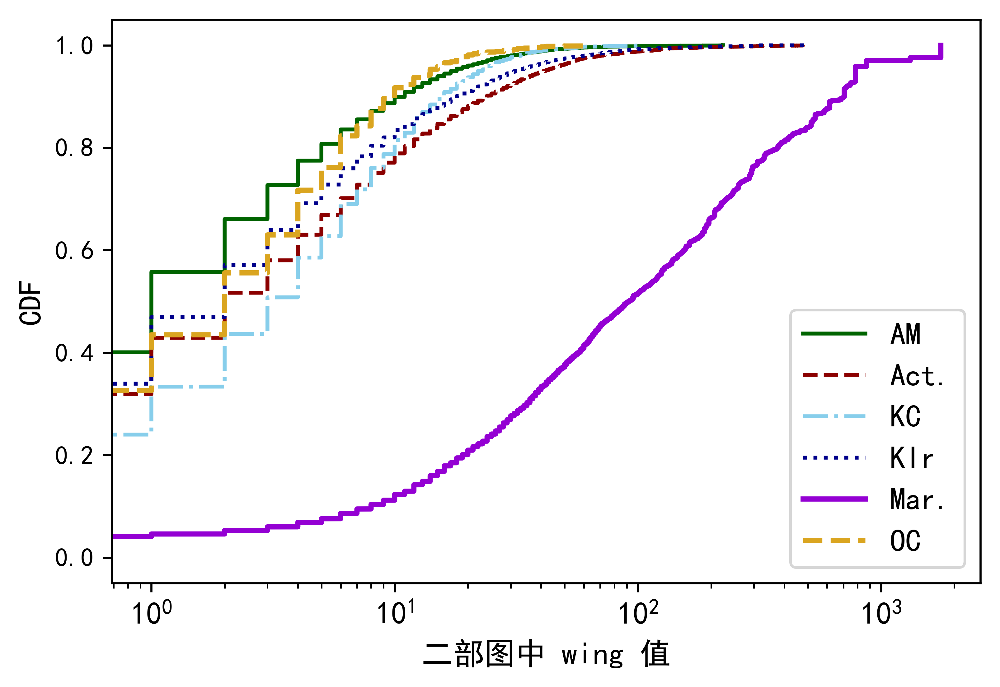

In [78]:
plt.axes(xscale ='log')
#plt.plot(x_axix,miner,color = 'black',label = 'active miner')
plt.plot(graph_AM_cdf[0],graph_AM_cdf[1],color = 'darkgreen',linestyle='-',label = 'AM')
#plt.scatter(x_axix,miner_2,color = 'green')
plt.plot(graph_act_cdf[0],graph_act_cdf[1],color = 'darkred', linestyle='--', label = 'Act.')
#plt.scatter(x_axix,miner_5,color = 'red')
plt.plot(graph_KC_cdf[0],graph_KC_cdf[1],color = 'skyblue', linestyle='-.', label = 'KC')
#plt.scatter(x_axix,miner_10,color = 'skyblue')
plt.plot(graph_KI_cdf[0],graph_KI_cdf[1],color = 'darkblue', linestyle=':', label = 'KIr')
#plt.scatter(x_axix,miner_20,color = 'blue')
plt.plot(graph_Mar_cdf[0],graph_Mar_cdf[1],color = 'darkviolet', linestyle='-', linewidth=2.0, label = 'Mar.')

plt.plot(graph_OC_cdf[0],graph_OC_cdf[1],color = 'goldenrod', linestyle='--',linewidth=2.0, label = 'OC')
#plt.scatter(x_axix,miner_50,color = 'purple')
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.xlabel('二部图中 wing 值', fontsize=12)
plt.ylabel('CDF', fontsize=12)
plt.savefig('./figure_yan/wing_number_cdf.jpg', bbox_inches= 'tight')
plt.show()

In [60]:
graph_scale = pd.read_excel('data_yan/graph_scale_1.xlsx')

In [31]:
graph_scale.head(5)

,index,AM,Act.,KC,KI,Mar.,OC
0,1,95.363636,267.764706,11.500000,147.800000,385.000000,30.0
1,10,87.416667,206.909091,6.571429,158.357143,385.000000,30.0
2,100,80.692308,65.971014,4.600000,37.576271,25.666667,7.5
3,1000,74.928571,37.933333,3.538462,4.469758,5.065789,5.0
4,10000,65.562500,6.143050,0.718750,2.924802,0.080208,1.5


C:\Users\21133\Anaconda3\lib\site-packages\matplotlib\mathtext.py:849: MathTextWarning: Font 'default' does not have a glyph for '-' [U+2212]
  MathTextWarning)
C:\Users\21133\Anaconda3\lib\site-packages\matplotlib\mathtext.py:850: MathTextWarning: Substituting with a dummy symbol.
  warn("Substituting with a dummy symbol.", MathTextWarning)


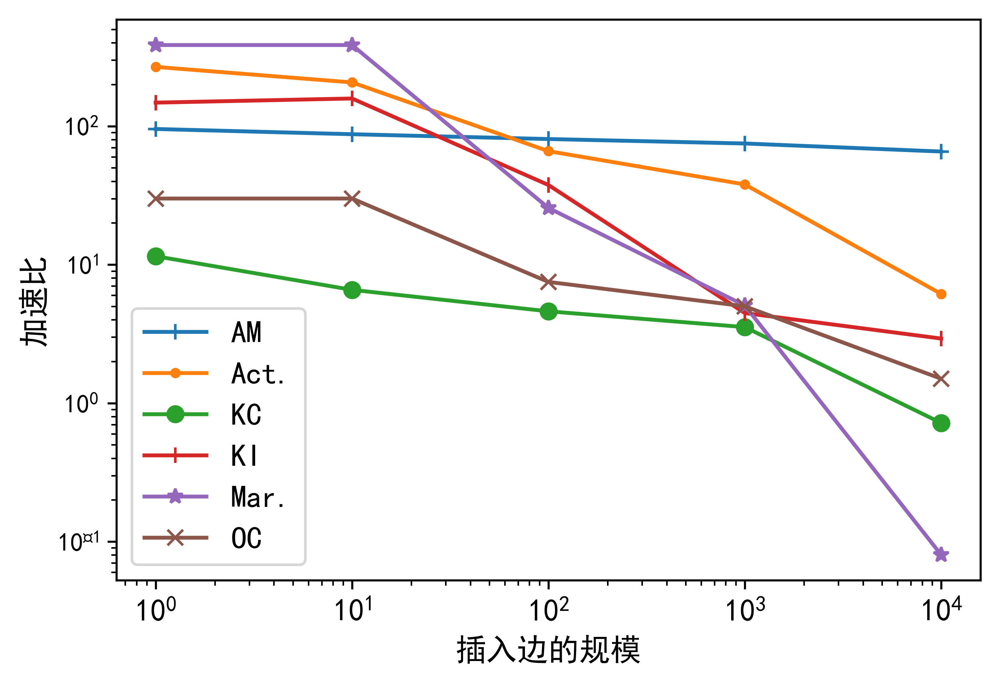

In [79]:
plt.axes(xscale ='log', yscale = 'log')
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.plot(graph_scale['index'],graph_scale['AM'],marker='+',label = 'AM')
plt.plot(graph_scale['index'],graph_scale['Act.'],marker='.',label = 'Act.')
plt.plot(graph_scale['index'],graph_scale['KC'],marker='o',label = 'KC')
plt.plot(graph_scale['index'],graph_scale['KI'],marker='|',label = 'KI')
plt.plot(graph_scale['index'],graph_scale['Mar.'],marker='*',label = 'Mar.')
plt.plot(graph_scale['index'],graph_scale['OC'],marker='x',label = 'OC')
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.xlabel('插入边的规模',fontsize=12)
plt.ylabel('加速比',fontsize=12)
plt.savefig('./figure_yan/graph_scale.png', bbox_inches= 'tight')
plt.show()

In [80]:
graph_removel_scale = pd.read_excel('data_yan/removel_scale.xlsx')

C:\Users\21133\Anaconda3\lib\site-packages\matplotlib\mathtext.py:849: MathTextWarning: Font 'default' does not have a glyph for '-' [U+2212]
  MathTextWarning)
C:\Users\21133\Anaconda3\lib\site-packages\matplotlib\mathtext.py:850: MathTextWarning: Substituting with a dummy symbol.
  warn("Substituting with a dummy symbol.", MathTextWarning)


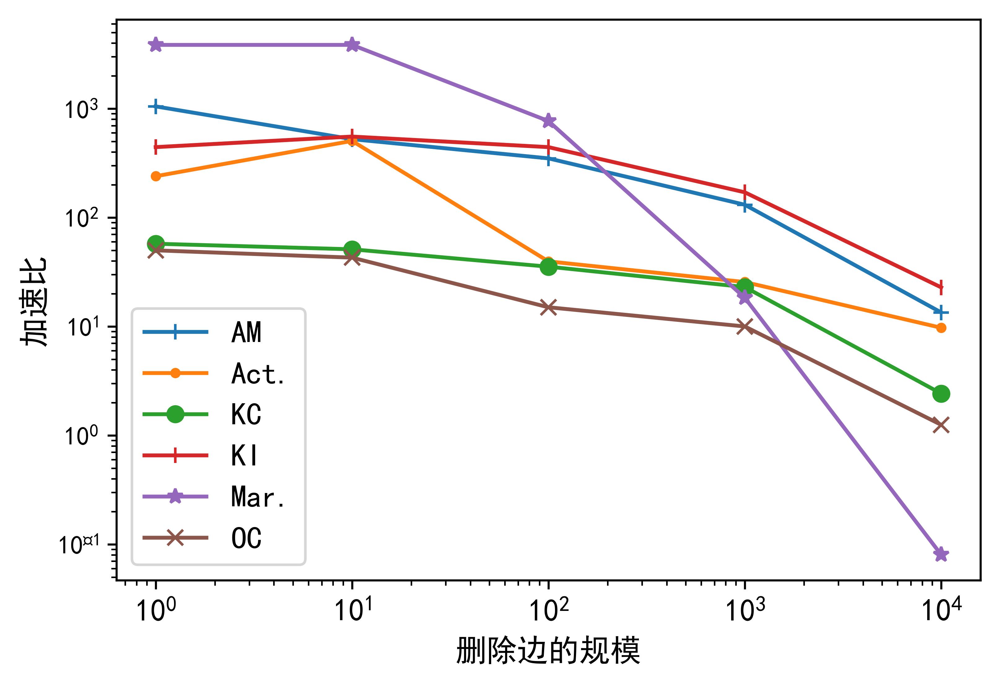

In [81]:
plt.axes(xscale ='log', yscale = 'log')
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.plot(graph_removel_scale['index'],graph_removel_scale['AM'],marker='+',label = 'AM')
plt.plot(graph_removel_scale['index'],graph_removel_scale['Act.'],marker='.',label = 'Act.')
plt.plot(graph_removel_scale['index'],graph_removel_scale['KC'],marker='o',label = 'KC')
plt.plot(graph_removel_scale['index'],graph_removel_scale['KI'],marker='|',label = 'KI')
plt.plot(graph_removel_scale['index'],graph_removel_scale['Mar.'],marker='*',label = 'Mar.')
plt.plot(graph_removel_scale['index'],graph_removel_scale['OC'],marker='x',label = 'OC')
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.xlabel('删除边的规模',fontsize=12)
plt.ylabel('加速比',fontsize=12)
plt.savefig('./figure_yan/graph_removel_scale.png', bbox_inches= 'tight')
plt.show()

paralle

In [82]:
graph_DA = pd.read_csv('data_yan\out.dblp-author_wing_number.csv',header = None, names = ['number'])

In [83]:
graph_WC = pd.read_csv('data_yan\out.wiki-en-cat_wing_number.csv',header = None, names = ['number'])

In [84]:
graph_act = pd.read_csv('data_yan\out.actor2_wing_number.csv',header = None, names = ['number'])

In [85]:
graph_AM = pd.read_csv('data_yan\out.actor-movie_wing_number.csv',header = None, names = ['number'])

In [86]:
graph_KI = pd.read_csv('data_yan\out.komarix-imdb_wing_number.csv',header = None, names = ['number'])

In [87]:
graph_act_cdf = get_graph_cdf(graph_act['number'])
graph_AM_cdf = get_graph_cdf(graph_AM['number'])
graph_KI_cdf = get_graph_cdf(graph_KI['number'])
graph_DA_cdf = get_graph_cdf(graph_DA['number'])
graph_WC_cdf = get_graph_cdf(graph_WC['number'])

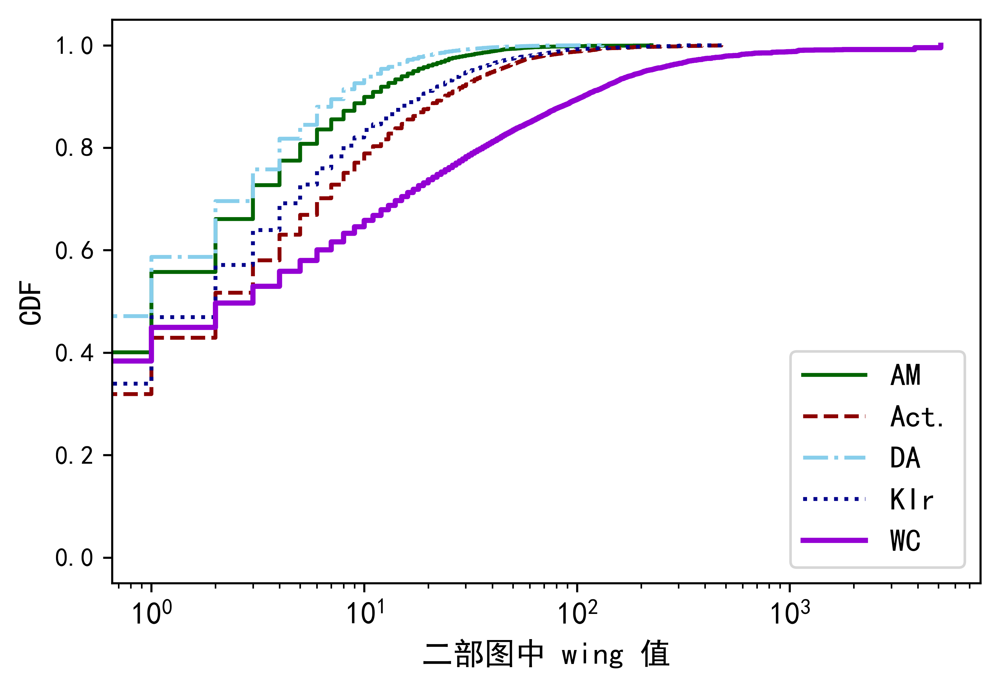

In [88]:
plt.axes(xscale ='log')
#plt.plot(x_axix,miner,color = 'black',label = 'active miner')
plt.plot(graph_AM_cdf[0],graph_AM_cdf[1],color = 'darkgreen',linestyle='-',label = 'AM')
#plt.scatter(x_axix,miner_2,color = 'green')
plt.plot(graph_act_cdf[0],graph_act_cdf[1],color = 'darkred', linestyle='--', label = 'Act.')
#plt.scatter(x_axix,miner_5,color = 'red')
plt.plot(graph_DA_cdf[0],graph_DA_cdf[1],color = 'skyblue', linestyle='-.', label = 'DA')
#plt.scatter(x_axix,miner_10,color = 'skyblue')
plt.plot(graph_KI_cdf[0],graph_KI_cdf[1],color = 'darkblue', linestyle=':', label = 'KIr')
#plt.scatter(x_axix,miner_20,color = 'blue')
plt.plot(graph_WC_cdf[0],graph_WC_cdf[1],color = 'darkviolet', linestyle='-', linewidth=2.0, label = 'WC')

#plt.scatter(x_axix,miner_50,color = 'purple')
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.xlabel('二部图中 wing 值', fontsize=12)
plt.ylabel('CDF',fontsize=12)
plt.savefig('./figure/wing_number_paralle_cdf.jpg', bbox_inches= 'tight')
plt.show()

In [89]:
graph_scale = pd.read_excel('data_yan/graph_scale_2.xlsx')

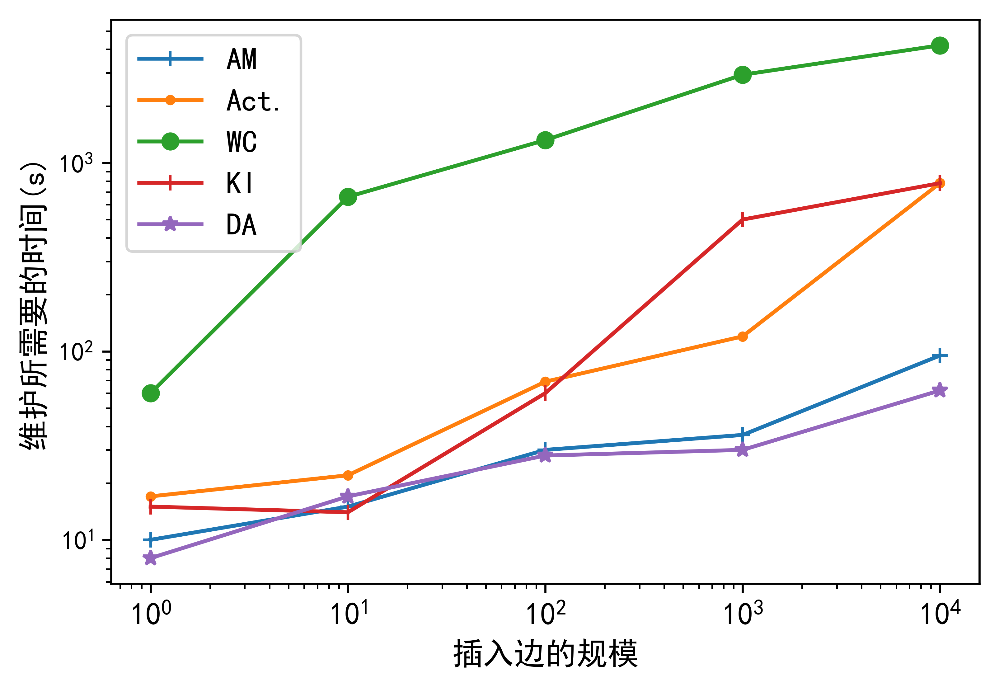

In [90]:
plt.axes(xscale ='log', yscale = 'log')
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.plot(graph_scale['index'],graph_scale['AM'],marker='+',label = 'AM')
plt.plot(graph_scale['index'],graph_scale['Act.'],marker='.',label = 'Act.')
plt.plot(graph_scale['index'],graph_scale['WC'],marker='o',label = 'WC')
plt.plot(graph_scale['index'],graph_scale['KI'],marker='|',label = 'KI')
plt.plot(graph_scale['index'],graph_scale['DA'],marker='*',label = 'DA')
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.xlabel('插入边的规模',fontsize=12)
plt.ylabel('维护所需要的时间(s)',fontsize=12)
plt.savefig('./figure_yan/graph_scale_thread.png', bbox_inches= 'tight')
plt.show()

In [91]:
graph_scale_removal = pd.read_excel('data_yan/graph_scale_removel.xlsx')

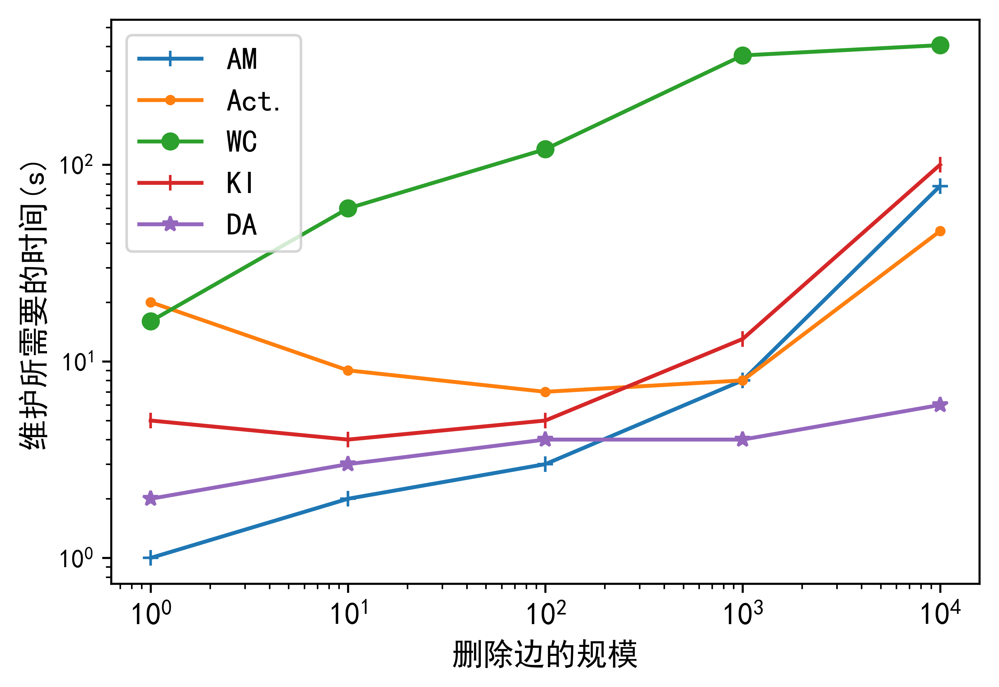

In [92]:
plt.axes(xscale ='log', yscale = 'log')
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.plot(graph_scale_removal['index'],graph_scale_removal['AM'],marker='+',label = 'AM')
plt.plot(graph_scale_removal['index'],graph_scale_removal['Act.'],marker='.',label = 'Act.')
plt.plot(graph_scale_removal['index'],graph_scale_removal['WC'],marker='o',label = 'WC')
plt.plot(graph_scale_removal['index'],graph_scale_removal['KI'],marker='|',label = 'KI')
plt.plot(graph_scale_removal['index'],graph_scale_removal['DA'],marker='*',label = 'DA')
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.xlabel('删除边的规模',fontsize=12)
plt.ylabel('维护所需要的时间(s)',fontsize=12)
plt.savefig('./figure_yan/graph_scale_thread_removel.png', bbox_inches= 'tight')
plt.show()

In [93]:
graph_scale_8 = pd.read_excel('data_yan/paralle_8_insertion.xlsx')

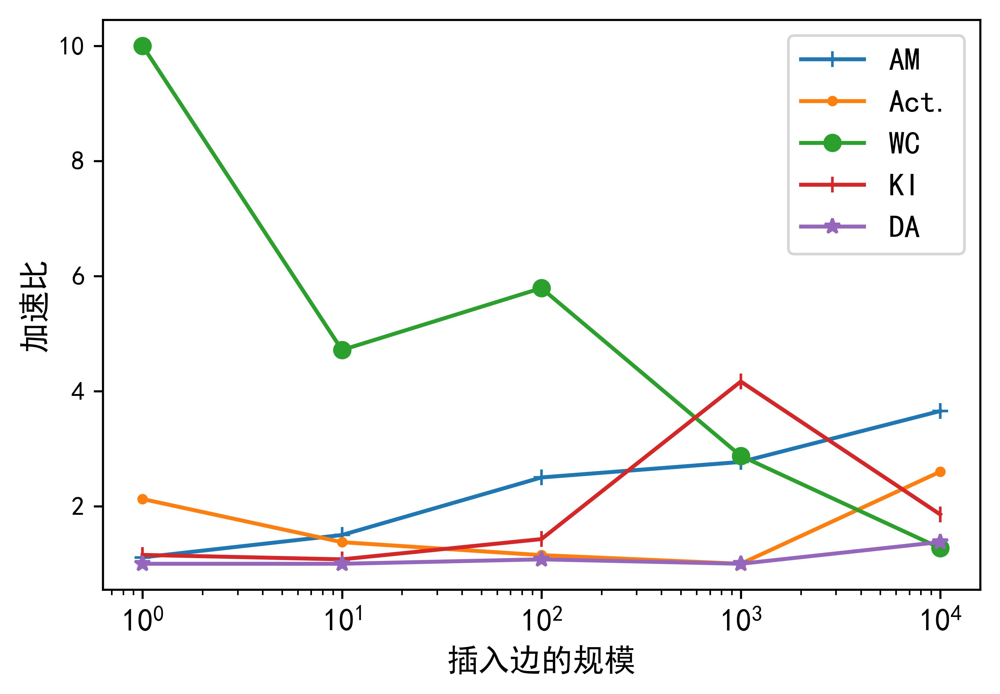

In [94]:
plt.axes(xscale ='log')
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.plot(graph_scale_8['index'],graph_scale_8['AM'],marker='+',label = 'AM')
plt.plot(graph_scale_8['index'],graph_scale_8['Act.'],marker='.',label = 'Act.')
plt.plot(graph_scale_8['index'],graph_scale_8['WC'],marker='o',label = 'WC')
plt.plot(graph_scale_8['index'],graph_scale_8['KI'],marker='|',label = 'KI')
plt.plot(graph_scale_8['index'],graph_scale_8['DA'],marker='*',label = 'DA')
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.xlabel('插入边的规模',fontsize=12)
plt.ylabel('加速比',fontsize=12)
plt.savefig('./figure_yan/graph_scale_paralle_8.png', bbox_inches= 'tight')
plt.show()

In [95]:
graph_scale_8_removel = pd.read_excel('data_yan/paralle_8_removel.xlsx')

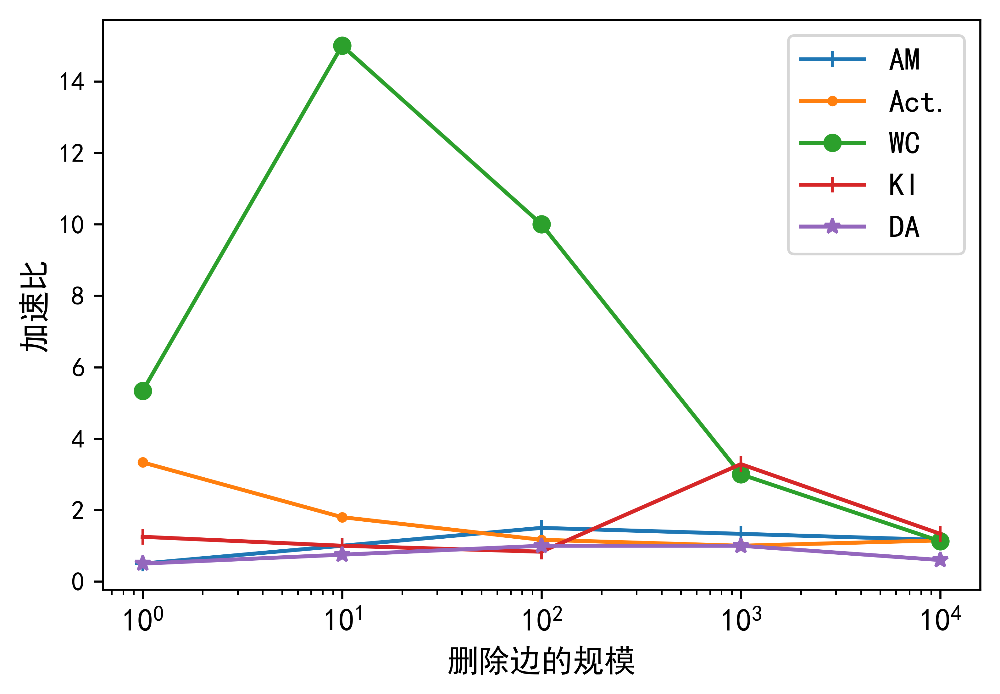

In [96]:
plt.axes(xscale ='log')
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.plot(graph_scale_8_removel['index'],graph_scale_8_removel['AM'],marker='+',label = 'AM')
plt.plot(graph_scale_8_removel['index'],graph_scale_8_removel['Act.'],marker='.',label = 'Act.')
plt.plot(graph_scale_8_removel['index'],graph_scale_8_removel['WC'],marker='o',label = 'WC')
plt.plot(graph_scale_8_removel['index'],graph_scale_8_removel['KI'],marker='|',label = 'KI')
plt.plot(graph_scale_8_removel['index'],graph_scale_8_removel['DA'],marker='*',label = 'DA')
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.xlabel('删除边的规模',fontsize=12)
plt.ylabel('加速比',fontsize=12)
plt.savefig('./figure_yan/graph_scale_paralle_8_removel.png', bbox_inches= 'tight')
plt.show()

In [97]:
graph_scale_paralle = pd.read_excel('data_yan/paralle_8_10000.xlsx')

In [24]:
graph_scale_paralle

,name,rato
0,AM,3.653846
1,Act.,2.600000
2,WC,1.400000
3,KI,1.857143
4,DA,6.200000


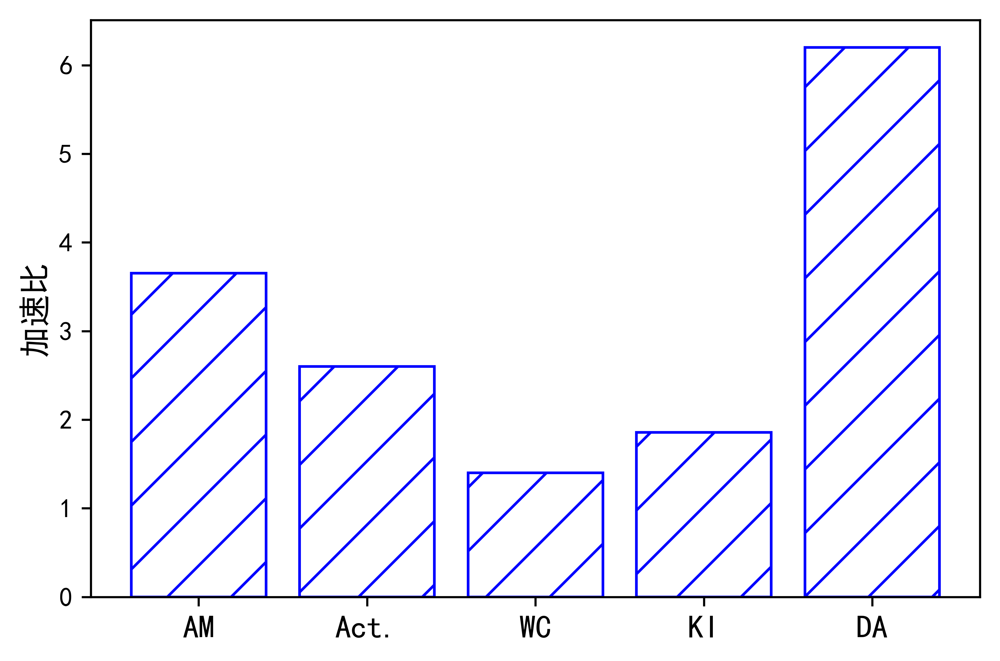

In [99]:
# plt.figure(figsize=(5,5))
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.bar(graph_scale_paralle['name'],graph_scale_paralle['rato'],hatch='/', color='white', edgecolor='blue')
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.ylabel('加速比',fontsize=12)
plt.savefig('./figure_yan/wing_paralle_insertion.png')
plt.show()

In [100]:
graph_scale_paralle = pd.read_excel('data_yan/paralle_8_10000_removal.xlsx')

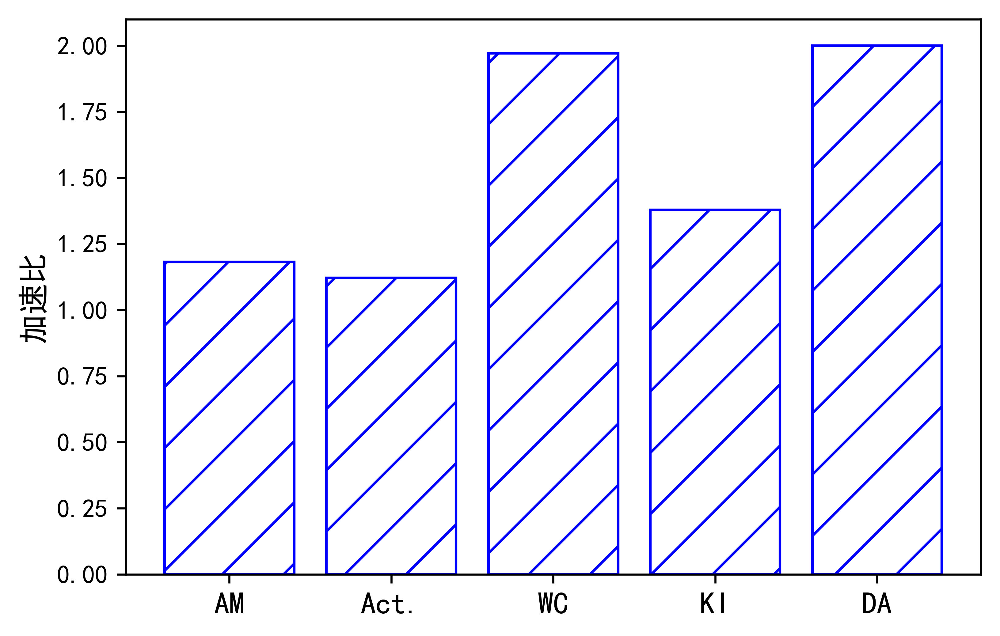

In [102]:
# plt.figure(figsize=(5,5))
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.bar(graph_scale_paralle['name'],graph_scale_paralle['rato'],hatch='/', color='white', edgecolor='blue')
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.ylabel('加速比',fontsize=12)
plt.savefig('./figure_yan/wing_paralle_removal.png')
plt.show()

In [103]:
graph_scale_insertion = pd.read_excel('data_yan/paralle_insertion.xlsx')

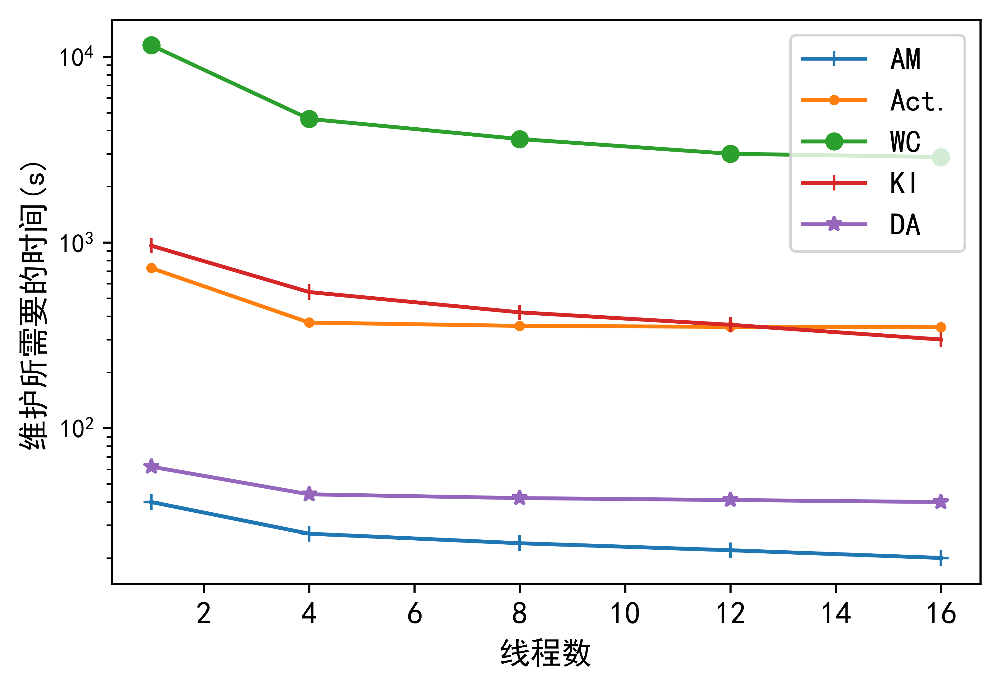

In [104]:
plt.axes(yscale = 'log')
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.plot(graph_scale_insertion['scale'],graph_scale_insertion['AM'],marker='+',label = 'AM')
plt.plot(graph_scale_insertion['scale'],graph_scale_insertion['Act.'],marker='.',label = 'Act.')
plt.plot(graph_scale_insertion['scale'],graph_scale_insertion['WC'],marker='o',label = 'WC')
plt.plot(graph_scale_insertion['scale'],graph_scale_insertion['KI'],marker='|',label = 'KI')
plt.plot(graph_scale_insertion['scale'],graph_scale_insertion['DA'],marker='*',label = 'DA')
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.xlabel('线程数',fontsize=12)
plt.ylabel('维护所需要的时间(s)',fontsize=12)
plt.savefig('./figure_yan/graph_scale_paralle_insertion.png', bbox_inches= 'tight')
plt.show()

In [105]:
graph_scale_removel = pd.read_excel('data_yan/paralle_removel.xlsx')

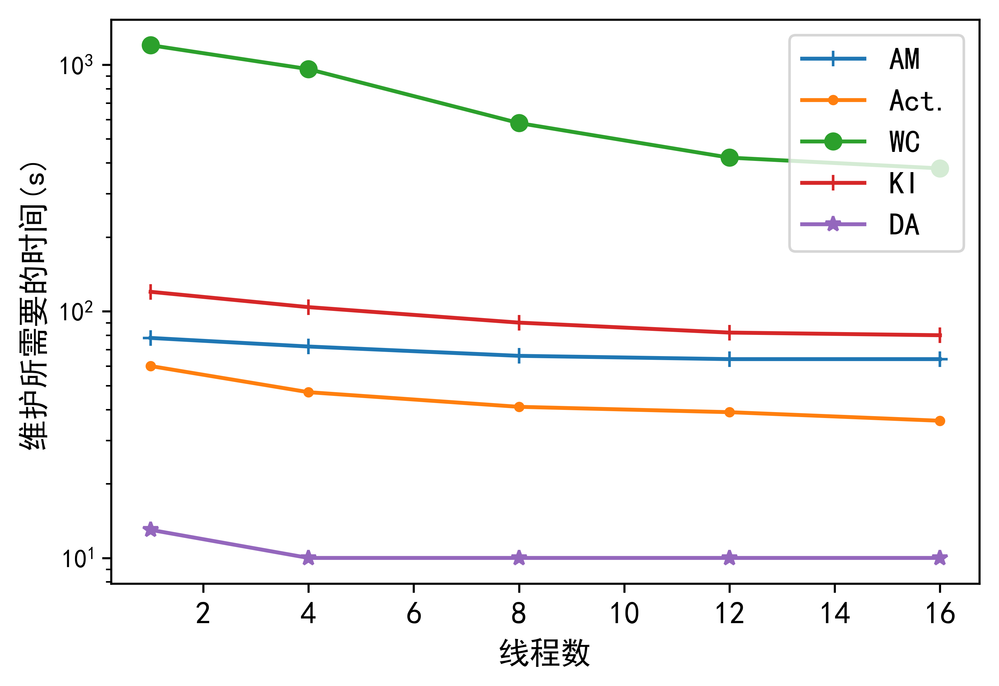

In [106]:
plt.axes(yscale = 'log')
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.plot(graph_scale_removel['scale'],graph_scale_removel['AM'],marker='+',label = 'AM')
plt.plot(graph_scale_removel['scale'],graph_scale_removel['Act.'],marker='.',label = 'Act.')
plt.plot(graph_scale_removel['scale'],graph_scale_removel['WC'],marker='o',label = 'WC')
plt.plot(graph_scale_removel['scale'],graph_scale_removel['KI'],marker='|',label = 'KI')
plt.plot(graph_scale_removel['scale'],graph_scale_removel['DA'],marker='*',label = 'DA')
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.xlabel('线程数',fontsize=12)
plt.ylabel('维护所需要的时间(s)',fontsize=12)
plt.savefig('./figure_yan/graph_scale_paralle_removel.png', bbox_inches= 'tight')
plt.show()

In [107]:
influence_rectangle = pd.read_excel('data_yan/influence_rectangle.xlsx')

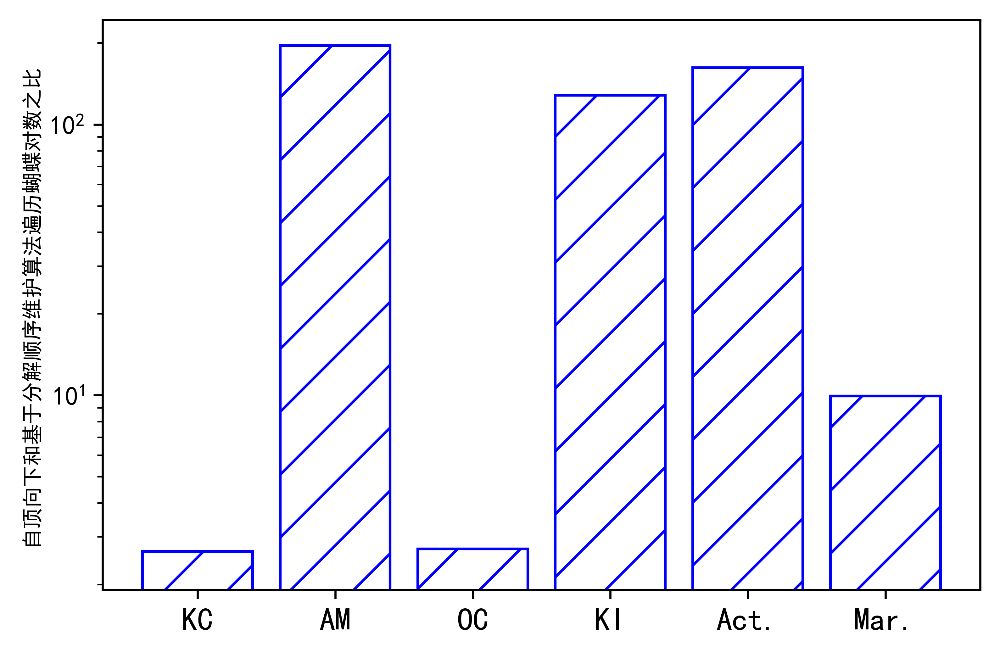

In [140]:
plt.axes(yscale = 'log')
# plt.figure(figsize=(5,5))
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.bar(influence_rectangle['index'],influence_rectangle['ratio'],hatch='/', color='white', edgecolor='blue')
#plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.ylabel('自顶向下和基于分解顺序维护算法遍历蝴蝶对数之比',fontsize=8)
plt.savefig('./figure_yan/influence_rectangle.png')
plt.show()

TOP_DOWN

In [6]:
top_down_insertion = pd.read_excel('data_yan/top_down_insertion.xlsx')

C:\Users\21133\Anaconda3\lib\site-packages\matplotlib\mathtext.py:849: MathTextWarning: Font 'default' does not have a glyph for '-' [U+2212]
  MathTextWarning)
C:\Users\21133\Anaconda3\lib\site-packages\matplotlib\mathtext.py:850: MathTextWarning: Substituting with a dummy symbol.
  warn("Substituting with a dummy symbol.", MathTextWarning)


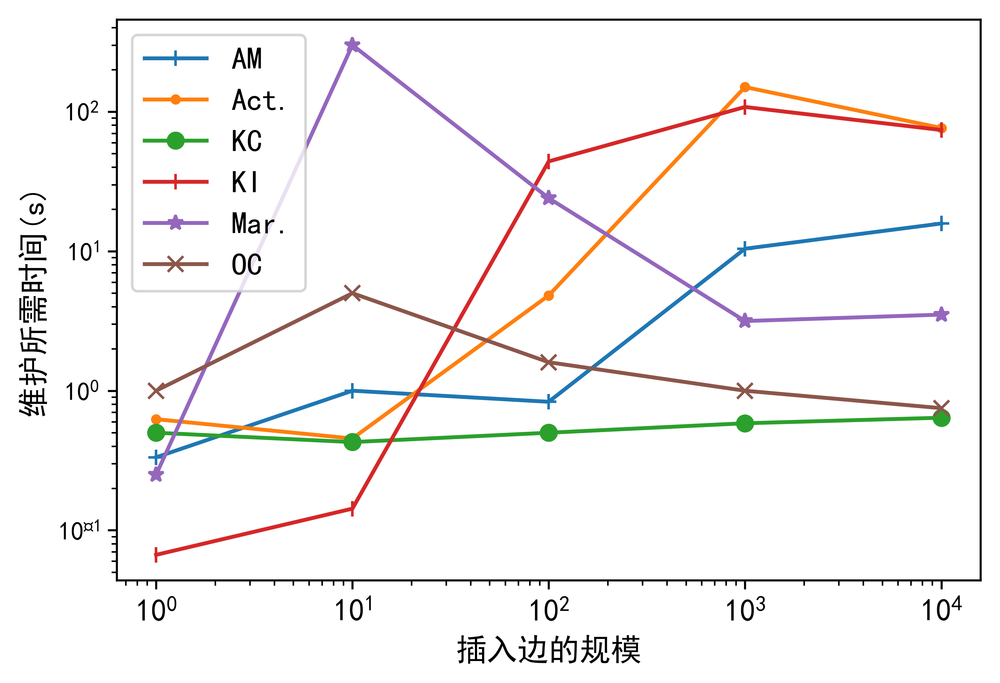

In [7]:
plt.axes(xscale ='log', yscale = 'log')
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.plot(top_down_insertion['scale'],top_down_insertion['AM'],marker='+',label = 'AM')
plt.plot(top_down_insertion['scale'],top_down_insertion['Act.'],marker='.',label = 'Act.')
plt.plot(top_down_insertion['scale'],top_down_insertion['KC'],marker='o',label = 'KC')
plt.plot(top_down_insertion['scale'],top_down_insertion['KI'],marker='|',label = 'KI')
plt.plot(top_down_insertion['scale'],top_down_insertion['Mar.'],marker='*',label = 'Mar.')
plt.plot(top_down_insertion['scale'],top_down_insertion['OC'],marker='x',label = 'OC')
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.xlabel('插入边的规模',fontsize=12)
plt.ylabel('维护所需时间(s)',fontsize=12)
plt.savefig('./figure_yan/top_down_insertion.png', bbox_inches= 'tight')
plt.show()

In [114]:
top_down_removel = pd.read_excel('data_yan/top_down_removel.xlsx')

C:\Users\21133\Anaconda3\lib\site-packages\matplotlib\mathtext.py:849: MathTextWarning: Font 'default' does not have a glyph for '-' [U+2212]
  MathTextWarning)
C:\Users\21133\Anaconda3\lib\site-packages\matplotlib\mathtext.py:850: MathTextWarning: Substituting with a dummy symbol.
  warn("Substituting with a dummy symbol.", MathTextWarning)


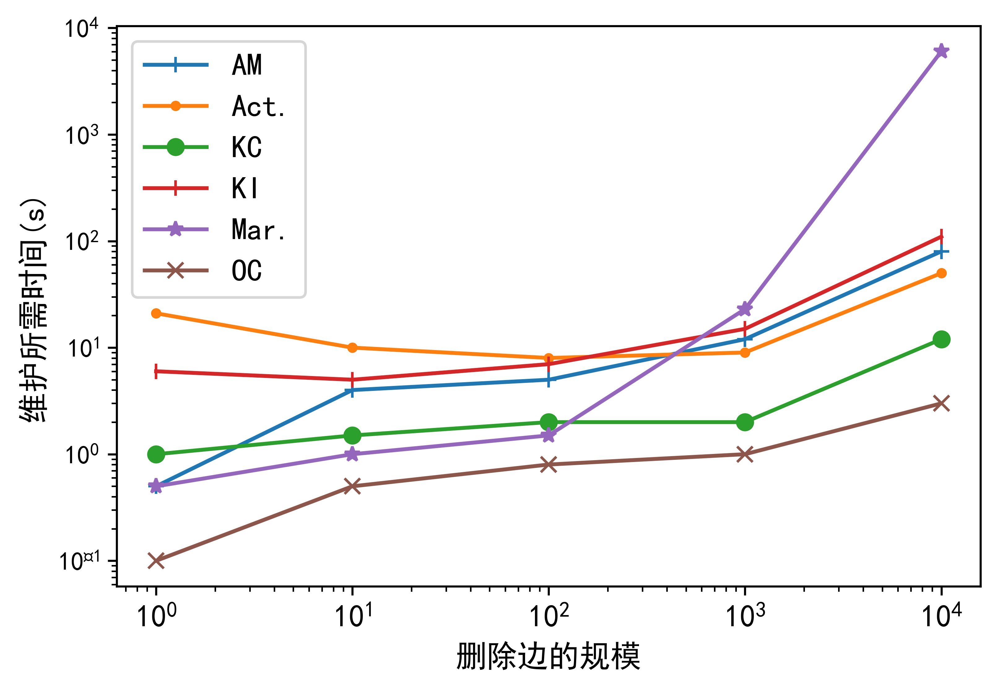

In [115]:
plt.axes(xscale ='log', yscale = 'log')
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.plot(top_down_removel['scale'],top_down_removel['AM'],marker='+',label = 'AM')
plt.plot(top_down_removel['scale'],top_down_removel['Act.'],marker='.',label = 'Act.')
plt.plot(top_down_removel['scale'],top_down_removel['KC'],marker='o',label = 'KC')
plt.plot(top_down_removel['scale'],top_down_removel['KI'],marker='|',label = 'KI')
plt.plot(top_down_removel['scale'],top_down_removel['Mar.'],marker='*',label = 'Mar.')
plt.plot(top_down_removel['scale'],top_down_removel['OC'],marker='x',label = 'OC')
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.xlabel('删除边的规模',fontsize=12)
plt.ylabel('维护所需时间(s)',fontsize=12)
plt.savefig('./figure_yan/top_down_removel.png', bbox_inches= 'tight')
plt.show()

In [116]:
thread_compare_top_down = pd.read_excel('data_yan/thread_compare_top_down.xlsx')

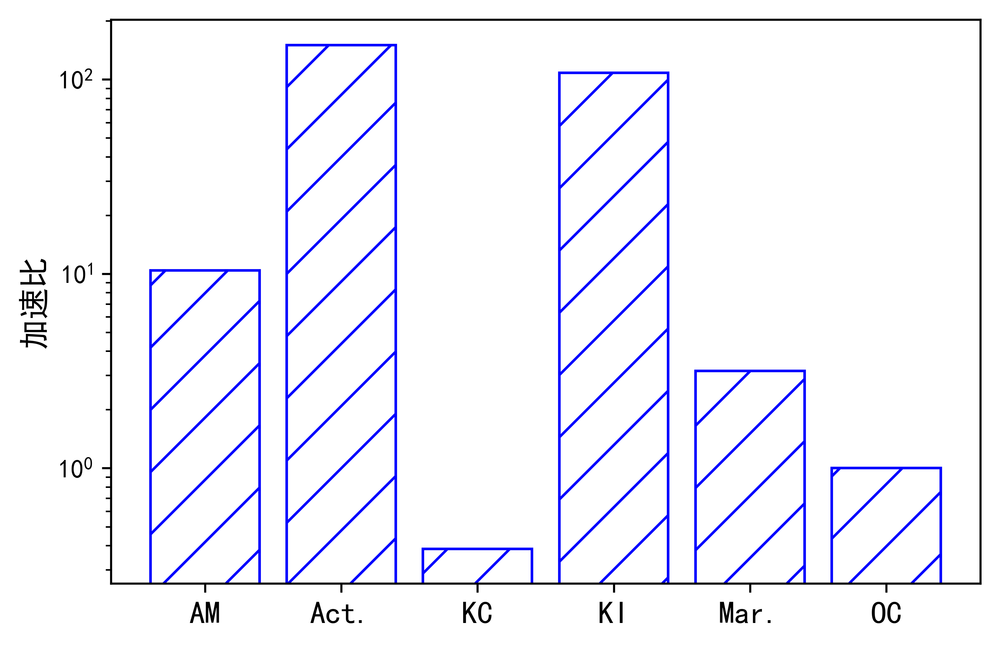

In [117]:
plt.axes(yscale = 'log')
# plt.figure(figsize=(5,5))
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.bar(thread_compare_top_down['name'],thread_compare_top_down['ratio'],hatch='/', color='white', edgecolor='blue')
#plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.ylabel('加速比',fontsize=12)
plt.savefig('./figure_yan/thread_compare_top_down.png')
plt.show()

In [118]:
thread_compare_order = pd.read_excel('data_yan/thread_compare_order.xlsx')

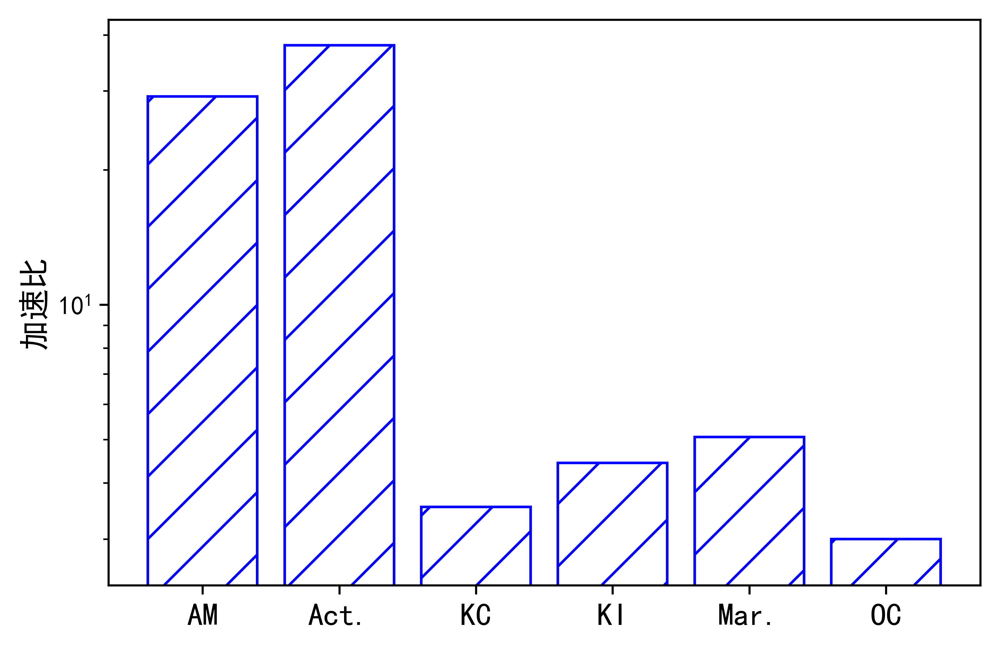

In [119]:
plt.axes(yscale = 'log')
# plt.figure(figsize=(5,5))
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.bar(thread_compare_order['name'],thread_compare_order['ratio'],hatch='/', color='white', edgecolor='blue')
#plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.ylabel('加速比',fontsize=12)
plt.savefig('./figure_yan/thread_compare_order.png')
plt.show()

In [120]:
thread_compare_top_down_removel = pd.read_excel('data_yan/thread_compare_top_down_removel.xlsx')

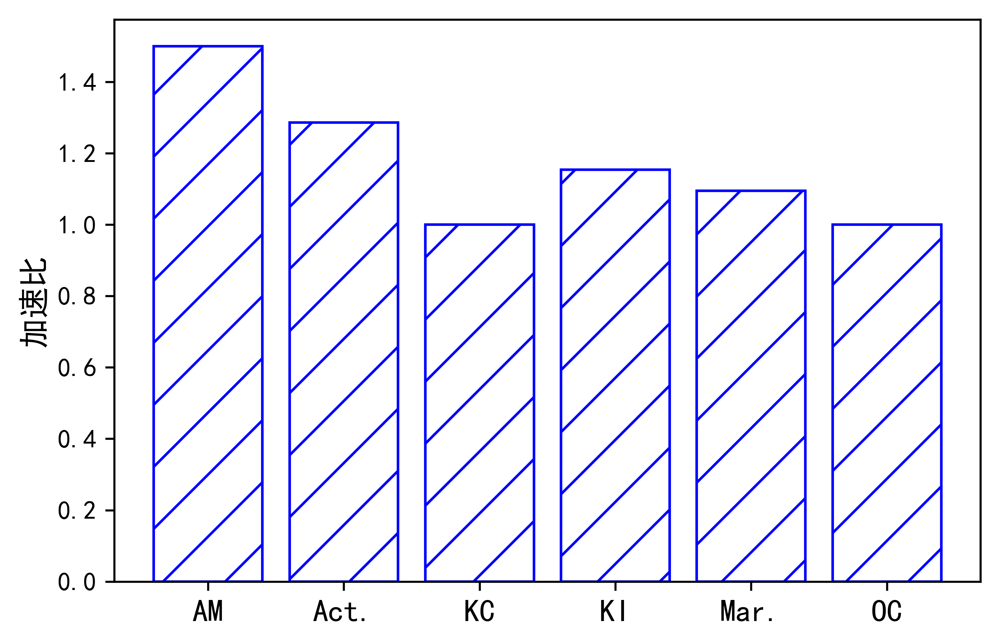

In [123]:
#plt.axes(yscale = 'log')
# plt.figure(figsize=(5,5))
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.bar(thread_compare_top_down_removel['name'],thread_compare_top_down_removel['ratio'],hatch='/', color='white', edgecolor='blue')
#plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.ylabel('加速比',fontsize=12)
plt.savefig('./figure_yan/thread_compare_top_down_removel.png')
plt.show()

In [124]:
thread_compare_order_removel = pd.read_excel('data_yan/thread_compare_order_removel.xlsx')

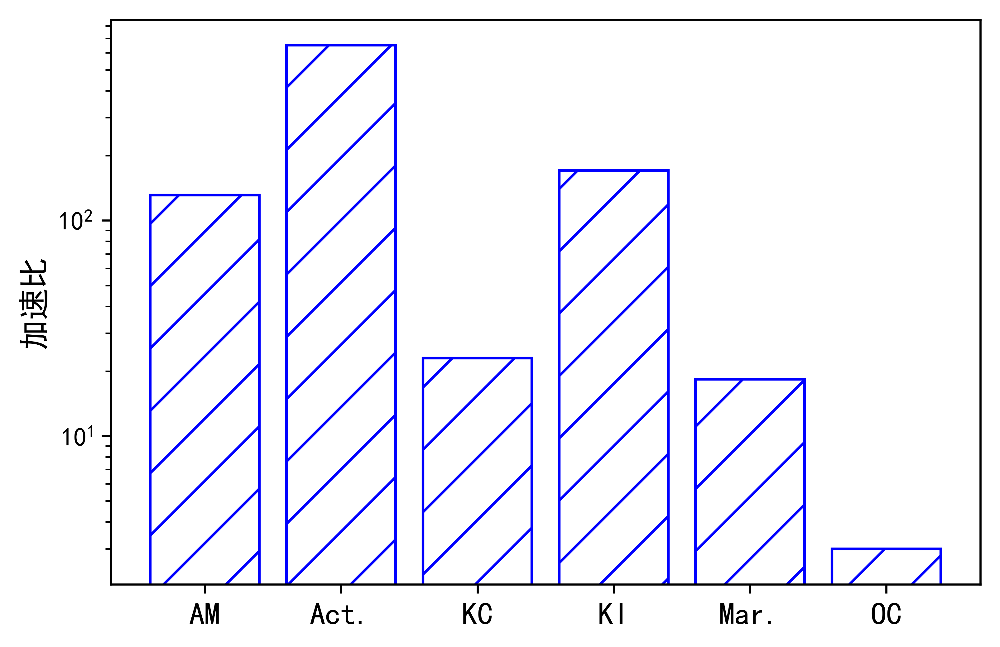

In [125]:
plt.axes(yscale = 'log')
# plt.figure(figsize=(5,5))
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.bar(thread_compare_order_removel['name'],thread_compare_order_removel['ratio'],hatch='/', color='white', edgecolor='blue')
#plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.ylabel('加速比',fontsize=12)
plt.savefig('./figure_yan/thread_compare_order_removel.png')
plt.show()

In [4]:
thread_top_down_order = pd.read_excel('data_yan/thread_top_down_order.xlsx')

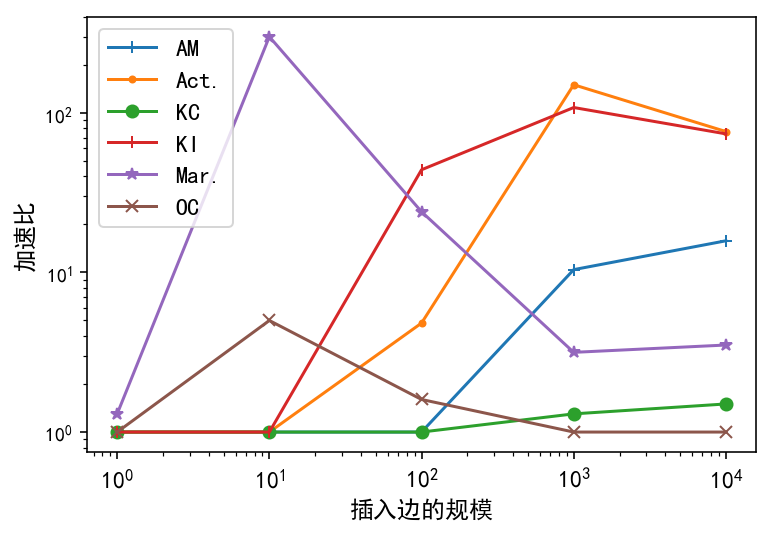

In [5]:
plt.axes(xscale ='log', yscale = 'log')
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.plot(thread_top_down_order['scale'],thread_top_down_order['AM'],marker='+',label = 'AM')
plt.plot(thread_top_down_order['scale'],thread_top_down_order['Act.'],marker='.',label = 'Act.')
plt.plot(thread_top_down_order['scale'],thread_top_down_order['KC'],marker='o',label = 'KC')
plt.plot(thread_top_down_order['scale'],thread_top_down_order['KI'],marker='|',label = 'KI')
plt.plot(thread_top_down_order['scale'],thread_top_down_order['Mar.'],marker='*',label = 'Mar.')
plt.plot(thread_top_down_order['scale'],thread_top_down_order['OC'],marker='x',label = 'OC')
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.xlabel('插入边的规模',fontsize=12)
plt.ylabel('加速比',fontsize=12)
plt.savefig('./figure_yan/thread_top_down_order.png', bbox_inches= 'tight')
plt.show()

In [128]:
thread_top_down_order_removel = pd.read_excel('data_yan/thread_top_down_order_removel.xlsx')

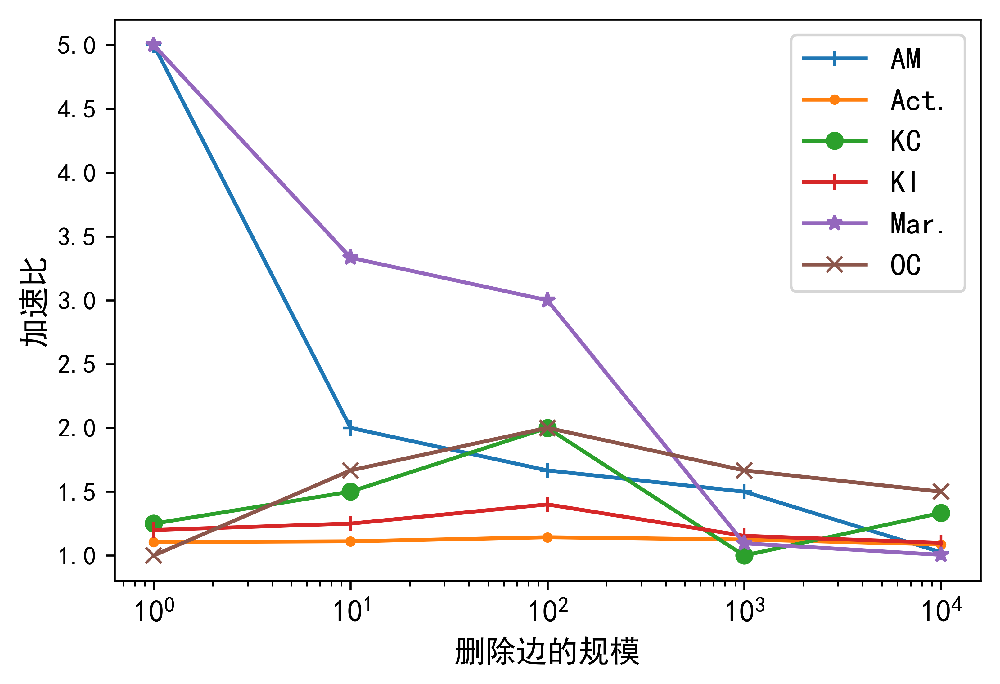

In [129]:
plt.axes(xscale ='log')
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.plot(thread_top_down_order_removel['scale'],thread_top_down_order_removel['AM'],marker='+',label = 'AM')
plt.plot(thread_top_down_order_removel['scale'],thread_top_down_order_removel['Act.'],marker='.',label = 'Act.')
plt.plot(thread_top_down_order_removel['scale'],thread_top_down_order_removel['KC'],marker='o',label = 'KC')
plt.plot(thread_top_down_order_removel['scale'],thread_top_down_order_removel['KI'],marker='|',label = 'KI')
plt.plot(thread_top_down_order_removel['scale'],thread_top_down_order_removel['Mar.'],marker='*',label = 'Mar.')
plt.plot(thread_top_down_order_removel['scale'],thread_top_down_order_removel['OC'],marker='x',label = 'OC')
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.xlabel('删除边的规模',fontsize=12)
plt.ylabel('加速比',fontsize=12)
plt.savefig('./figure_yan/thread_top_down_order_removel.png', bbox_inches= 'tight')
plt.show()

In [130]:
thread_graph_memeory = pd.read_excel('data_yan/memeory.xlsx')

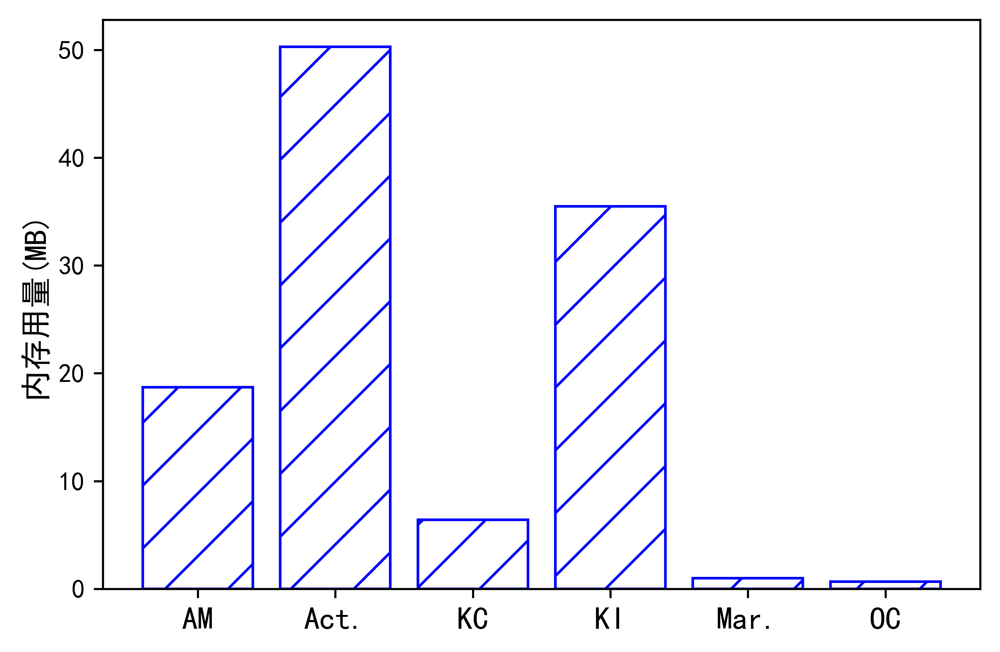

In [131]:
#plt.axes(yscale = 'log')
# plt.figure(figsize=(5,5))
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.bar(thread_graph_memeory['name'],thread_graph_memeory['scale'],hatch='/', color='white', edgecolor='blue')
#plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.ylabel('内存用量(MB)',fontsize=12)
plt.savefig('./figure_yan/thread_graph_memeory.png')
plt.show()

In [132]:
thread_graph_wing = pd.read_excel('data_yan/thread_wing.xlsx')

In [69]:
thread_graph_wing

,name,scale
0,AM,224
1,Act.,477
2,KC,104
3,KI,512
4,Mar.,1761
5,OC,63


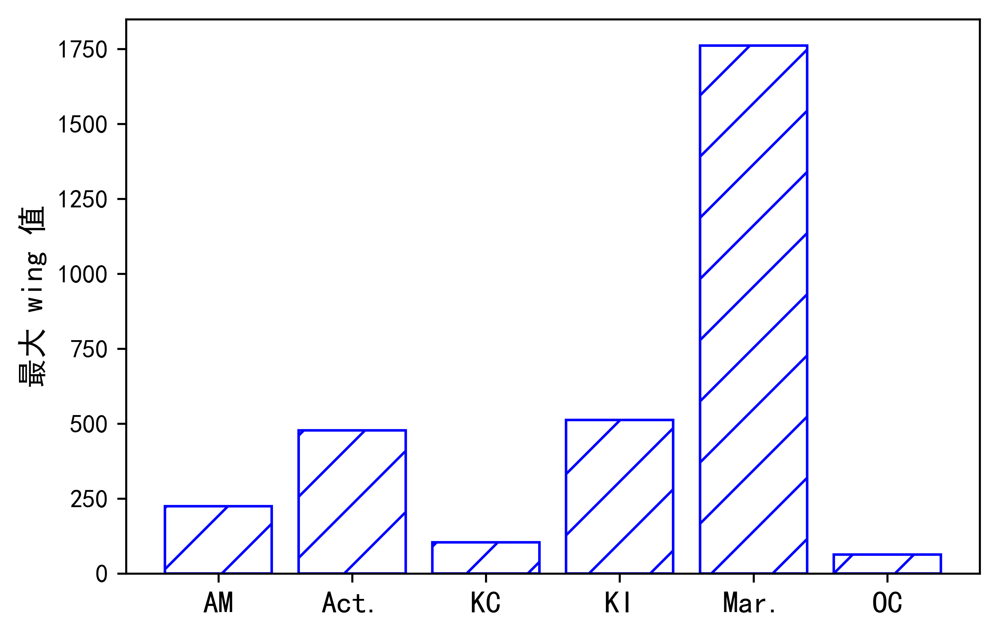

In [133]:
#plt.axes(yscale = 'log')
# plt.figure(figsize=(5,5))
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.bar(thread_graph_wing['name'],thread_graph_wing['scale'],hatch='/', color='white', edgecolor='blue')
#plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.ylabel('最大 wing 值',fontsize=12)
plt.savefig('./figure_yan/thread_graph_wing.png')
plt.show()

In [134]:
thread_Dec = pd.read_excel('data_yan/Dec.xlsx')

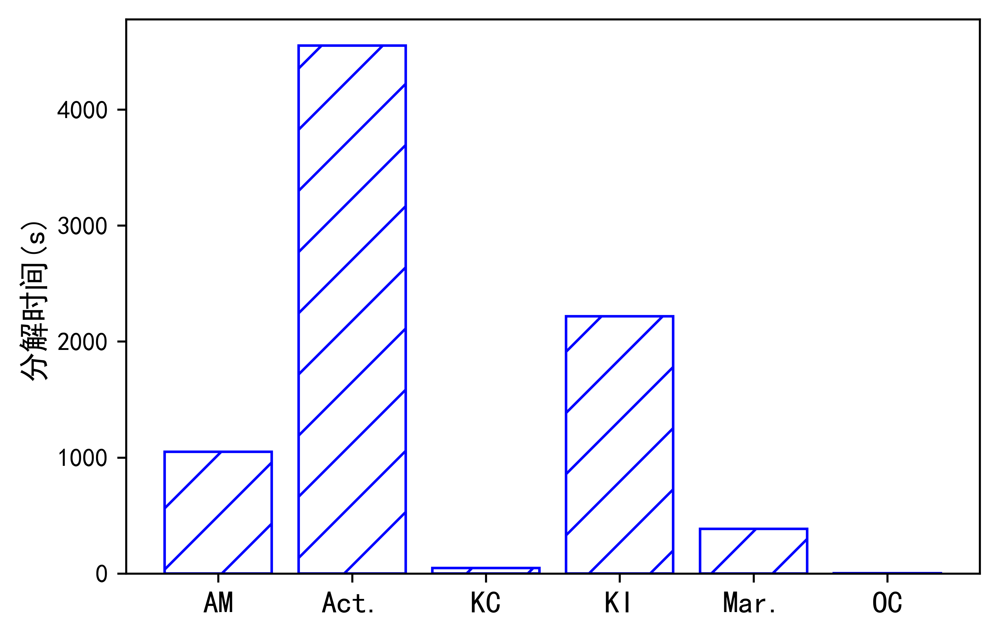

In [135]:
#plt.axes(yscale = 'log')
# plt.figure(figsize=(5,5))
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.bar(thread_Dec['name'],thread_Dec['time'],hatch='/', color='white', edgecolor='blue')
#plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.ylabel('分解时间(s)',fontsize=12)
plt.savefig('./figure_yan/dec_time.png')
plt.show()

In [136]:
paralle_memory = pd.read_excel('data_yan/paralle_memory.xlsx')

In [79]:
paralle_memory

,name,scale
0,AM,19.6
1,Act.,52.8
2,KI,37.4
3,DA,35.7
4,WC,27.3


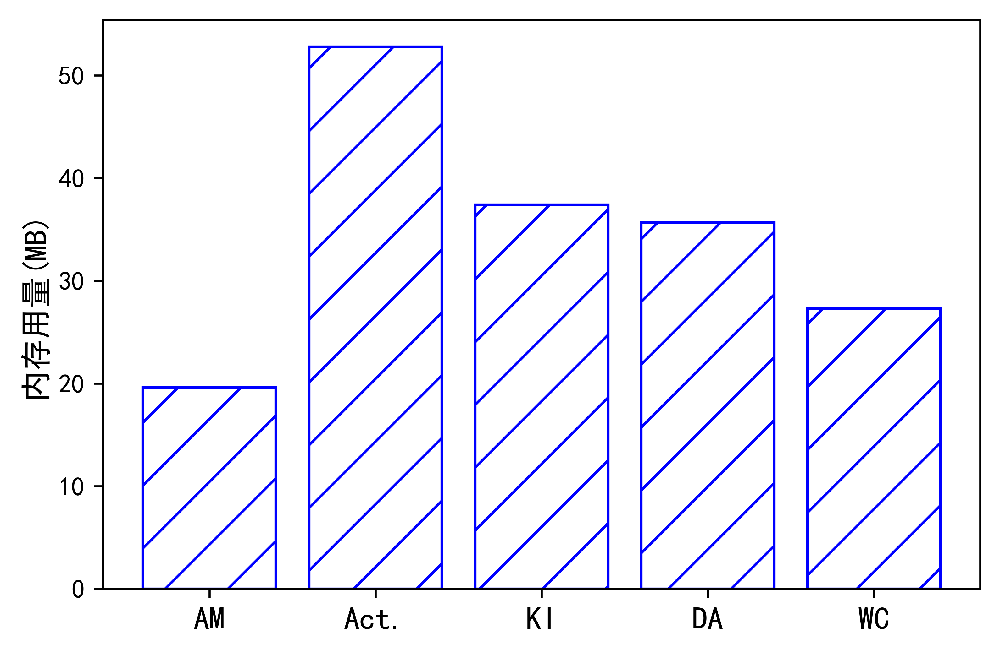

In [137]:
#plt.axes(yscale = 'log')
# plt.figure(figsize=(5,5))
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.bar(paralle_memory['name'],paralle_memory['scale'],hatch='/', color='white', edgecolor='blue')
#plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.ylabel('内存用量(MB)',fontsize=12)
plt.savefig('./figure_yan/memory_paralle.png')
plt.show()

In [138]:
paralle_wing = pd.read_excel('data_yan/paralle_wing.xlsx')

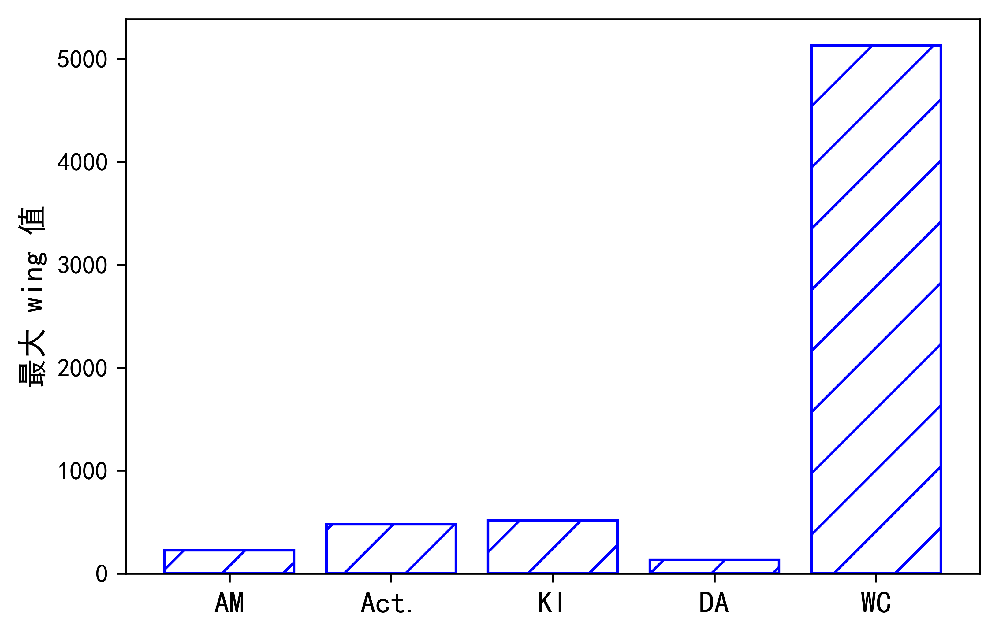

In [139]:
#plt.axes(yscale = 'log')
# plt.figure(figsize=(5,5))
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.bar(paralle_wing['name'],paralle_wing['scale'],hatch='/', color='white', edgecolor='blue')
#plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=10)
plt.ylabel('最大 wing 值',fontsize=12)
plt.savefig('./figure_yan/paralle_wing.png')
plt.show()

In [72]:
count = len(hoard_time)
hoard_time = np.sort(hoard_time)
hoard_cdf = [[],[]]
i = 1
for date in hoard_time:
    hoard_cdf[0].append(date)
    hoard_cdf[1].append(i/float(count))
    i = i + 1

In [73]:
print(hoard_time)

[ 31568848  31575996  31577534 ... 314802257 314802336 315265496]


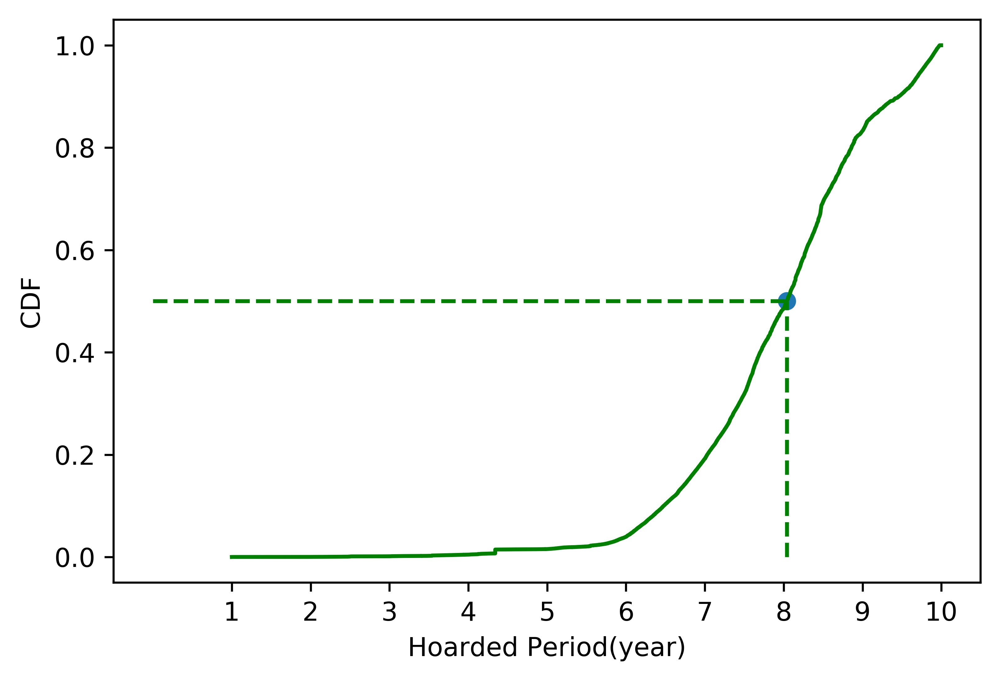

In [107]:
plt.xticks(year_list,[1,2,3,4,5,6,7,8,9,10])
x_temp = hoard_cdf[0][int(len(hoard_cdf[0])/2)]
y_temp = hoard_cdf[1][int(len(hoard_cdf[0])/2)]
plt.plot([x_temp,x_temp], [0,0.5], 'g--')
plt.plot([0,x_temp], [0.5,0.5], 'g--')
plt.scatter(x_temp, 0.5)
#plt.plot(x_axix,miner,color = 'black',label = 'active miner')
plt.plot(hoard_cdf[0],hoard_cdf[1],color = 'green',label = '2-active miner')
#plt.title('the duration of active miner')
plt.xlabel('Hoarded Period(year)')
plt.ylabel('CDF')
plt.savefig('./figure/miner_hoard_year.jpg', bbox_inches= 'tight')
plt.show()

In [109]:
def get_mining_cdf(dataset,num):
    temp = mining_interval[mining_interval['mining_degree'] > num-1]
    count = len(temp['interval'])
    i = 1
    for date in temp['interval']:
        dataset[0].append(date)
        dataset[1].append(i/float(count))
        i = i + 1

In [115]:
def get_mining_duration_cdf(dataset,num):
    temp = mining_duration[mining_duration['mining_degree'] > num-1]
    count = len(temp['mining_duration'])
    i = 1
    for date in temp['mining_duration']:
        dataset[0].append(date/86400)
        dataset[1].append(i/float(count))
        i = i + 1

In [116]:
def get_cdf(dataset,num):
    temp = degree_duration[degree_duration['mining_degree'] > num-1]
    count = len(temp['duration'])
    i = 1
    for date in temp['duration']:
        dataset[0].append(date/86400)
        dataset[1].append(i/float(count))
        i = i + 1

In [112]:
dataset_2 = [[],[]]
dataset_5 = [[],[]]
dataset_10 = [[],[]]
dataset_20 = [[],[]]
dataset_50 = [[],[]]
get_cdf(dataset_2, 2)
get_cdf(dataset_5, 5)
get_cdf(dataset_10, 10)
get_cdf(dataset_20, 20)
get_cdf(dataset_50, 50)
print(max(dataset_50[0]))

NameError: name 'degree_duration' is not defined

In [117]:
dataset_mining_1 = [[],[]]
dataset_mining_2 = [[],[]]
dataset_mining_5 = [[],[]]
dataset_mining_10 = [[],[]]
dataset_mining_20 = [[],[]]
dataset_mining_50 = [[],[]]
get_mining_cdf(dataset_mining_1, 1)
get_mining_cdf(dataset_mining_2, 2)
get_mining_cdf(dataset_mining_5, 5)
get_mining_cdf(dataset_mining_10, 10)
get_mining_cdf(dataset_mining_20, 20)
get_mining_cdf(dataset_mining_50, 50)
print(max(dataset_mining_50[0]))

660605.0714285715


In [118]:
dataset_mining_duration_1 = [[],[]]
dataset_mining_duration_2 = [[],[]]
dataset_mining_duration_5 = [[],[]]
dataset_mining_duration_10 = [[],[]]
dataset_mining_duration_20 = [[],[]]
dataset_mining_duration_50 = [[],[]]
get_mining_duration_cdf(dataset_mining_duration_1, 1)
get_mining_duration_cdf(dataset_mining_duration_2, 2)
get_mining_duration_cdf(dataset_mining_duration_5, 5)
get_mining_duration_cdf(dataset_mining_duration_10, 10)
get_mining_duration_cdf(dataset_mining_duration_20, 20)
get_mining_duration_cdf(dataset_mining_duration_50, 50)
print(max(dataset_mining_duration_50[0]))

2240.733888888889


In [88]:
date1 = time.strptime('2009--01--01 00:00:01', "%Y--%m--%d %H:%M:%S")
date2 = time.strptime('2010--01--01 00:00:01', "%Y--%m--%d %H:%M:%S")
date1=datetime.datetime(date1[0],date1[1],date1[2],date1[3],date1[4],date1[5]) 
date2=datetime.datetime(date2[0],date2[1],date2[2],date2[3],date2[4],date2[5]) 
one_year = int((date2 - date1).total_seconds()) 
year_list = []
for i in range(1,11):
    year_list.append(one_year*i)

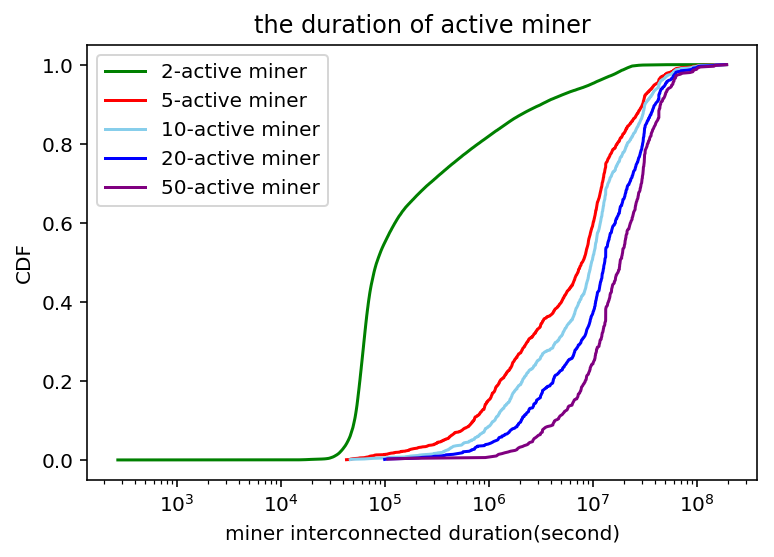

In [118]:
plt.axes(xscale ='log')
#plt.plot(x_axix,miner,color = 'black',label = 'active miner')
plt.plot(dataset_2[0],dataset_2[1],color = 'green',label = '2-active miner')
#plt.scatter(x_axix,miner_2,color = 'green')
plt.plot(dataset_5[0],dataset_5[1],color = 'red',label = '5-active miner')
#plt.scatter(x_axix,miner_5,color = 'red')
plt.plot(dataset_10[0],dataset_10[1],color = 'skyblue',label = '10-active miner')
#plt.scatter(x_axix,miner_10,color = 'skyblue')
plt.plot(dataset_20[0],dataset_20[1],color = 'blue',label = '20-active miner')
#plt.scatter(x_axix,miner_20,color = 'blue')
plt.plot(dataset_50[0],dataset_50[1],color = 'purple',label = '50-active miner')
#plt.scatter(x_axix,miner_50,color = 'purple')
plt.legend()
#plt.xticks(x_axix,[0,1,2,3,4,5,6,7])
plt.title('the duration of active miner')
plt.xlabel('miner interconnected duration(second)')
plt.ylabel('CDF')
plt.savefig('./figure/miner_duration.jpg', bbox_inches= 'tight')
plt.show()

In [ ]:
从图中可以看出活跃度越高的矿工，矿工的活跃时间普遍都比较高。而且从图中可以看出，大部分矿工的活跃期比较短。

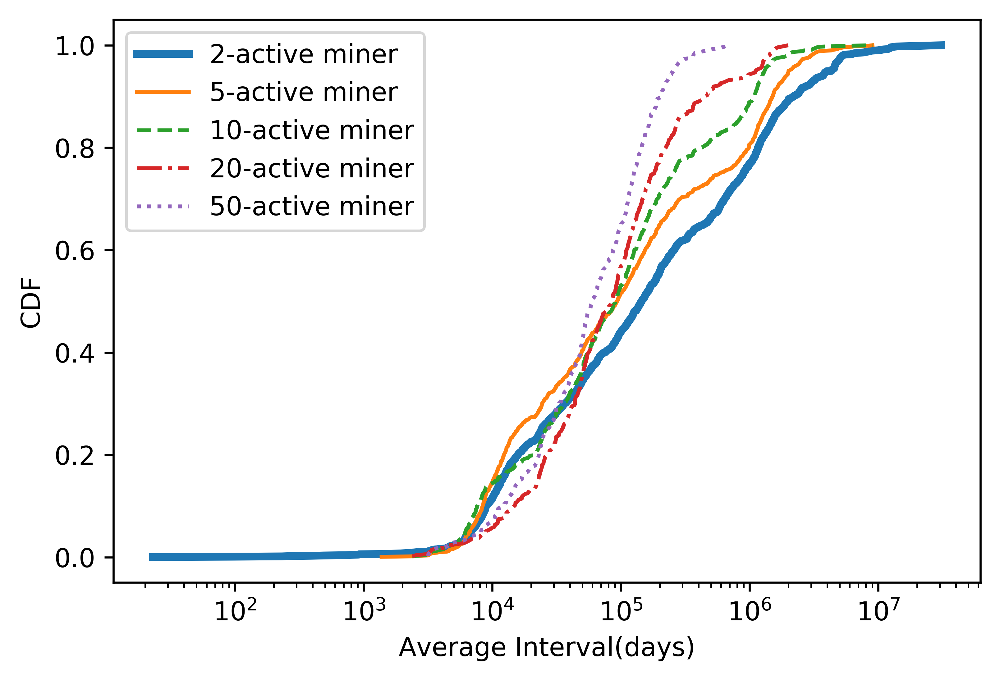

In [119]:
plt.axes(xscale ='log')
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
#plt.plot(x_axix,miner,color = 'black',label = 'active miner')
plt.plot(dataset_mining_2[0],dataset_mining_2[1],linestyle = '-',linewidth=3,label = '2-active miner')
#plt.scatter(x_axix,miner_2,color = 'green')
plt.plot(dataset_mining_5[0],dataset_mining_5[1],linestyle = '-',label = '5-active miner')
#plt.scatter(x_axix,miner_5,color = 'red')
plt.plot(dataset_mining_10[0],dataset_mining_10[1],linestyle = '--',label = '10-active miner')
#plt.scatter(x_axix,miner_10,color = 'skyblue')
plt.plot(dataset_mining_20[0],dataset_mining_20[1],linestyle = '-.',label = '20-active miner')
#plt.scatter(x_axix,miner_20,color = 'blue')
plt.plot(dataset_mining_50[0],dataset_mining_50[1],linestyle = ':',label = '50-active miner')
#plt.scatter(x_axix,miner_50,color = 'purple')
plt.legend()
#plt.title('the average interval of active miner')
plt.xlabel('Average Interval(days)')
plt.ylabel('CDF')
plt.savefig('./figure/miner_interval_no_color.png', bbox_inches= 'tight')
plt.show()

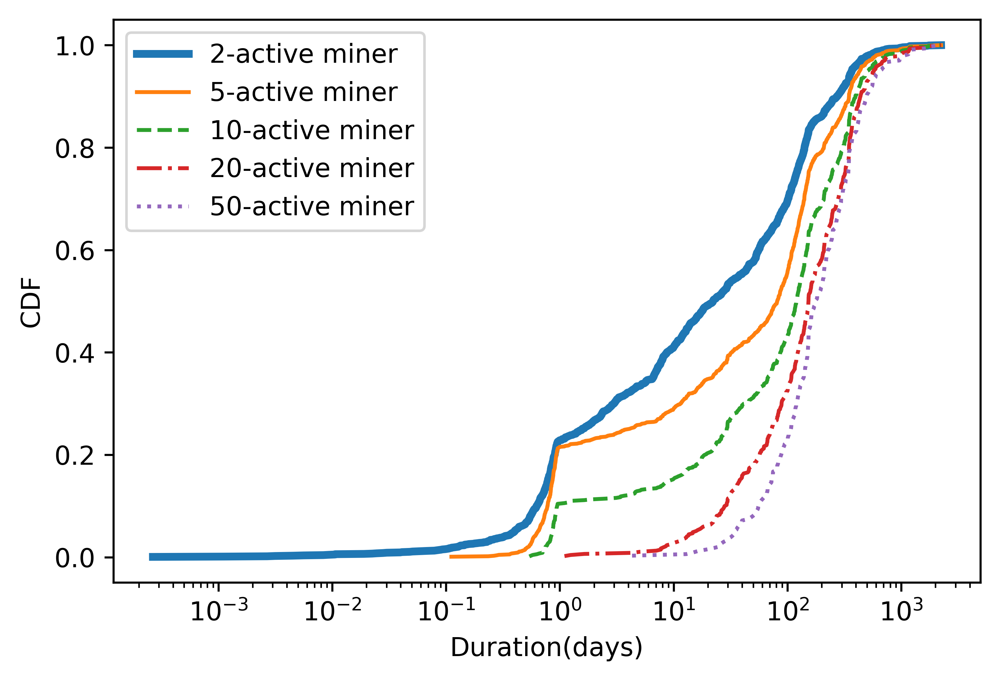

In [120]:
plt.axes(xscale ='log')
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
#plt.plot(x_axix,miner,color = 'black',label = 'active miner')
plt.plot(dataset_mining_duration_2[0],dataset_mining_duration_2[1],linestyle = '-',linewidth=3,label = '2-active miner')
#plt.scatter(x_axix,miner_2,color = 'green')
plt.plot(dataset_mining_duration_5[0],dataset_mining_duration_5[1],linestyle = '-',label = '5-active miner')
#plt.scatter(x_axix,miner_5,color = 'red')
plt.plot(dataset_mining_duration_10[0],dataset_mining_duration_10[1],linestyle = '--',label = '10-active miner')
#plt.scatter(x_axix,miner_10,color = 'skyblue')
plt.plot(dataset_mining_duration_20[0],dataset_mining_duration_20[1],linestyle = '-.',label = '20-active miner')
#plt.scatter(x_axix,miner_20,color = 'blue')
plt.plot(dataset_mining_duration_50[0],dataset_mining_duration_50[1],linestyle = ':',label = '50-active miner')
#plt.scatter(x_axix,miner_50,color = 'purple')
plt.legend()
#plt.title('the mining duration of active miner')
plt.xlabel('Duration(days)')
plt.ylabel('CDF')
plt.savefig('./figure/miner_mining_duration_no_color.png', bbox_inches= 'tight')
plt.show()

从上图可以看出，活跃度越高的矿工，挖矿的平均时间间隔会更小，说明矿工活跃度越高，其挖矿周期越短

下面来看活跃度和入度出度之间的关系，还有就是，是否活跃度越低的矿工出度越有可能小于入度，越有可能囤积货币，越不稳定

In [42]:
miner_info['miner_interconnected'] = miner_info['indegree'] + miner_info['outdegree'] - miner_info['miningdegree']    
miner_info.sort_values("miner_interconnected",inplace=True)

In [43]:
def get_interconnected(dataset,num):
    temp = miner_info[miner_info['miningdegree'] > num-1]
    count = len(temp['miner_interconnected'])
    i = 1
    for date in temp['miner_interconnected']:
        dataset[0].append(date)
        dataset[1].append(i/float(count))
        i = i + 1

In [44]:
dataset_interconnected_2 = [[],[]]
dataset_interconnected_5 = [[],[]]
dataset_interconnected_10 = [[],[]]
dataset_interconnected_20 = [[],[]]
dataset_interconnected_50 = [[],[]]
get_interconnected(dataset_interconnected_2, 2)
get_interconnected(dataset_interconnected_5, 5)
get_interconnected(dataset_interconnected_10, 10)
get_interconnected(dataset_interconnected_20, 20)
get_interconnected(dataset_interconnected_50, 50)

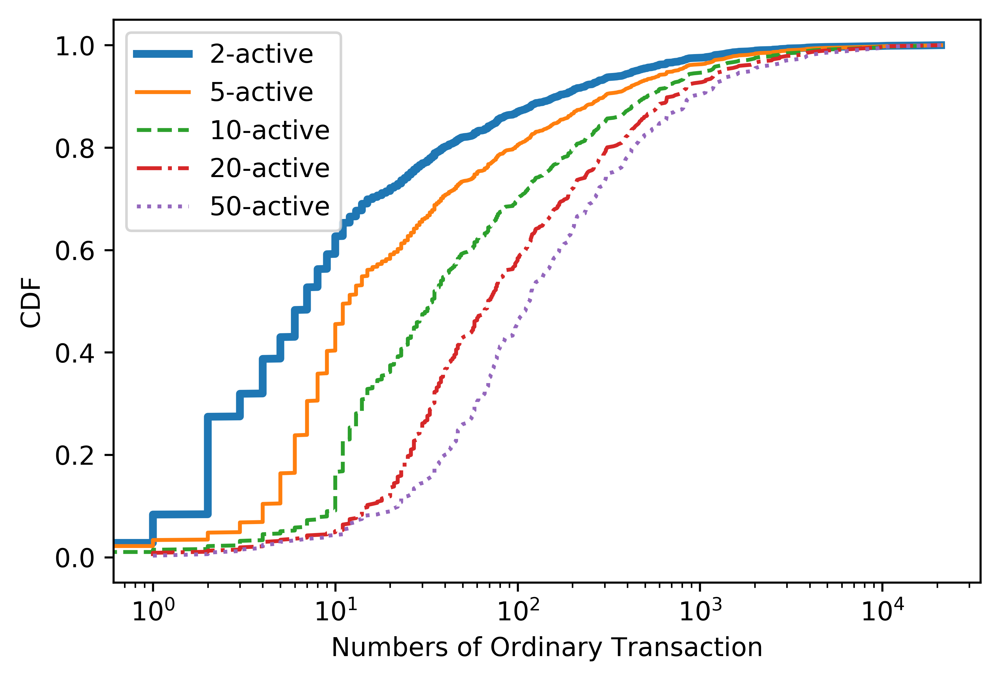

In [46]:
plt.axes(xscale ='log')
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
#plt.plot(x_axix,miner,color = 'black',label = 'active miner')
plt.plot(dataset_interconnected_2[0],dataset_interconnected_2[1],linestyle = '-',linewidth=3,label = '2-active')
#plt.scatter(x_axix,miner_2,color = 'green')
plt.plot(dataset_interconnected_5[0],dataset_interconnected_5[1],linestyle = '-',label = '5-active')
#plt.scatter(x_axix,miner_5,color = 'red')
plt.plot(dataset_interconnected_10[0],dataset_interconnected_10[1],linestyle = '--',label = '10-active')
#plt.scatter(x_axix,miner_10,color = 'skyblue')
plt.plot(dataset_interconnected_20[0],dataset_interconnected_20[1],linestyle = '-.',label = '20-active')
#plt.scatter(x_axix,miner_20,color = 'blue')
plt.plot(dataset_interconnected_50[0],dataset_interconnected_50[1],linestyle = ':',label = '50-active')
#plt.scatter(x_axix,miner_50,color = 'purple')
plt.legend()
#plt.title('The number of normal trades of different types of miners')
plt.xlabel('Numbers of Ordinary Transaction')
plt.ylabel('CDF')
plt.savefig('./figure/miner_contacts_no_color.png', bbox_inches= 'tight')
plt.show()

由上图可知，活跃度高的矿工除了挖矿，和其他用户之间的联系也会明显高于活跃度低的矿工

下面将对不同活跃度矿工的入度和出度模拟曲线

In [9]:
miner_info.sort_values("miningincome",inplace=True,ascending = False)
print(miner_info.head(5))

              id  indegree   income  outdegree      pay  miningdegree  \
190853  13012769     44660  4474724       4142  1400662         39281   
185110   7539888     26474   694359      20757   548914         26204   
191508  15170456     23345   583371      10387   260317         23083   
194249  50662323     16972   356779       3390    71033         16845   
151348   2457518      6486   205146       6214   195943          6446   

        miningincome                                        mining_time  \
190853        872838  1387841650:1374773051:1382172414:1385431950:13...   
185110        673665  1355017599:1355008810:1355007876:1355002534:13...   
191508        579126  1382585589:1382575797:1382570472:1382566002:13...   
194249        340236  1418643404:1418040539:1415706638:1418605056:14...   
151348        205146  1324261864:1323332815:1323091242:1322680842:13...   

                                                  in_time  \
190853  1382506480:1382493768:1382381149:13880285

In [24]:
from scipy import special
def zipf(xyal, a):
    return xyal**(-a) / special.zetac(a)

[1.33047685]
popt: [1.33047685]
系数a: 1.330476845978221
系数pcov: [[1.99039445e+10]]
系数yvals: [0.00707301 0.004124   0.00281249 0.00209004 0.00163985 0.00133578]


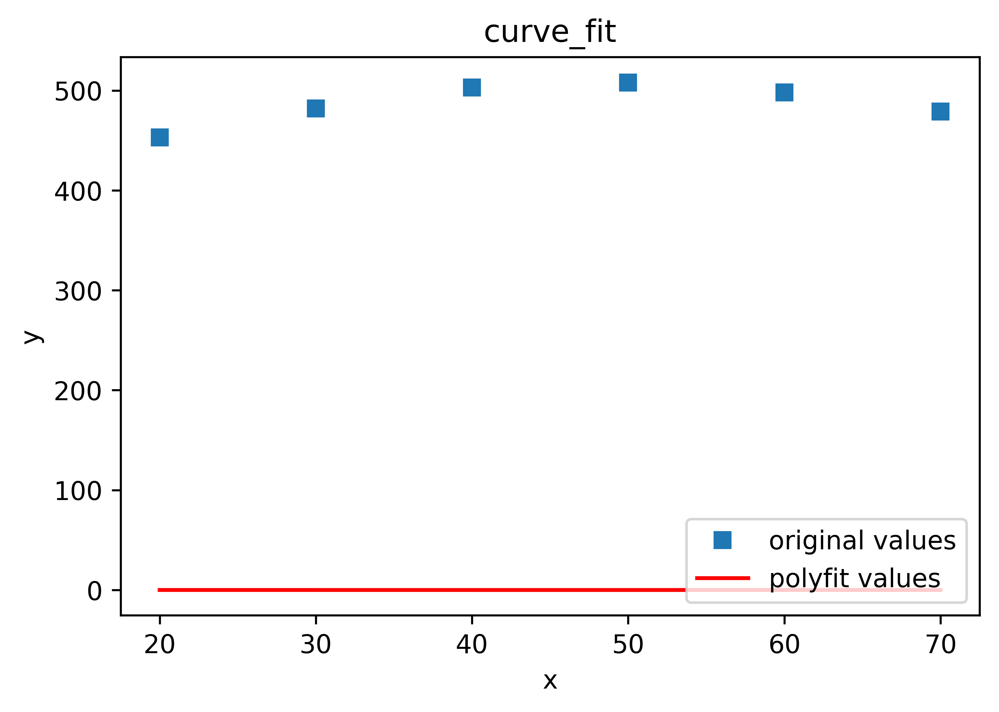

In [23]:
x = [20,30,40,50,60,70]
x = np.array(x)
num = [453,482,503,508,498,479]
y = np.array(num)
 
#非线性最小二乘法拟合
popt, pcov = curve_fit(zipf, x, y)
#获取popt里面是拟合系数
print(popt)
a = popt[0] 
yvals = zipf(x,a) #拟合y值
print('popt:', popt)
print('系数a:', a)
print('系数pcov:', pcov)
print('系数yvals:', yvals)
#绘图
plot1 = plt.plot(x, y, 's',label='original values')
plot2 = plt.plot(x, yvals, 'r',label='polyfit values')
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc=4) #指定legend的位置右下角
plt.title('curve_fit')
plt.show()

C:\Users\21133\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
C:\Users\21133\Anaconda3\lib\site-packages\ipykernel_launcher.py:38: RuntimeWarning: divide by zero encountered in log10
C:\Users\21133\Anaconda3\lib\site-packages\ipykernel_launcher.py:40: RuntimeWarning: divide by zero encountered in log10


1732


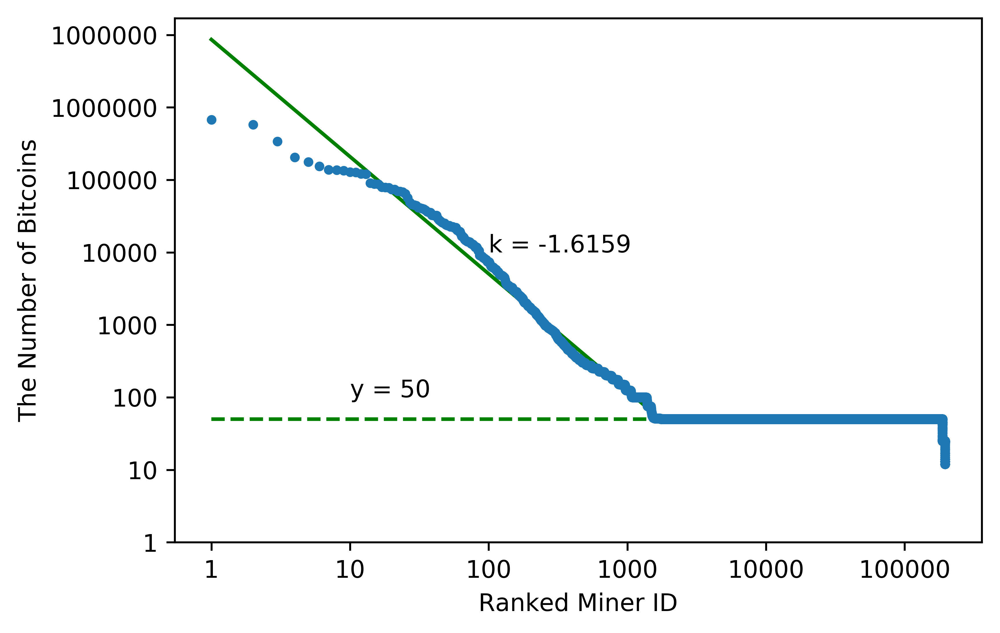

In [158]:
from scipy.optimize import curve_fit
from sklearn import linear_model
from scipy.stats import norm
miner_info_temp = miner_info[miner_info["miningincome"] > 50]
miner_info_temp.sort_values("miningincome",inplace=True,ascending = False)
miner_info.sort_values("miningincome",inplace=True,ascending = False)
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
#plt.axes(xscale ='log', yscale = 'log')
y_50 = []
#np.arange(0,195415,1)
xval = np.arange(1,1733,1)
x=np.log10(xval)  # 对X，Y取双对数
y=np.log10(miner_info_temp['miningincome'])
print(len(y))
X_parameter=[]
Y_parameter=[]
for single_square_feet ,single_price_value in zip(x,y):
    X_parameter.append([float(single_square_feet)])
    Y_parameter.append(float(single_price_value))
    
#print(np.isnan(X_parameter).sum()) 

#print(np.isnan(Y_parameter).sum())

regr = linear_model.LinearRegression()
regr.fit(X_parameter, Y_parameter)

#plt.scatter(X_parameter, Y_parameter,  color='blue')
plt.plot(X_parameter, regr.predict(X_parameter), color='green',linewidth=1.5,label='Power Law')
str_coe = 'Coefficients: '+ str(regr.coef_)
str_int = "Intercept: "+ str(regr.intercept_)
plt.text(2,4,'k = -1.6159')
#plt.text(2,4,str_int)    
    
for i in range(195415):
    y_50.append(50)
plt.plot(np.log10(np.arange(0,195415,1)),np.log10(y_50),color='green', linestyle='dashed')
plt.text(1,2,'y = 50')
plt.plot(np.log10(np.arange(0,195415,1)),np.log10(miner_info['miningincome']),'.')
#popt, pcov = curve_fit(zipf, xval, miner_info_temp['miningincome'],maxfev=500000)
#a = 1000
#yvals = zipf(xval,a)
#print(yvals)
#plot2 = plt.plot(xval, yvals/max(yvals), 'r',label='zipf\'s law')
plt.xlabel('Ranked Miner ID')
plt.ylabel('The Number of Bitcoins')
plt.xticks([0,1,2,3,4,5],['1','10','100','1000','10000','100000'])
plt.yticks([0,1,2,3,4,5,6,7],(['1','10','100','1000','10000','100000','1000000','1000000']))
plt.savefig('./figure/miner_balance.png', bbox_inches= 'tight')
plt.show()

In [ ]:
list_miner_info = [data_miner_info_2009, data_miner_info_2010, data_miner_info_2011, data_miner_info_2012,data_miner_info_2013,data_miner_info_2014,data_miner_info_2015,data_miner_info_2016,data_miner_info_2017]
miner_fee_2 = []
miner_5 = []
miner_10 = []
miner_20 = []
miner_50 = []
miner_1 = []
for list_year in list_miner_info:
    miner_1.append(len(list_year[list_year['miningdegree']>0]))
    miner_2.append(len(list_year[list_year['miningdegree']>1]))
    miner_5.append(len(list_year[list_year['miningdegree']>4]))
    miner_10.append(len(list_year[list_year['miningdegree']>9]))
    miner_20.append(len(list_year[list_year['miningdegree']>19]))
    miner_50.append(len(list_year[list_year['miningdegree']>49]))

In [158]:
list_miner_info = [data_miner_info_2009, data_miner_info_2010, data_miner_info_2011, data_miner_info_2012,data_miner_info_2013,data_miner_info_2014,data_miner_info_2015,data_miner_info_2016,data_miner_info_2017]
miner_2 = []
miner_5 = []
miner_10 = []
miner_20 = []
miner_50 = []
miner_1 = []
for list_year in list_miner_info:
    miner_1.append(len(list_year[list_year['miningdegree']>0]))
    miner_2.append(len(list_year[list_year['miningdegree']>1]))
    miner_5.append(len(list_year[list_year['miningdegree']>4]))
    miner_10.append(len(list_year[list_year['miningdegree']>9]))
    miner_20.append(len(list_year[list_year['miningdegree']>19]))
    miner_50.append(len(list_year[list_year['miningdegree']>49]))


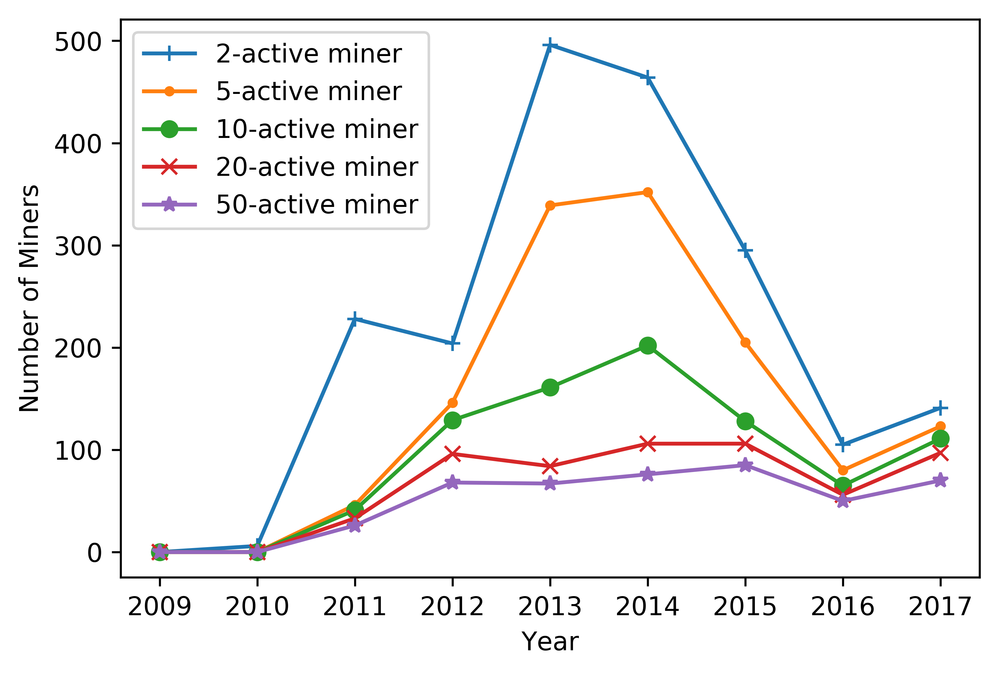

In [186]:
x_axix = [0,1,2,3,4,5,6,7,8]
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
#plt.plot(x_axix,miner,color = 'black',label = 'active miner')
#plt.plot(x_axix,miner_1,marker=',',label = 'active miner')
plt.plot(x_axix,miner_2,marker='+',label = '2-active miner')
#plt.scatter(x_axix,miner_2)
plt.plot(x_axix,miner_5,marker='.',label = '5-active miner')
#plt.scatter(x_axix,miner_5)
plt.plot(x_axix,miner_10,marker='o',label = '10-active miner')
#plt.scatter(x_axix,miner_10)
plt.plot(x_axix,miner_20,marker='x',label = '20-active miner')
#plt.scatter(x_axix,miner_20)
plt.plot(x_axix,miner_50,marker='*',label = '50-active miner')
#plt.scatter(x_axix,miner_50)
plt.legend()
plt.xticks(x_axix,['2009','2010','2011','2012','2013','2014','2015','2016','2017'])
plt.xlabel('Year')
plt.ylabel('Number of Miners')
plt.savefig('./figure/miner_active_no_color.png', bbox_inches= 'tight')
plt.show()

In [ ]:
def miner_duration(num):
    for miner in miner_info:
        

In [ ]:
miner_info_2 = [[],[]]
miner_info_5 = [[],[]]
miner_info_10 = [[],[]]
miner_info_20 = [[],[]]
miner_info_50 = [[],[]]
for miner in miner

In [22]:
data_miner_info_2018 = pd.read_csv('miner_info_2018_3.csv',header = None, names=['id','miningdegree','miningincome','all_degree'])

In [20]:
income_info_2009 = insert_zero(data_miner_info_2009)
income_info_2010 = insert_zero(data_miner_info_2010)
income_info_2011 = insert_zero(data_miner_info_2011)
income_info_2012 = insert_zero(data_miner_info_2012)
income_info_2013 = insert_zero(data_miner_info_2013)
income_info_2014 = insert_zero(data_miner_info_2014)
income_info_2015 = insert_zero(data_miner_info_2015)
income_info_2016 = insert_zero(data_miner_info_2016)
income_info_2017 = insert_zero(data_miner_info_2017)


In [23]:
income_info_2018 = insert_zero(data_miner_info_2018)

In [19]:
def insert_zero(num):
    num.sort_values("miningincome",inplace=True,ascending = False)
    income_info = num['miningincome'].tolist()
    if(len(data_miner_info_2010)>len(num)):
        for i in range(0,len(data_miner_info_2010)-len(num)):
            income_info.append(0)
    return income_info

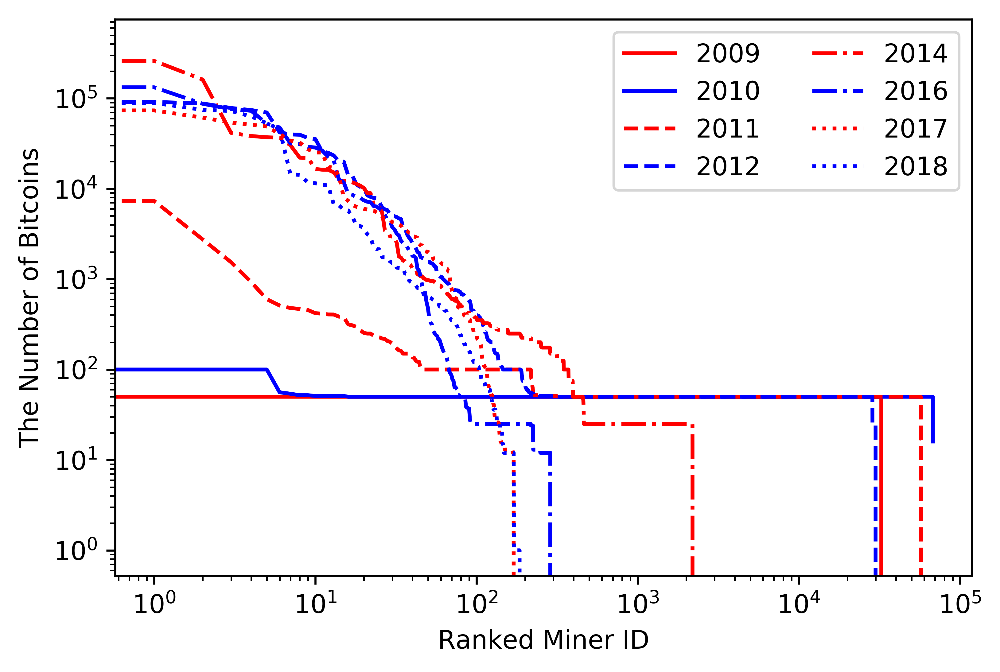

In [49]:
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.axes(xscale ='log', yscale = 'log')
#plt.plot(x_axix,miner,color = 'black',label = 'active miner')
plt.plot(np.arange(len(data_miner_info_2010)),income_info_2009,color = 'red',label = '2009')
#plt.scatter(x_axix,miner_2)
plt.plot(np.arange(len(data_miner_info_2010)),income_info_2010, 'b-',label = '2010')
#plt.scatter(x_axix,miner_5)
plt.plot(np.arange(len(data_miner_info_2010)),income_info_2011,'r--',label = '2011')
plt.plot(np.arange(len(data_miner_info_2010)),income_info_2012,'b--',label = '2012')
#plt.plot(np.arange(len(data_miner_info_2010)),income_info_2013,'r-.',label = '2013')
plt.plot(np.arange(len(data_miner_info_2010)),income_info_2014,'r-.',label = '2014')
#plt.plot(np.arange(len(data_miner_info_2010)),income_info_2015,'r.',label = '2015')
plt.plot(np.arange(len(data_miner_info_2010)),income_info_2016,'b-.',label = '2016')
plt.plot(np.arange(len(data_miner_info_2010)),income_info_2017,'r:',label = '2017')
plt.plot(np.arange(len(data_miner_info_2010)),income_info_2018,'b:',label = '2018')
#plt.scatter(x_axix,miner_10)
#plt.plot(x_axix,miner_20,marker='x',label = '20-active miner')
#plt.scatter(x_axix,miner_20)
#plt.plot(x_axix,miner_50,marker='*',label = '50-active miner')
#plt.scatter(x_axix,miner_50)
plt.legend(ncol=2)
#plt.xticks(x_axix,['2009','2010','2011','2012','2013','2014','2015','2016','2017'])
plt.xlabel('Ranked Miner ID')
plt.ylabel('The Number of Bitcoins')
plt.savefig('./figure/miner_balance_every.png', bbox_inches= 'tight')
plt.show()

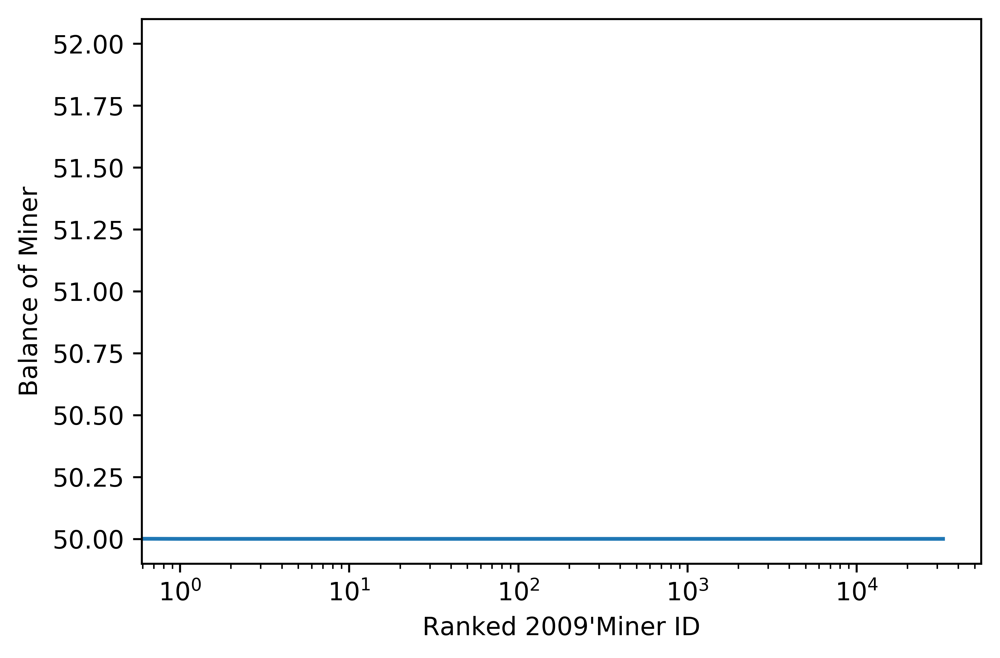

In [49]:
data_miner_info_2009.sort_values("miningincome",inplace=True,ascending = False)
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.axes(xscale ='log')
plt.plot(np.arange(len(data_miner_info_2009)),data_miner_info_2009['miningincome'])
plt.xlabel('Ranked 2009\'Miner ID')
plt.ylabel('Balance of Miner')
plt.savefig('./figure/miner_balance_2009.png', bbox_inches= 'tight')
plt.show()

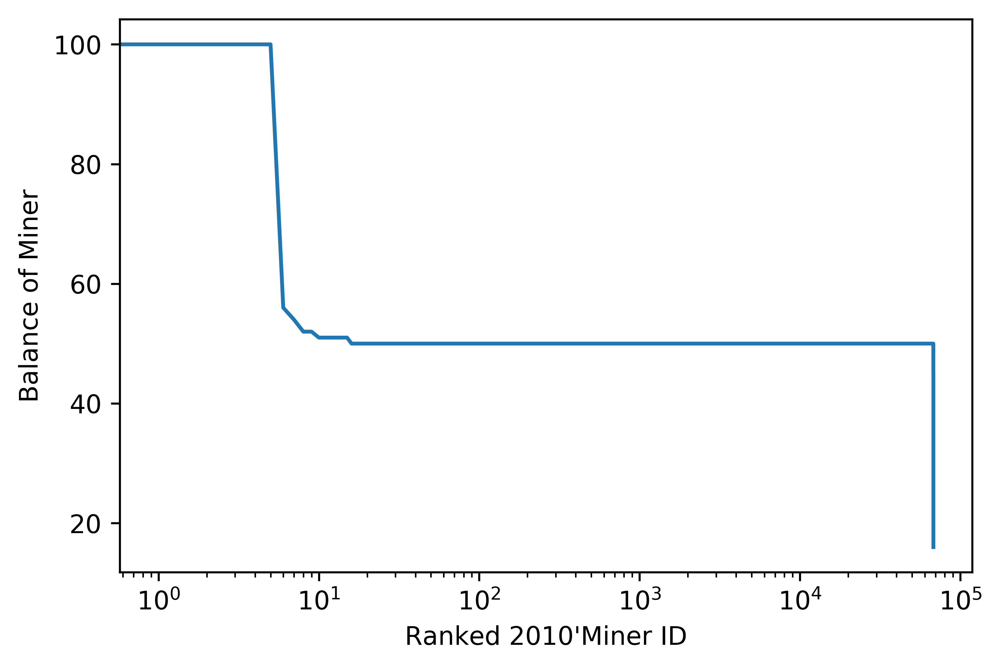

In [50]:
data_miner_info_2010.sort_values("miningincome",inplace=True,ascending = False)
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.axes(xscale ='log')
plt.plot(np.arange(len(data_miner_info_2010)),data_miner_info_2010['miningincome'])
plt.xlabel('Ranked 2010\'Miner ID')
plt.ylabel('Balance of Miner')
plt.savefig('./figure/miner_balance_2010.jpg', bbox_inches= 'tight')
plt.show()

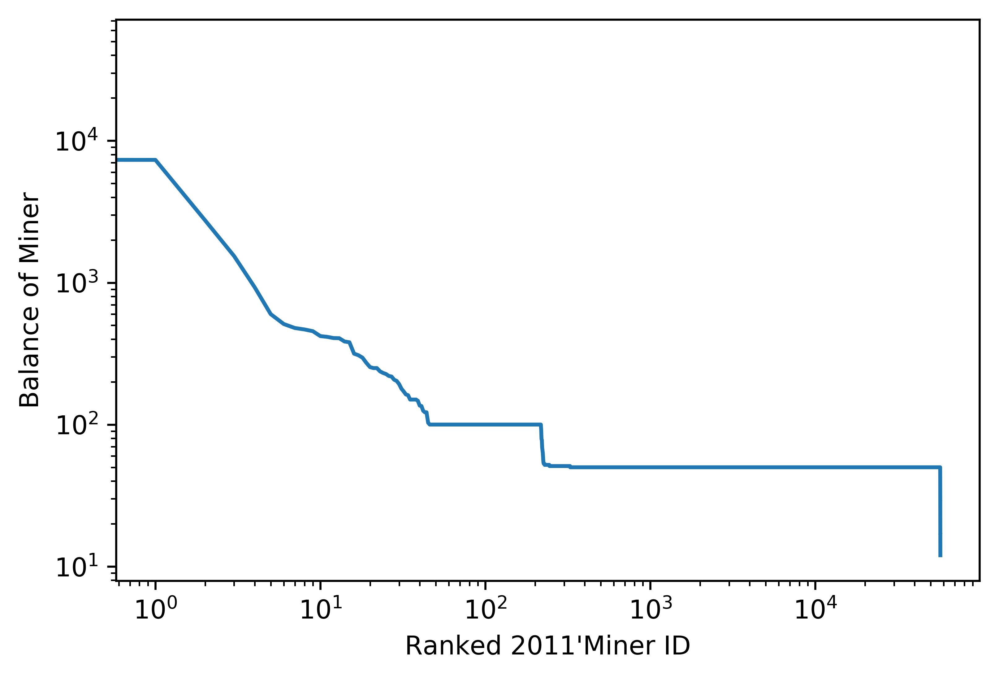

In [51]:
data_miner_info_2011.sort_values("miningincome",inplace=True,ascending = False)
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.axes(xscale ='log', yscale = 'log')
plt.plot(np.arange(len(data_miner_info_2011)),data_miner_info_2011['miningincome'])
plt.xlabel('Ranked 2011\'Miner ID')
plt.ylabel('Balance of Miner')
plt.savefig('./figure/miner_balance_2011.jpg', bbox_inches= 'tight')
plt.show()

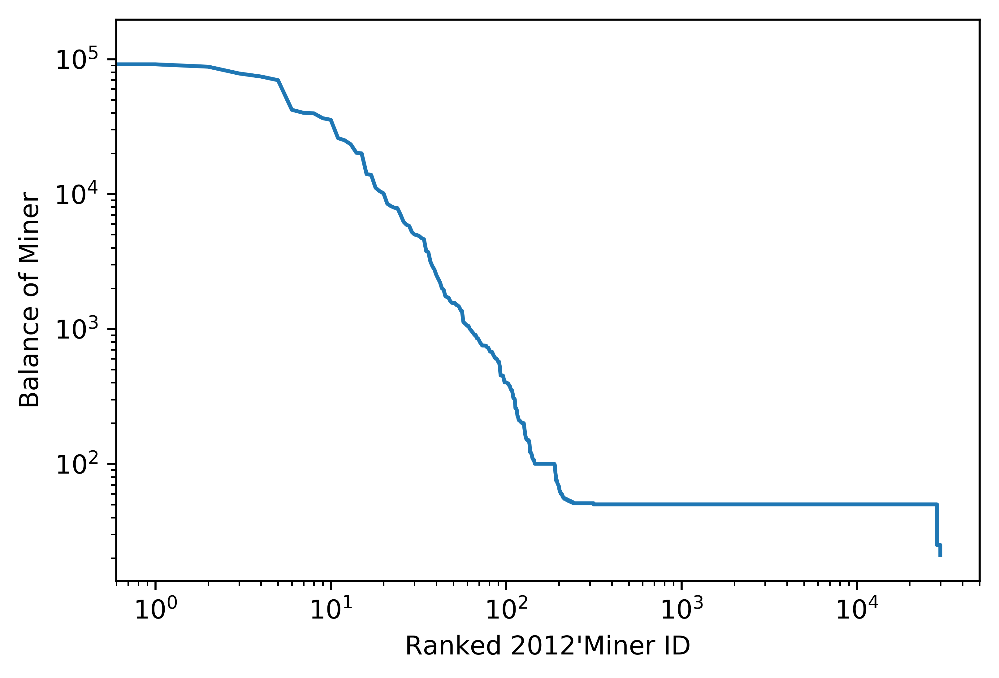

In [52]:
data_miner_info_2012.sort_values("miningincome",inplace=True,ascending = False)
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.axes(xscale ='log', yscale = 'log')
plt.plot(np.arange(len(data_miner_info_2012)),data_miner_info_2012['miningincome'])
plt.xlabel('Ranked 2012\'Miner ID')
plt.ylabel('Balance of Miner')
plt.savefig('./figure/miner_balance_2012.jpg', bbox_inches= 'tight')
plt.show()

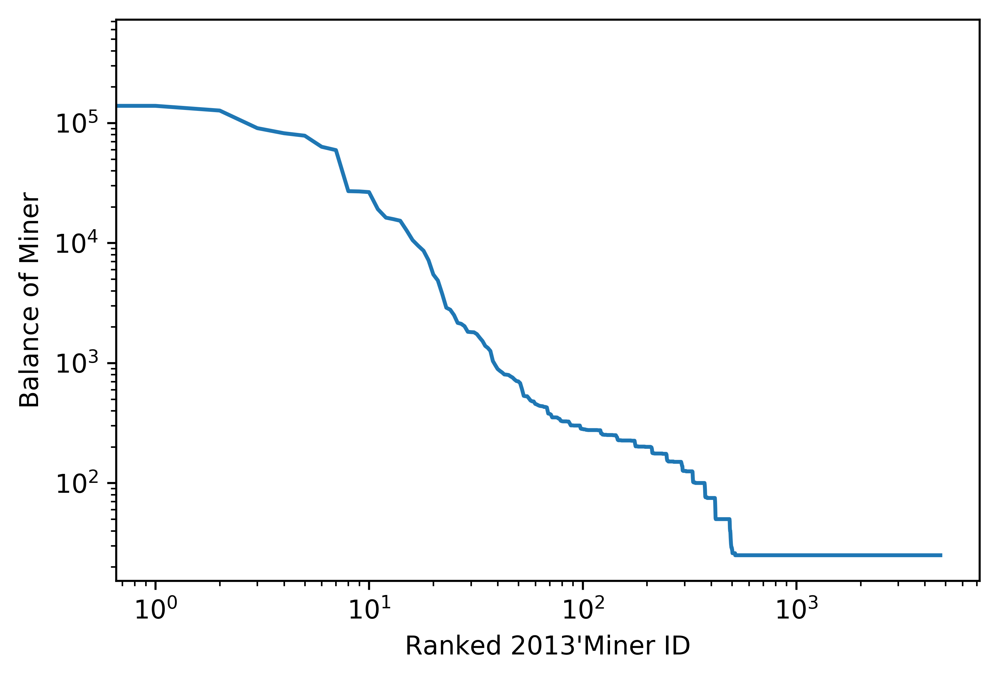

In [53]:
data_miner_info_2013.sort_values("miningincome",inplace=True,ascending = False)
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.axes(xscale ='log', yscale = 'log')
plt.plot(np.arange(len(data_miner_info_2013)),data_miner_info_2013['miningincome'])
plt.xlabel('Ranked 2013\'Miner ID')
plt.ylabel('Balance of Miner')
plt.savefig('./figure/miner_balance_2013.jpg', bbox_inches= 'tight')
plt.show()

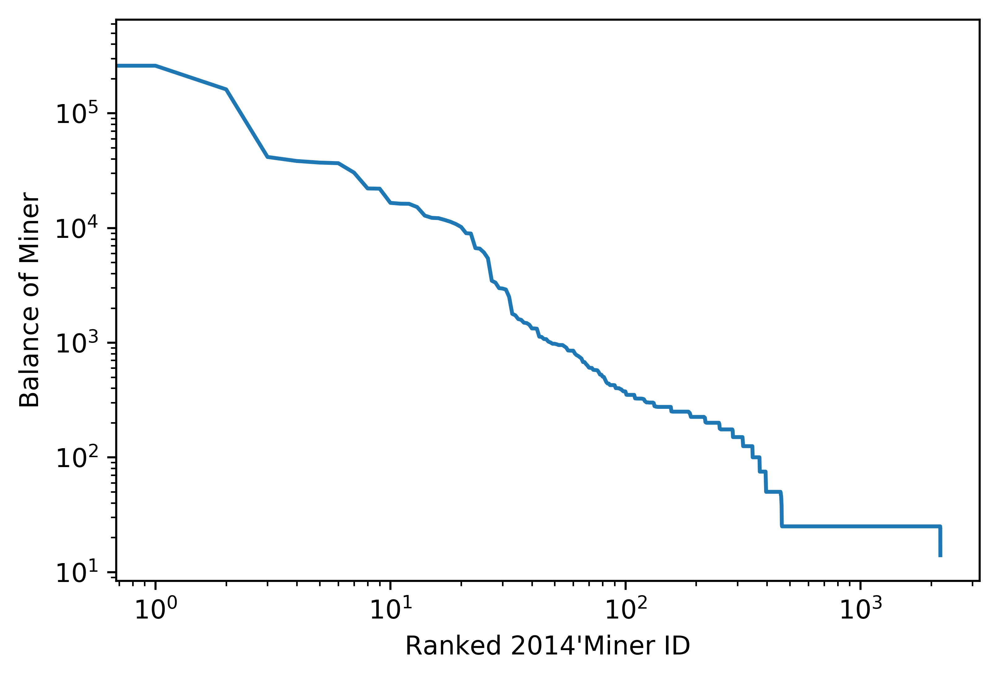

In [54]:
data_miner_info_2014.sort_values("miningincome",inplace=True,ascending = False)
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.axes(xscale ='log', yscale = 'log')
plt.plot(np.arange(len(data_miner_info_2014)),data_miner_info_2014['miningincome'])
plt.xlabel('Ranked 2014\'Miner ID')
plt.ylabel('Balance of Miner')
plt.savefig('./figure/miner_balance_2014.jpg', bbox_inches= 'tight')
plt.show()

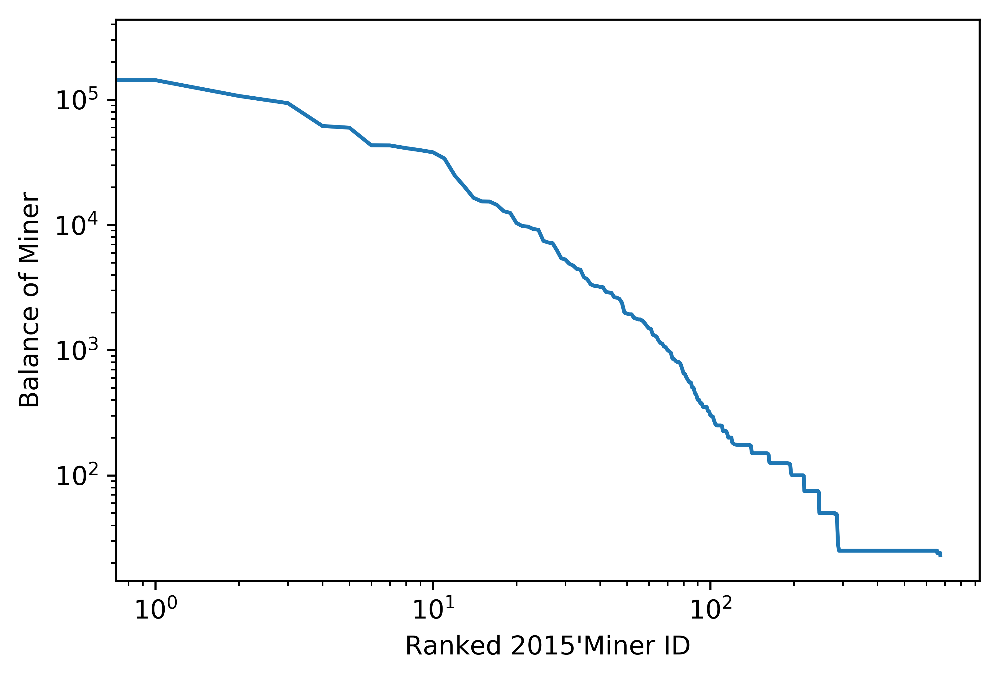

In [55]:
data_miner_info_2015.sort_values("miningincome",inplace=True,ascending = False)
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.axes(xscale ='log', yscale = 'log')
plt.plot(np.arange(len(data_miner_info_2015)),data_miner_info_2015['miningincome'])
plt.xlabel('Ranked 2015\'Miner ID')
plt.ylabel('Balance of Miner')
plt.savefig('./figure/miner_balance_2015.jpg', bbox_inches= 'tight')
plt.show()

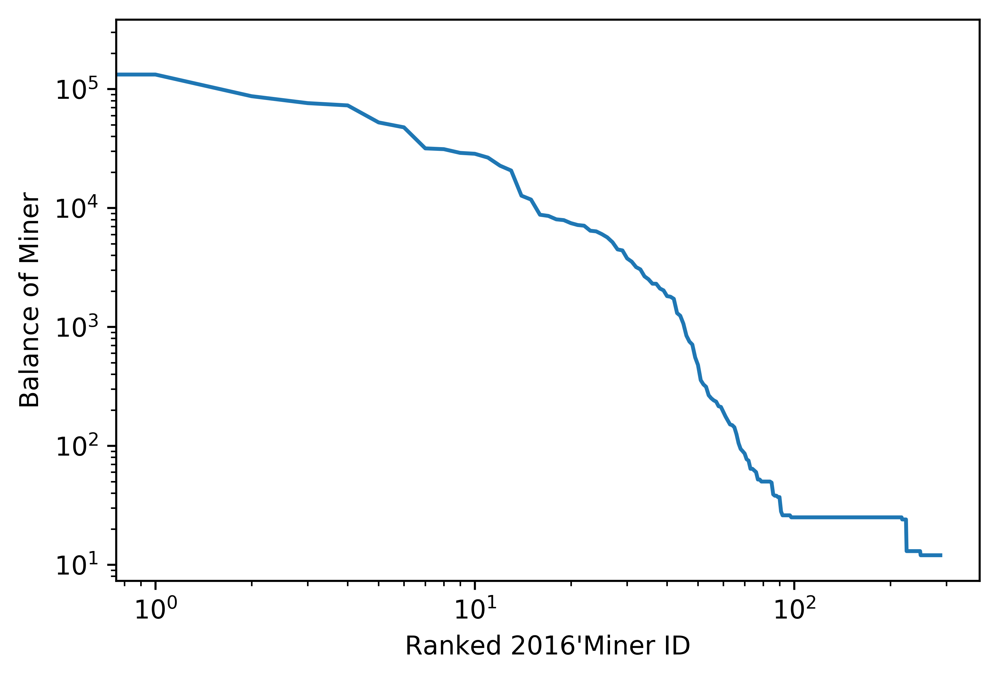

In [56]:
data_miner_info_2016.sort_values("miningincome",inplace=True,ascending = False)
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.axes(xscale ='log', yscale = 'log')
plt.plot(np.arange(len(data_miner_info_2016)),data_miner_info_2016['miningincome'])
plt.xlabel('Ranked 2016\'Miner ID')
plt.ylabel('Balance of Miner')
plt.savefig('./figure/miner_balance_2016.jpg', bbox_inches= 'tight')
plt.show()

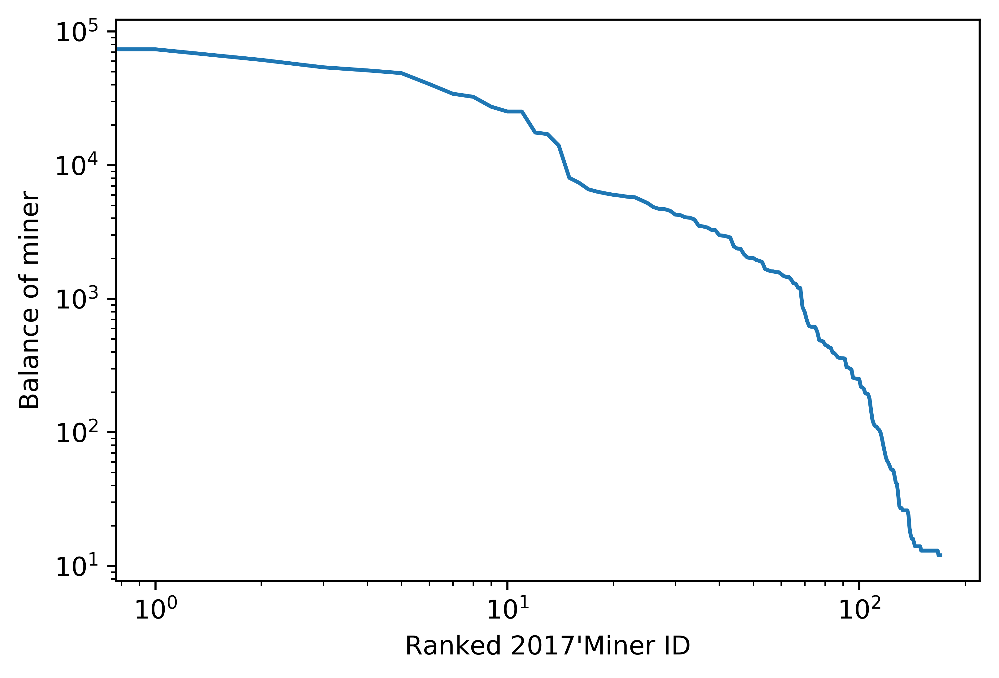

In [57]:
data_miner_info_2017.sort_values("miningincome",inplace=True,ascending = False)
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.axes(xscale ='log', yscale = 'log')
plt.plot(np.arange(len(data_miner_info_2017)),data_miner_info_2017['miningincome'])
plt.xlabel('Ranked 2017\'Miner ID')
plt.ylabel('Balance of miner')
plt.savefig('./figure/miner_balance_2017.png', bbox_inches= 'tight')
plt.show()

C:\Users\21133\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:3471: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=1.0, top=1.0
  'bottom=%s, top=%s') % (bottom, top))


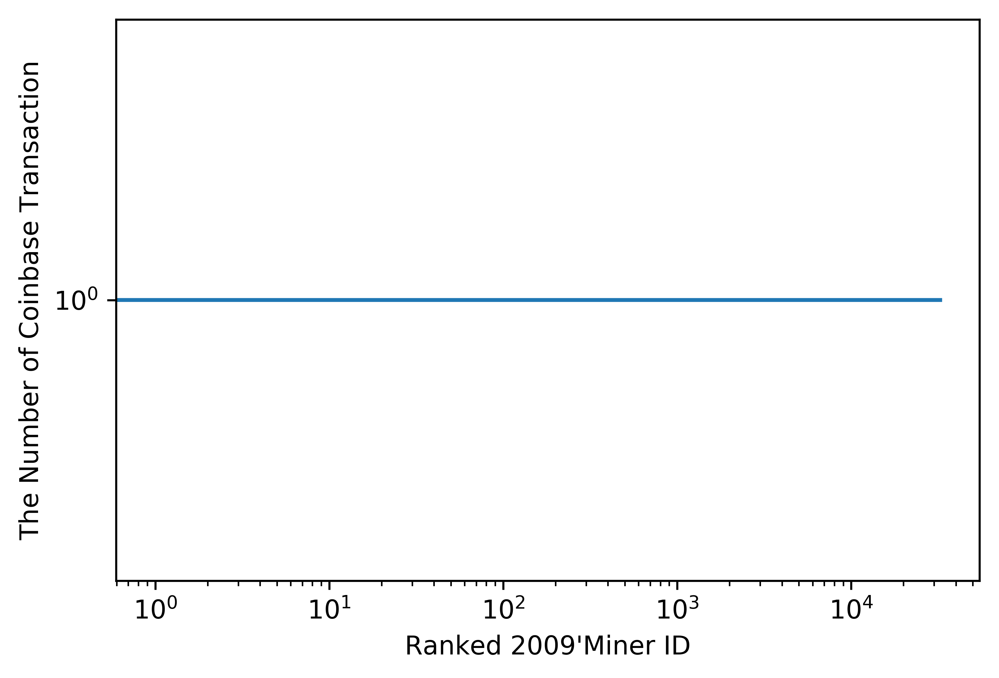

In [58]:
data_miner_info_2009.sort_values("miningdegree",inplace=True,ascending = False)
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.axes(xscale ='log', yscale = 'log')
plt.plot(np.arange(len(data_miner_info_2009)),data_miner_info_2009['miningdegree'])
plt.xlabel('Ranked 2009\'Miner ID')
plt.ylabel('The Number of Coinbase Transaction')
plt.savefig('./figure/miner_power_2009.png', bbox_inches= 'tight')
plt.show()

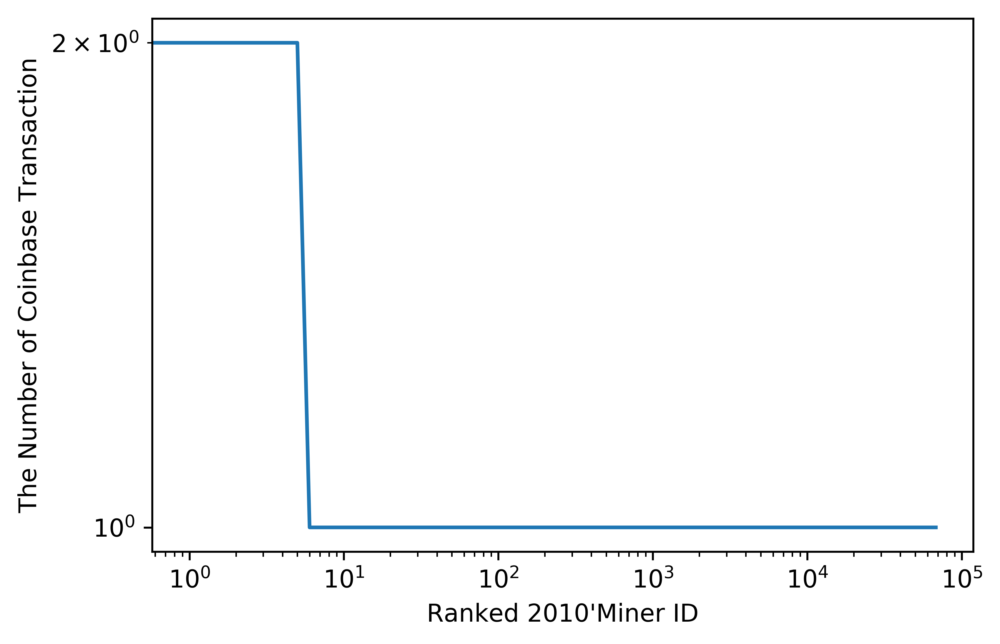

In [60]:
data_miner_info_2010.sort_values("miningdegree",inplace=True,ascending = False)
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.axes(xscale ='log', yscale = 'log')
plt.plot(np.arange(len(data_miner_info_2010)),data_miner_info_2010['miningdegree'])
plt.xlabel('Ranked 2010\'Miner ID')
plt.ylabel('The Number of Coinbase Transaction')
plt.savefig('./figure/miner_power_2010.png', bbox_inches= 'tight')
plt.show()

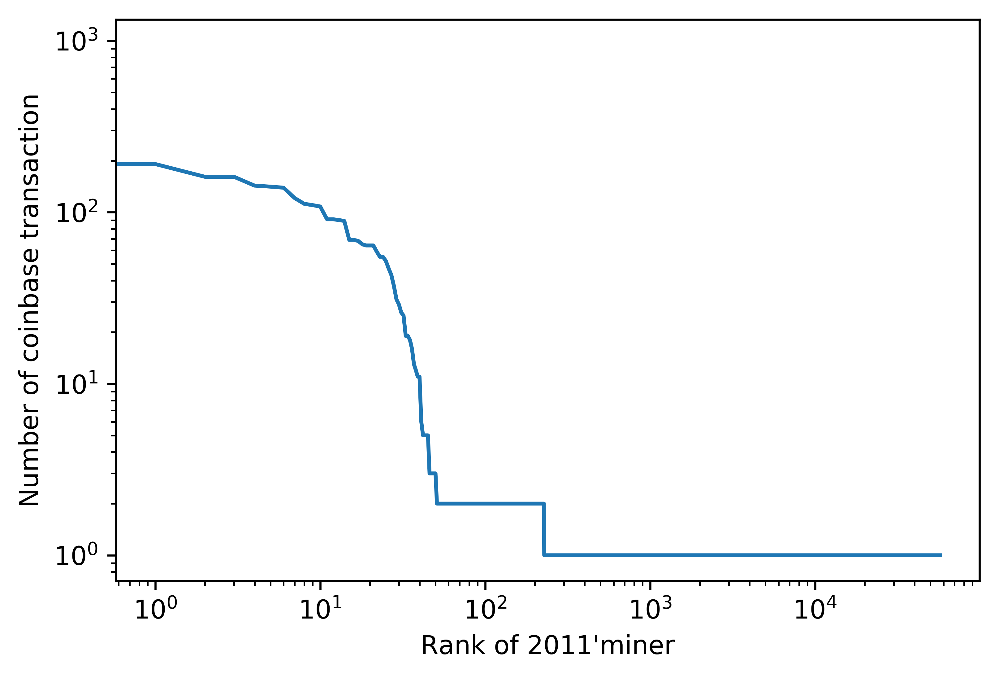

In [39]:
data_miner_info_2011.sort_values("miningdegree",inplace=True,ascending = False)
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.axes(xscale ='log', yscale = 'log')
plt.plot(np.arange(len(data_miner_info_2011)),data_miner_info_2011['miningdegree'])
plt.xlabel('Ranked 2011\'Miner ID')
plt.ylabel('The Number of Coinbase Transaction')
plt.savefig('./figure/miner_power_2011.png', bbox_inches= 'tight')
plt.show()

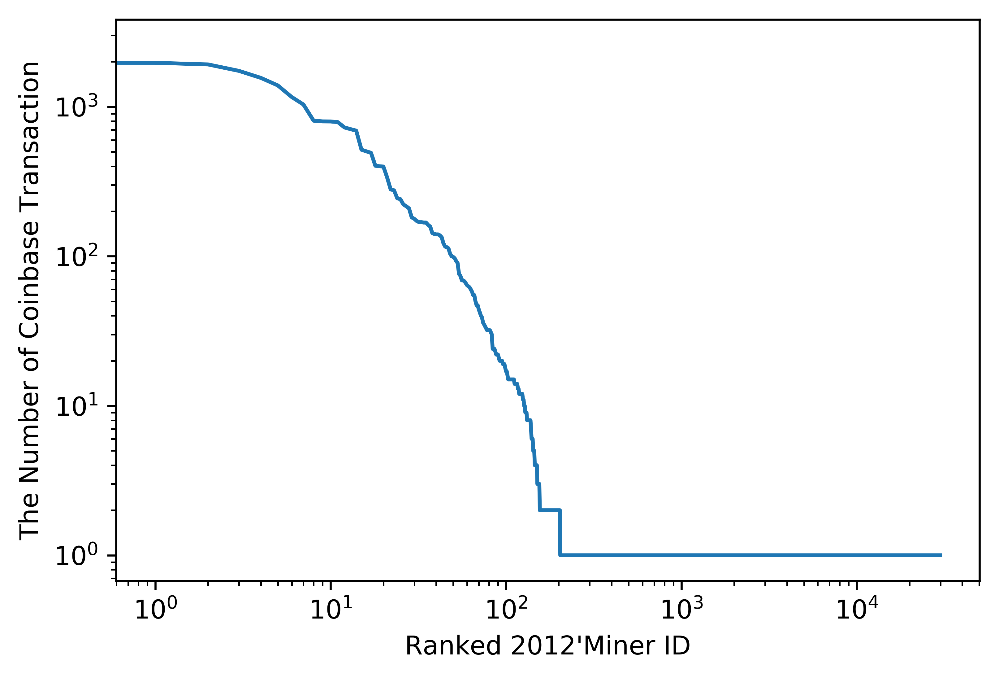

In [61]:
data_miner_info_2012.sort_values("miningdegree",inplace=True,ascending = False)
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.axes(xscale ='log', yscale = 'log')
plt.plot(np.arange(len(data_miner_info_2012)),data_miner_info_2012['miningdegree'])
plt.xlabel('Ranked 2012\'Miner ID')
plt.ylabel('The Number of Coinbase Transaction')
plt.savefig('./figure/miner_power_2012.png', bbox_inches= 'tight')
plt.show()

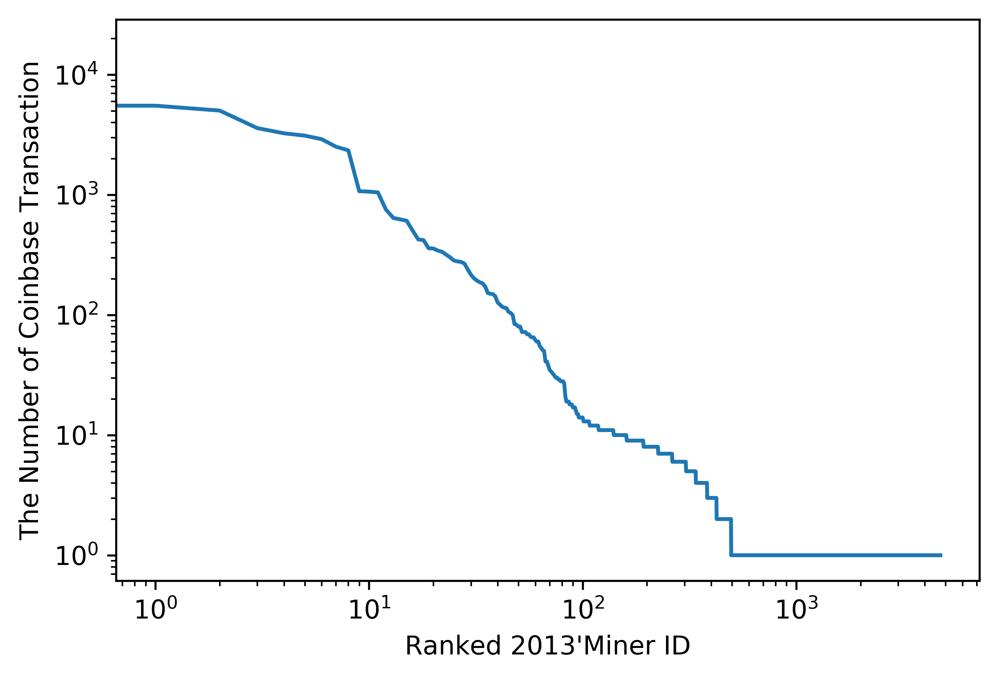

In [62]:
data_miner_info_2013.sort_values("miningdegree",inplace=True,ascending = False)
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.axes(xscale ='log', yscale = 'log')
plt.plot(np.arange(len(data_miner_info_2013)),data_miner_info_2013['miningdegree'])
plt.xlabel('Ranked 2013\'Miner ID')
plt.ylabel('The Number of Coinbase Transaction')
plt.savefig('./figure/miner_power_2013.png', bbox_inches= 'tight')
plt.show()

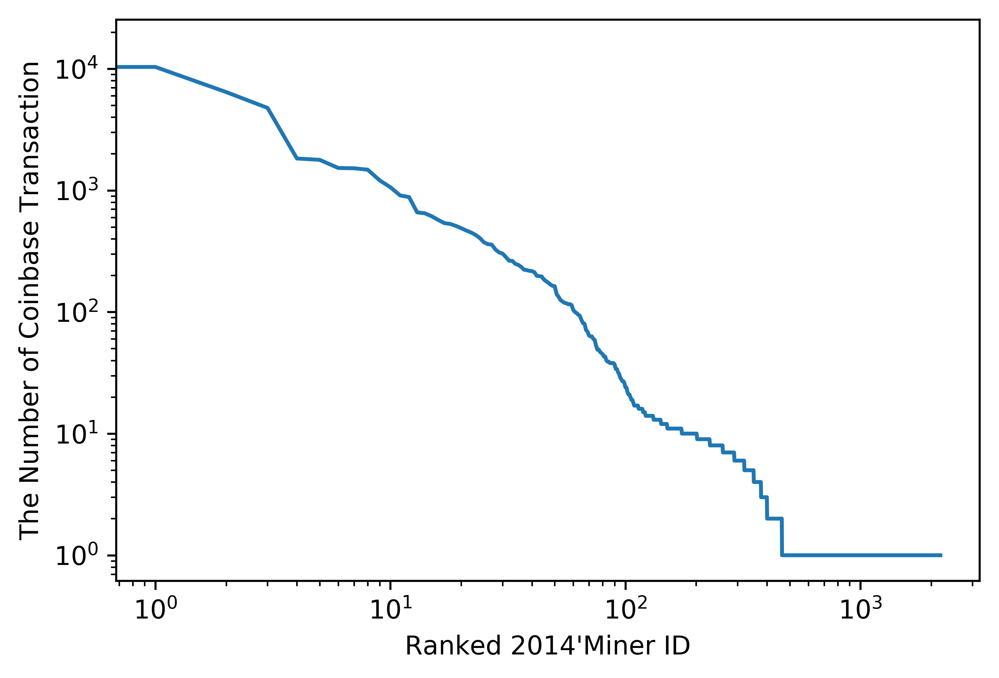

In [63]:
data_miner_info_2014.sort_values("miningdegree",inplace=True,ascending = False)
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.axes(xscale ='log', yscale = 'log')
plt.plot(np.arange(len(data_miner_info_2014)),data_miner_info_2014['miningdegree'])
plt.xlabel('Ranked 2014\'Miner ID')
plt.ylabel('The Number of Coinbase Transaction')
plt.savefig('./figure/miner_power_2014.png', bbox_inches= 'tight')
plt.show()

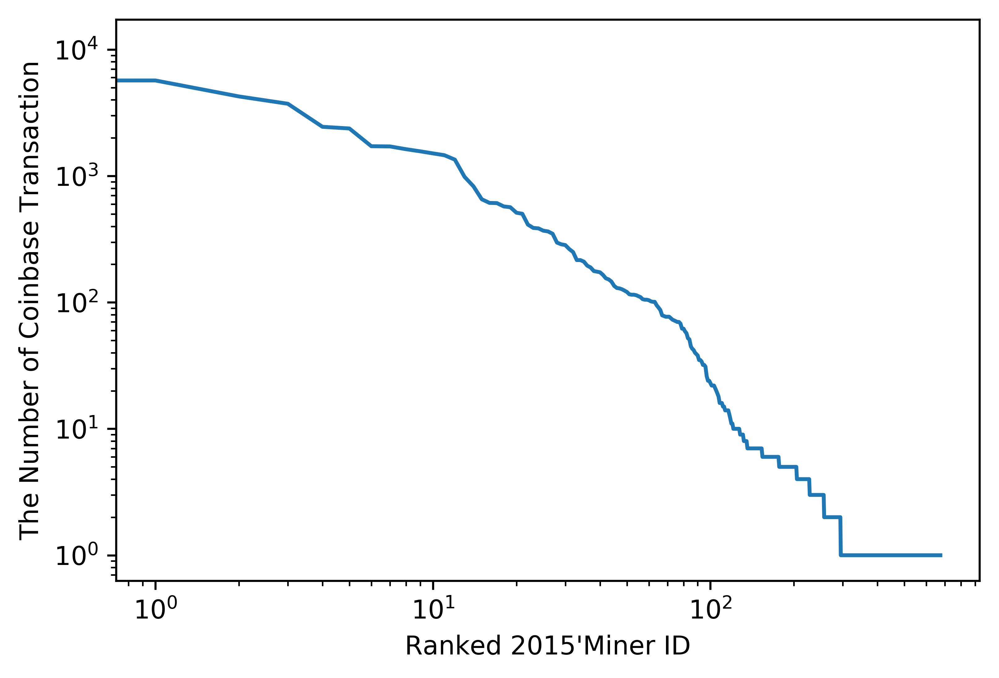

In [64]:
data_miner_info_2015.sort_values("miningdegree",inplace=True,ascending = False)
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.axes(xscale ='log', yscale = 'log')
plt.plot(np.arange(len(data_miner_info_2015)),data_miner_info_2015['miningdegree'])
plt.xlabel('Ranked 2015\'Miner ID')
plt.ylabel('The Number of Coinbase Transaction')
plt.savefig('./figure/miner_power_2015.png', bbox_inches= 'tight')
plt.show()

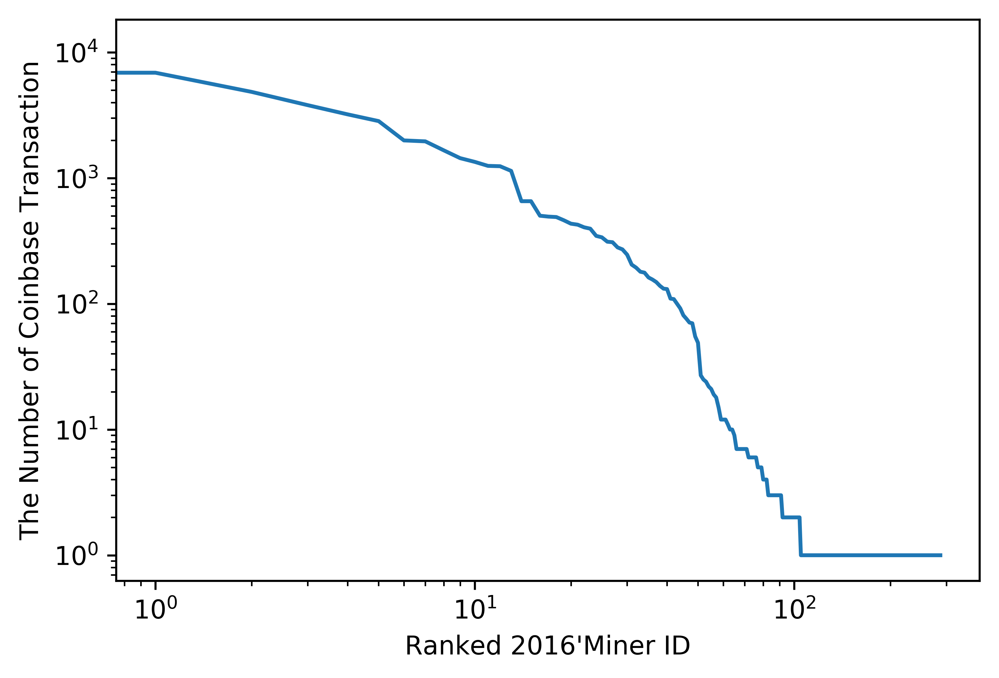

In [65]:
data_miner_info_2016.sort_values("miningdegree",inplace=True,ascending = False)
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.axes(xscale ='log', yscale = 'log')
plt.plot(np.arange(len(data_miner_info_2016)),data_miner_info_2016['miningdegree'])
plt.xlabel('Ranked 2016\'Miner ID')
plt.ylabel('The Number of Coinbase Transaction')
plt.savefig('./figure/miner_power_2016.png', bbox_inches= 'tight')
plt.show()

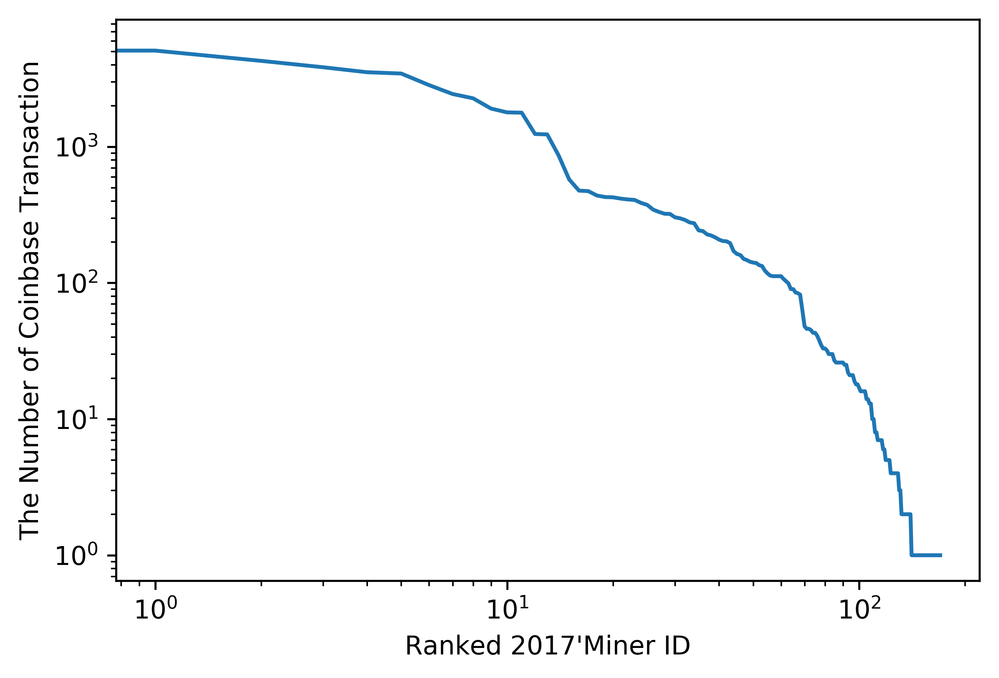

In [66]:
data_miner_info_2017.sort_values("miningdegree",inplace=True,ascending = False)
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.axes(xscale ='log', yscale = 'log')
plt.plot(np.arange(len(data_miner_info_2017)),data_miner_info_2017['miningdegree'])
plt.xlabel('Ranked 2017\'Miner ID')
plt.ylabel('The Number of Coinbase Transaction')
plt.savefig('./figure/miner_power_2017.png', bbox_inches= 'tight')
plt.show()

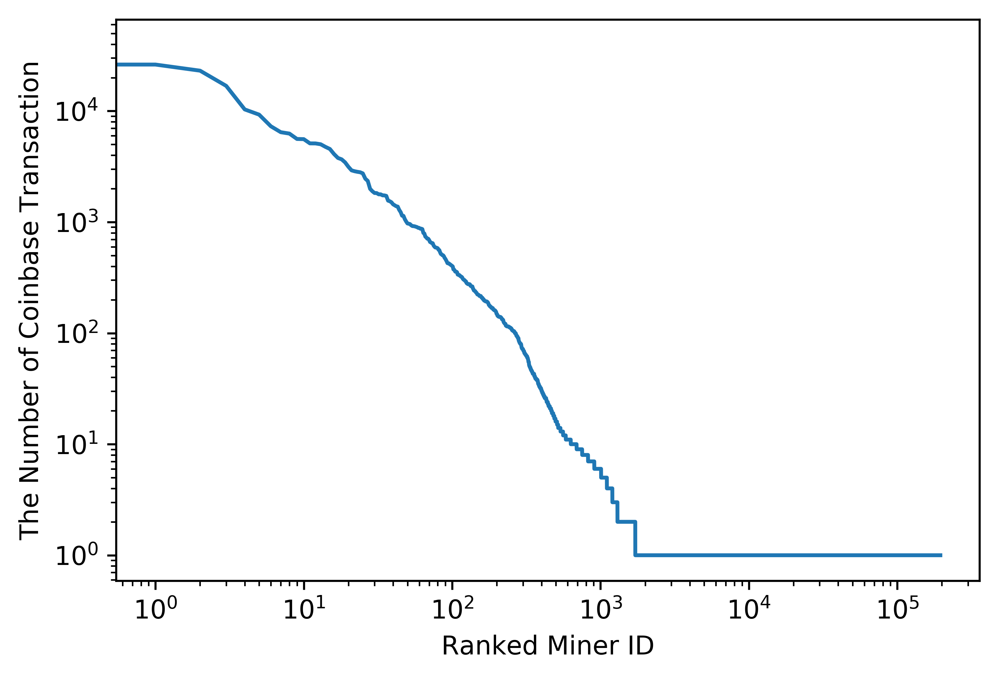

In [59]:
miner_info.sort_values("miningdegree",inplace=True,ascending = False)
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.axes(xscale ='log', yscale = 'log')
plt.plot(np.arange(0,195415,1),miner_info['miningdegree'])
plt.xlabel('Ranked Miner ID')
plt.ylabel('The Number of Coinbase Transaction')
plt.savefig('./figure/miner_power.png', bbox_inches= 'tight')
plt.show()

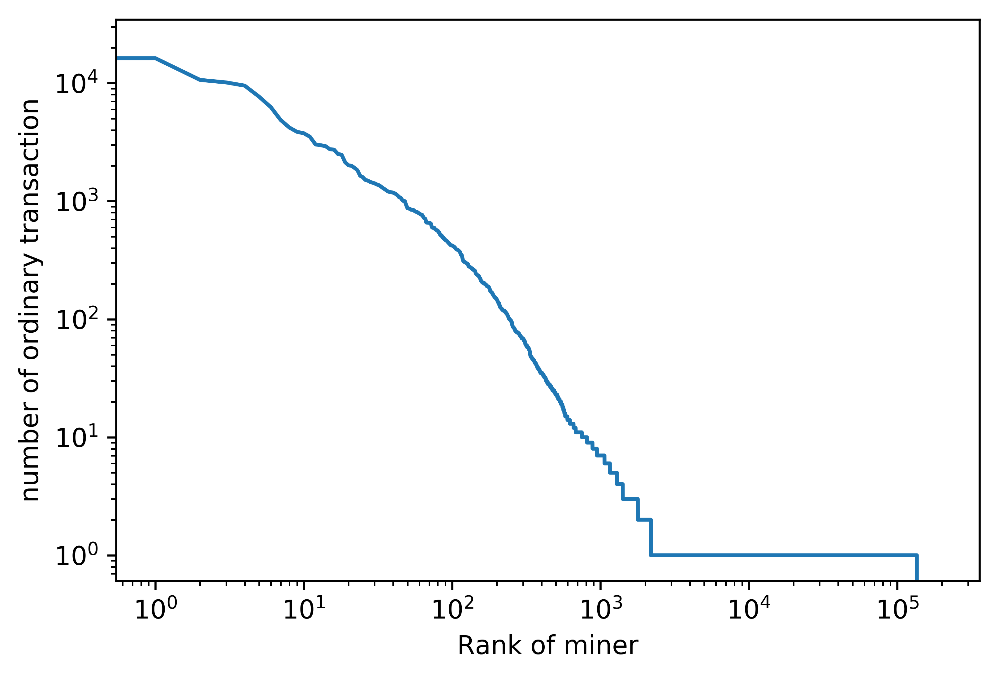

In [74]:
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
miner_info.sort_values("miner_interconnected",inplace=True,ascending = False)
plt.axes(xscale ='log', yscale = 'log')
plt.plot(np.arange(0,195415,1),miner_info['miner_interconnected'])
plt.xlabel('Rank of miner')
plt.ylabel('number of ordinary transaction')
plt.savefig('./figure/miner_all_interconnected.png', bbox_inches= 'tight')
plt.show()

In [9]:
miner_info['ordinary'] = miner_info['indegree'] + miner_info['outdegree'] - miner_info['miningdegree']


C:\Users\21133\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


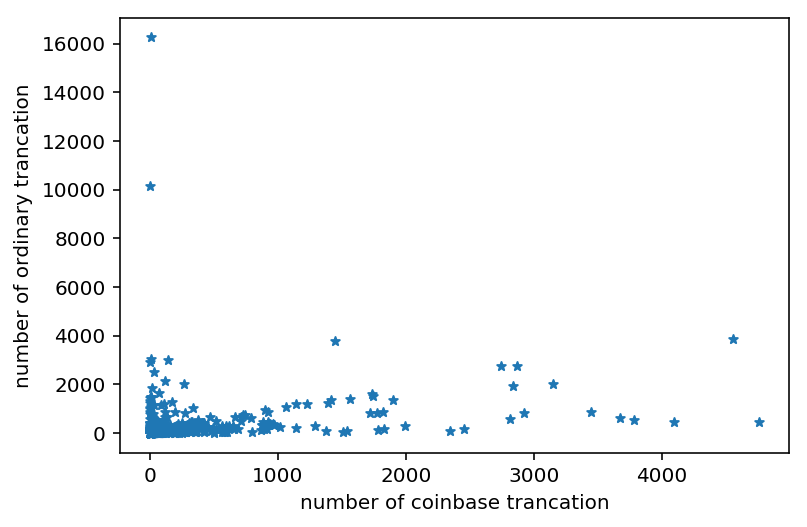

In [14]:
miner_info_2 = miner_info[miner_info['miningdegree'] < 5000]
miner_info_2.sort_values("miningdegree",inplace=True)
#plt.axes(xscale ='log', yscale = 'log')
plt.scatter(miner_info_2['miningdegree'], miner_info_2['ordinary'],s=20,  marker='*')
plt.xlabel('number of coinbase trancation')
plt.ylabel('number of ordinary trancation')
#plt.plot(miner_info['indegree'],miner_info['indegree'],color = 'green')
plt.savefig('./figure/ordinary_mining.jpg',bbox_inches= 'tight' )
plt.show()

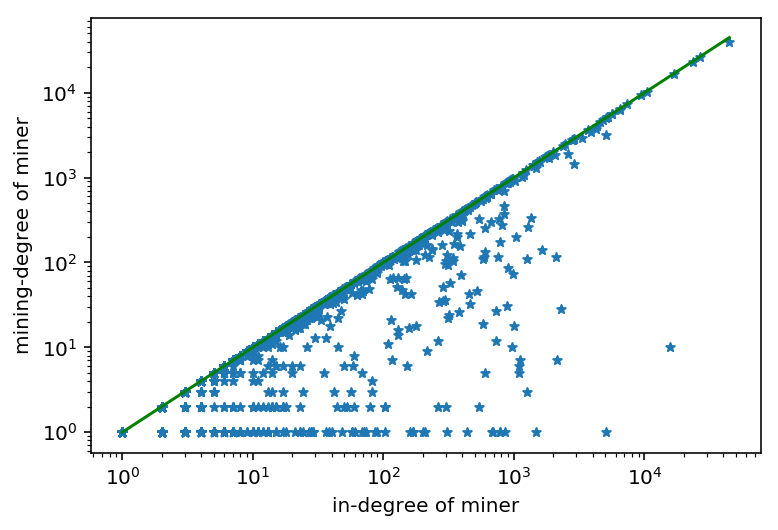

In [126]:
miner_info.sort_values("miningdegree",inplace=True)
plt.axes(xscale ='log', yscale = 'log')
plt.scatter(miner_info['indegree'],miner_info['miningdegree'],s=20,  marker='*')
plt.xlabel('in-degree of miner')
plt.ylabel('mining-degree of miner')
plt.plot(miner_info['indegree'],miner_info['indegree'],color = 'green')
plt.savefig('./figure/in-miningdegree-degree.jpg',bbox_inches= 'tight' )
plt.show()

C:\Users\21133\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


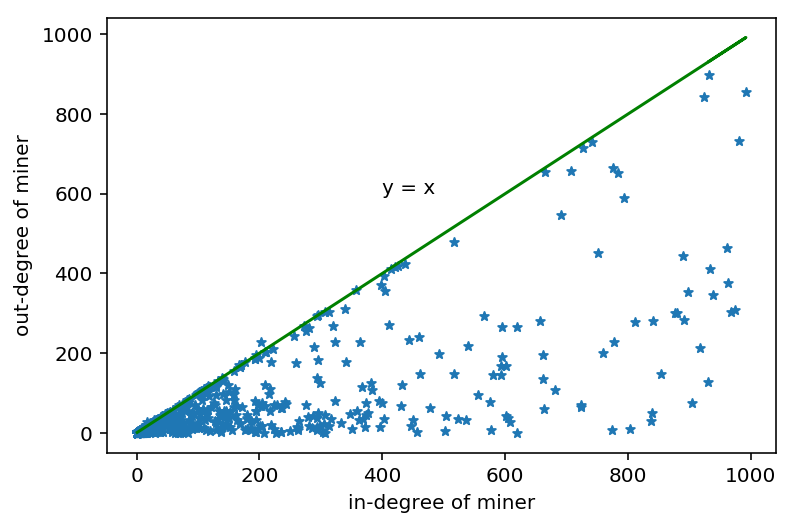

In [168]:
miner_new_info = miner_info[miner_info['indegree']<1000]
miner_new_info.sort_values("outdegree",inplace=True)
#fig,ax=plt.subplots(figsize=(20,10))
#plt.axes(xscale ='log', yscale = 'log')
plt.scatter(miner_new_info['indegree'],miner_new_info['outdegree'],s=20, marker='*')
plt.xlabel('in-degree of miner')
plt.ylabel('out-degree of miner')
plt.plot(miner_new_info['indegree'],miner_new_info['indegree'],color = 'green')
plt.text(400,600,'y = x')
plt.savefig('./figure/in-out-degree.jpg',bbox_inches= 'tight' )
plt.show()

In [49]:
miner_new_info = miner_info[miner_info['indegree']<1000]
miner_new_info2 = miner_new_info[miner_new_info['outdegree']>0]
miner_new_info2.sort_values("outdegree",inplace=True)
#fig,ax=plt.subplots(figsize=(20,10))
#plt.axes(xscale ='log', yscale = 'log')
plt.scatter(miner_new_info2['indegree'],miner_new_info2['outdegree'],s=20, marker='*')
plt.xlabel('in-degree of miner')
plt.ylabel('out-degree of miner')
plt.savefig('./figure/in-out-degree_no0.jpg',bbox_inches= 'tight' )
plt.show()

TypeError: cannot convert the series to <class 'int'>

In [52]:
miner_info = pd.read_csv('miner_info_2009_2017.csv',header = None, names = ['id','indegree','income','outdegree','pay','miningdegree','miningincome','mining_time','in_time','out_time','all_degree','all_time','hoard','e_time','max_year','min_year'])

C:\Users\21133\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2785: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [6]:
#miner_info['hoard'] = miner_info['income']-miner_info['pay']
print(miner_info.head(5))

   id  indegree  income  outdegree  pay  miningdegree  miningincome  \
0   1         1      50          0    0             1            50   
1   2         1      50          0    0             1            50   
2   3         1      50          0    0             1            50   
3   4         1      50          0    0             1            50   
4   5         1      50          0    0             1            50   

  mining_time     in_time out_time  all_degree      all_time  hoard    e_time  \
0  1231006505  1231006505        0           1  1231006505:0     50  20090104   
1  1231469665  1231469665        0           1  1231469665:0     50  20090109   
2  1231469744  1231469744        0           1  1231469744:0     50  20090109   
3  1231470173  1231470173        0           1  1231470173:0     50  20090109   
4  1231470988  1231470988        0           1  1231470988:0     50  20090109   

   max_year  min_year  
0      2009       NaN  
1      2009       NaN  
2      2009   

C:\Users\21133\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


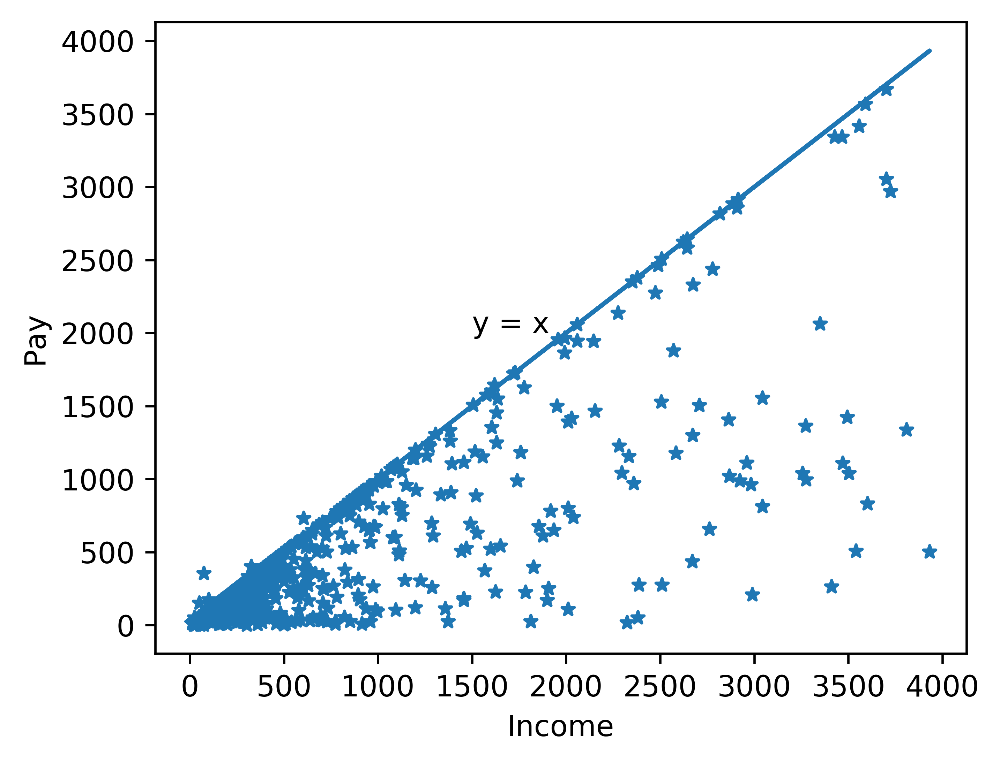

In [91]:
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
miner_new_info = miner_info[(miner_info['pay']<4000)&(miner_info['pay']>0)&(miner_info['income']<4000)]
miner_new_info.sort_values("pay",inplace=True)
fig,ax=plt.subplots(figsize=(5,4))
ax.scatter(miner_new_info['income'],miner_new_info['pay'],s=20, marker='*')
ax.set_xlabel('Income')
ax.set_ylabel('Pay')
ax.plot(miner_new_info['income'],miner_new_info['income'])
ax.text(1500,2000,'y = x')
plt.savefig('./figure/miner_in_out_btc.png',bbox_inches= 'tight' )
plt.show()

如图会发现还是有很大一部分矿工的钱没有花，囤积了起来，因为这是记录从2009到2017的所有矿工的收入和花费情况

下面展示到2017年底，矿工囤积情况。

In [130]:
help(plt.plot)

Help on function plot in module matplotlib.pyplot:

plot(*args, **kwargs)
    Plot y versus x as lines and/or markers.
    
    Call signatures::
    
        plot([x], y, [fmt], data=None, **kwargs)
        plot([x], y, [fmt], [x2], y2, [fmt2], ..., **kwargs)
    
    The coordinates of the points or line nodes are given by *x*, *y*.
    
    The optional parameter *fmt* is a convenient way for defining basic
    formatting like color, marker and linestyle. It's a shortcut string
    notation described in the *Notes* section below.
    
    >>> plot(x, y)        # plot x and y using default line style and color
    >>> plot(x, y, 'bo')  # plot x and y using blue circle markers
    >>> plot(y)           # plot y using x as index array 0..N-1
    >>> plot(y, 'r+')     # ditto, but with red plusses
    
    You can use `.Line2D` properties as keyword arguments for more
    control on the  appearance. Line properties and *fmt* can be mixed.
    The following two calls yield identical resu

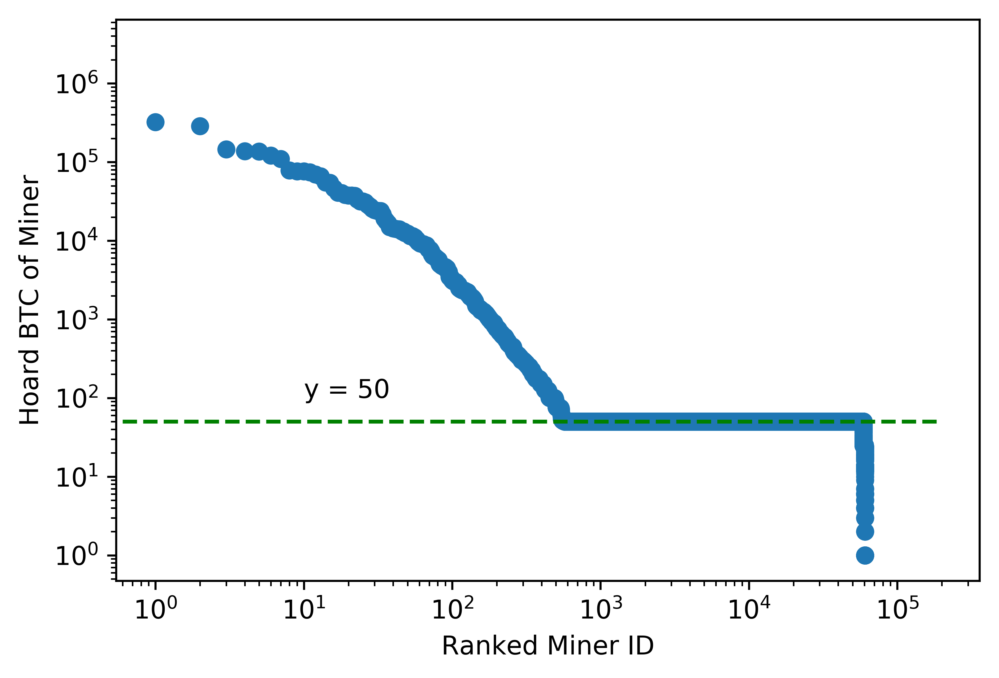

In [53]:
miner_info.sort_values("hoard",inplace=True,ascending = False)
y_50 = []
for i in range(195415):
    y_50.append(50)
plt.axes(xscale ='log', yscale = 'log')
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.plot(np.arange(0,195415,1),miner_info['hoard'],'o')
plt.xlabel('Ranked Miner ID')
plt.ylabel('Hoard BTC of Miner')
plt.plot(np.arange(0,195415,1),y_50,color='green', linestyle='dashed')
plt.text(10,100,'y = 50')
plt.savefig('./figure/miner_hoard.png', bbox_inches= 'tight')
plt.show()

从上图可以看到，矿工的囤积情况还是比较明显的。
下面将查看每一年的囤积情况和所占的比率

In [54]:
def hoard_income(year,miner_hoard,miner_number,miner_income):
    data_miner = miner_info[miner_info['max_year'] == year]
    data_miner_2 = data_miner[data_miner['hoard'] > 0]
    hoard = 0
    income = 0
    miner_number.append(float(len(data_miner_2['hoard']))*100 /len(data_miner['hoard']))
    for data in data_miner_2['hoard']:
        hoard= hoard + data
    for data in data_miner['income']:
        income = income + data
    miner_hoard.append(hoard)
    miner_income.append(income)

In [55]:
year = ['2009','2010','2011','2012','2013','2014','2015','2016','2017']
miner_hoard = []
miner_number = []
miner_income = []
hoard_income(2009,miner_hoard,miner_number,miner_income)
hoard_income(2010,miner_hoard,miner_number,miner_income)
hoard_income(2011,miner_hoard,miner_number,miner_income)
hoard_income(2012,miner_hoard,miner_number,miner_income)
hoard_income(2013,miner_hoard,miner_number,miner_income)
hoard_income(2014,miner_hoard,miner_number,miner_income)
hoard_income(2015,miner_hoard,miner_number,miner_income)
hoard_income(2016,miner_hoard,miner_number,miner_income)
hoard_income(2017,miner_hoard,miner_number,miner_income)
print(miner_hoard)
print(miner_income)
print(miner_number)

[1485404, 1268446, 150756, 153508, 162382, 348912, 515381, 1038485, 463525]
[1624130, 3394925, 2882644, 2207907, 1003578, 873215, 1273238, 1611627, 925833]
[91.5683071897439, 37.370181046801115, 4.999563433161617, 3.814932353432437, 17.836691410392365, 8.599624060150376, 32.84789644012945, 78.04878048780488, 65.54054054054055]


In [56]:
hoard_percentage = []
for i in range(len(miner_hoard)):
    hoard_percentage.append(float(miner_hoard[i])*100/miner_income[i])
print(hoard_percentage)

[91.45844236606676, 37.36300507374979, 5.229782102819495, 6.952647914971056, 16.180306862047594, 39.95716976918628, 40.47797819417894, 64.43705646529874, 50.06572459612047]


In [57]:
price_change = [0,0.1,4,10,100,400,250,700,6000]

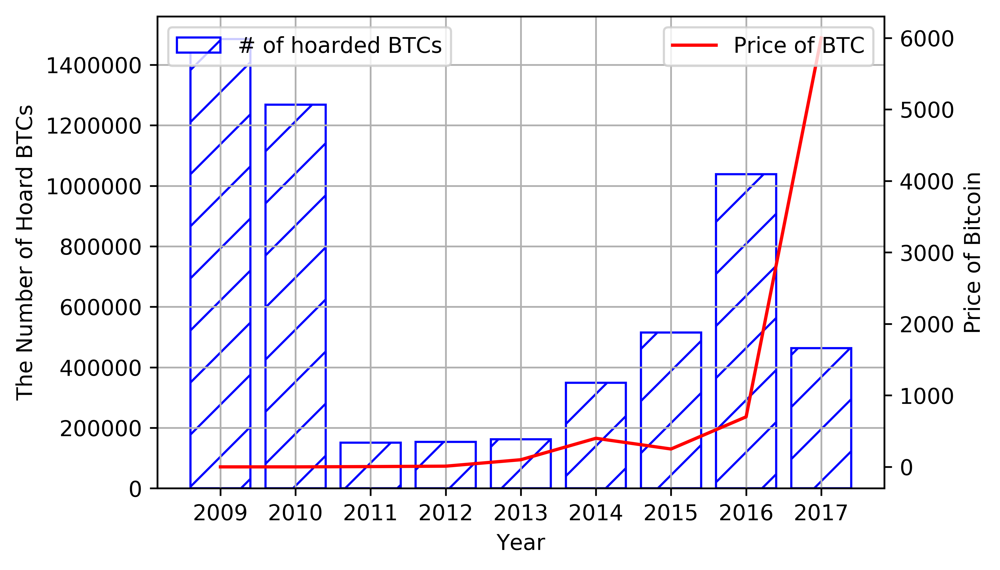

In [64]:
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
fig = plt.figure()
ax = fig.add_subplot(111)
ax.bar(year,miner_hoard,hatch='/', color='white', edgecolor='blue',label = '# of hoarded BTCs')
tx3 = '2013'
ty3 = 200000
#ax.text(tx3,ty3,'Subsidy Halved ',fontsize=10,verticalalignment="bottom",horizontalalignment="center")
#ax.annotate('',xy=('2013',miner_hoard[4]),xytext=(tx3,ty3),arrowprops=dict(arrowstyle="->",connectionstyle="arc3")) 

tx0 = '2014'
ty0 = 400000
#ax.text(tx0,ty0,'PayPal Support ',fontsize=10,verticalalignment="bottom",horizontalalignment="center")
#ax.annotate('',xy=('2014',miner_hoard[5]),xytext=(tx0,ty0),arrowprops=dict(arrowstyle="->",connectionstyle="arc3"))

tx = '2015'
ty = 800000
#ax.text(tx,ty,'European Support ',fontsize=10,verticalalignment="bottom",horizontalalignment="center")
#ax.annotate('',xy=('2015',miner_hoard[6]),xytext=(tx,ty),arrowprops=dict(arrowstyle="->",connectionstyle="arc3"))
tx1 = '2016'
ty1 = 1200000
#ax.text(tx1,ty1,'Subsidy Halved ',fontsize=10,verticalalignment="bottom",horizontalalignment="center")
#ax.annotate('',xy=('2016',miner_hoard[7]),xytext=(tx1,ty1),arrowprops=dict(arrowstyle="->",connectionstyle="arc3"))
tx2 = '2017'
ty2 = 600000
#ax.text(tx2,ty2,'China Boycott ',fontsize=10,verticalalignment="bottom",horizontalalignment="center")
#ax.annotate('',xy=('2017',miner_hoard[8]),xytext=(tx2,ty2),arrowprops=dict(arrowstyle="->",connectionstyle="arc3"))
ax2 = ax.twinx()
ax2.plot(year,price_change,color='red',label = 'Price of BTC')
ax.legend(loc='upper left')
ax.grid()
ax.set_xlabel('Year')
ax.set_ylabel('The Number of Hoard BTCs')
ax2.set_ylabel('Price of Bitcoin')
#plt.legend(handles=[ax, ax2], labels=['Hoarded BTC', 'Price of BTC'],loc='lower right')
ax2.legend(loc='upper right')
plt.savefig('./figure/miner_hoard_every1.png', bbox_inches= 'tight')
plt.show()

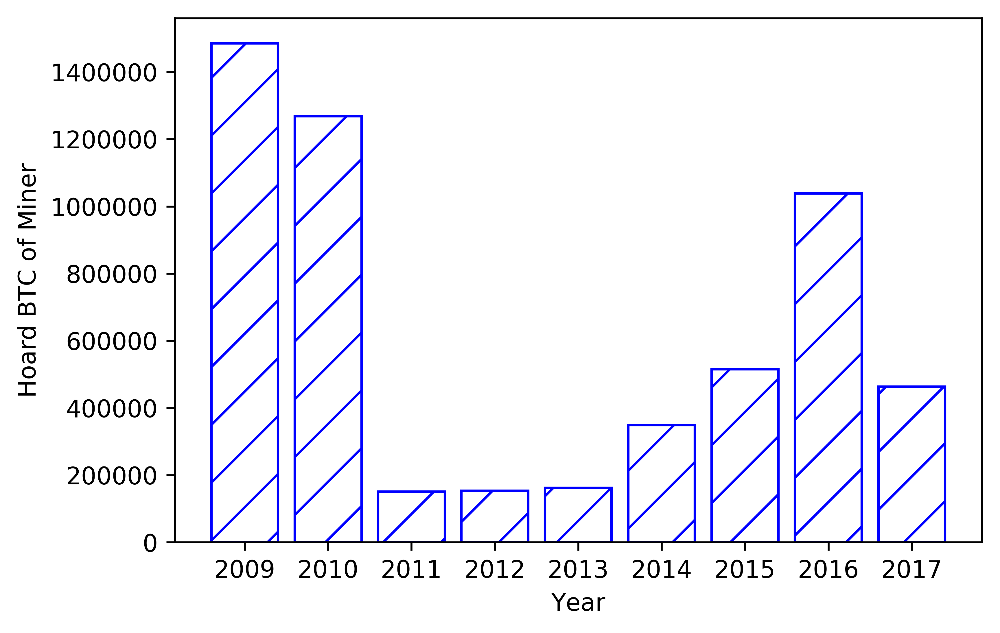

In [11]:
#plt.axes(xscale ='log', yscale = 'log')
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.bar(year,miner_hoard,hatch='/', color='white', edgecolor='blue')
plt.plot(year,price_change,color='red')
plt.xlabel('Year')
plt.ylabel('Hoard BTC of Miner')
plt.savefig('./figure/miner_hoard_every1.png', bbox_inches= 'tight')
plt.show()

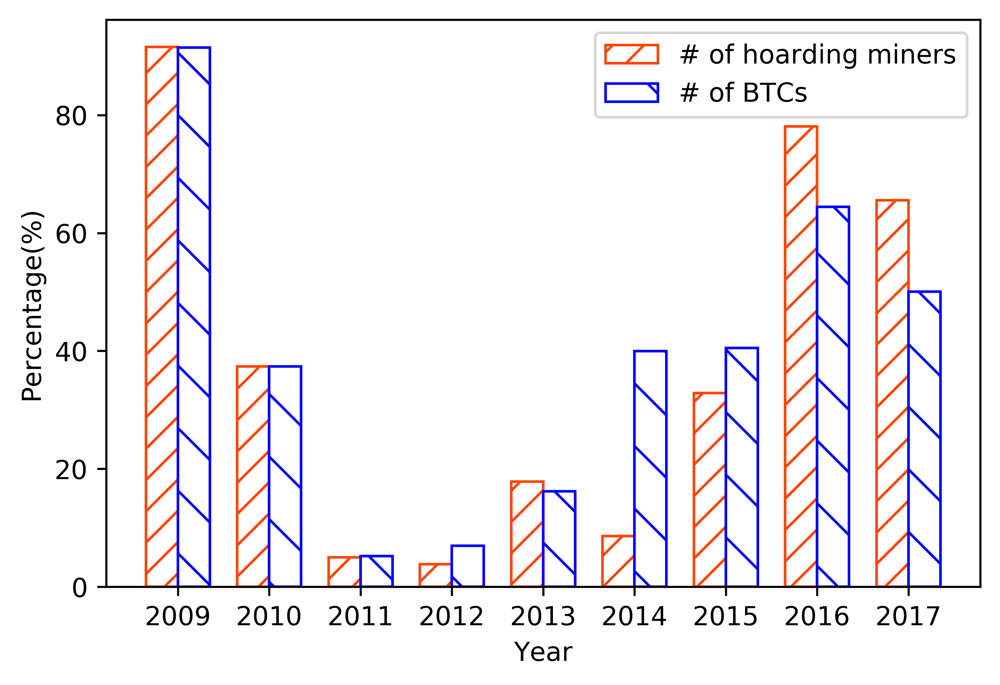

In [61]:
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
x = np.arange(9)
tick_label = ['2009','2010','2011','2012','2013','2014','2015','2016','2017']
y1 = miner_number
y2 = hoard_percentage
bar_width = 0.35
plt.bar(x,y1,bar_width,hatch='//', color='white', edgecolor='orangered',label = '# of hoarding miners')
plt.bar(x+bar_width,y2,bar_width,hatch='\\', color='white', edgecolor='blue',label = '# of BTCs')
plt.xticks(x+bar_width/2, tick_label)
plt.legend()
plt.ylabel('Percentage(%)')
plt.xlabel('Year')
plt.savefig('./figure/1.jpg', bbox_inches= 'tight')

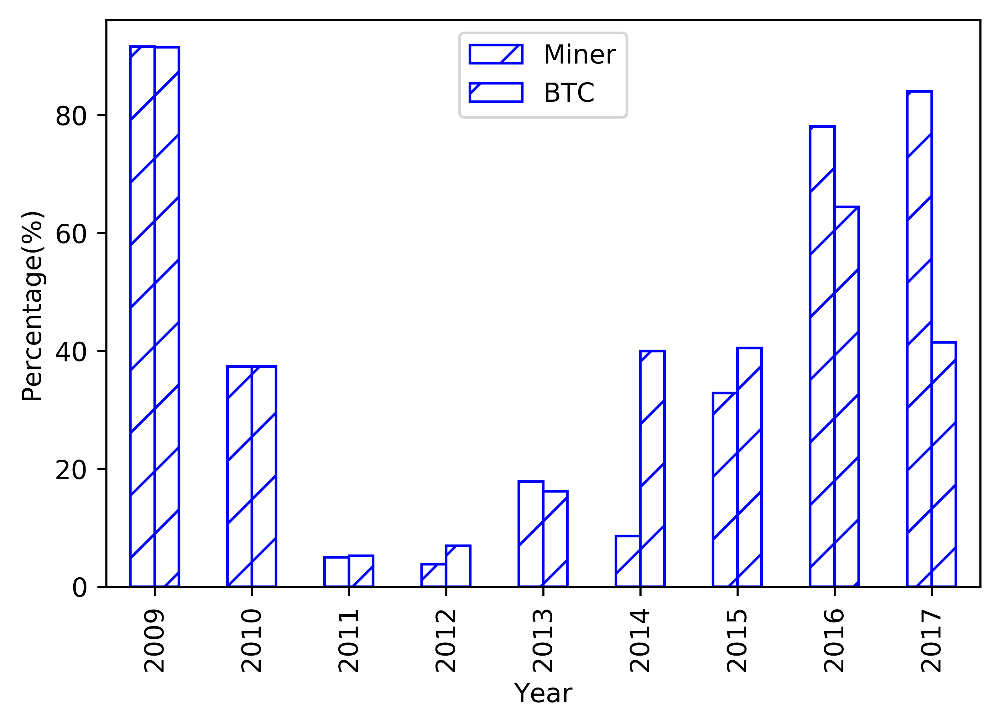

In [27]:
df=pd.DataFrame({'Miner':miner_number,'BTC':hoard_percentage})
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
#ax1 = df['Number'].plot(kind='bar', color = 'blue', label='Number')
#ax2 = ax1.twiny()
#df['BTC'].plot(kind='bar', color = 'purple',label='BTC', ax=ax2)
#ax2.grid(axis="x")
df.plot(kind='bar',hatch='/', color='white', edgecolor='blue').get_figure()
plt.xticks(np.arange(len(df['Miner'])),['2009','2010','2011','2012','2013','2014','2015','2016','2017'])
a = plt.bar(np.arange(len(x_sort)),y_sort,color=['r','g','b', 'c', 'm', 'y'])
autolabel(a)
plt.xlabel('Year')
plt.ylabel('Percentage(%)')
plt.savefig('./figure/1.jpg', bbox_inches= 'tight')

In [40]:
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
#plt.figure(figsize=(20, 4))
plt.bar(year,miner_number,hatch='/', color='white', edgecolor='blue')
plt.xlabel('Year')
plt.ylabel('percentage of miner')
plt.savefig('./figure/miner_hoard_number_percentage.png', bbox_inches= 'tight')
plt.show()

NameError: name 'year' is not defined

In [39]:
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率
plt.bar(year,hoard_percentage,hatch='/', color='white', edgecolor='blue')
plt.xlabel('Year')
plt.ylabel('percentage of hoard')
plt.savefig('./figure/miner_hoard_percentage.png', bbox_inches= 'tight')
plt.show()

NameError: name 'year' is not defined

In [26]:
def get_active_hoard(temp_number, num):
    temp_miner = miner_info[miner_info['miningdegree'] > num-1]
    temp_miner['hoard'] = temp_miner['income'] - temp_miner['pay']
    #all_number.append(len(temp_miner['miningdegree']))
    temp = 0
    for miner in temp_miner['hoard']:
        if miner > 0:
            temp = temp + 1
    temp_number.append(float(temp)*100/len(temp_miner['miningdegree']))

In [27]:
all_number = ["1","2","5","10","20","50"]
temp_number = []
get_active_hoard(temp_number, 1)
get_active_hoard(temp_number, 2)
get_active_hoard(temp_number, 5)
get_active_hoard(temp_number, 10)
get_active_hoard(temp_number, 20)
get_active_hoard(temp_number, 50)

NameError: name 'miner_info' is not defined

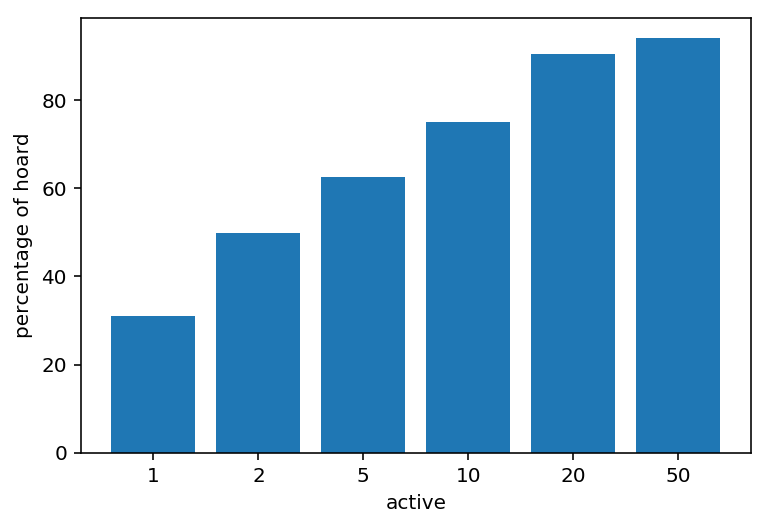

In [148]:
plt.bar(all_number,temp_number)
plt.xlabel('active')
plt.ylabel('percentage of hoard')
plt.savefig('./figure/active_hoard_percentage.jpg', bbox_inches= 'tight')
plt.show()